# Introduction to Data Visualization with Python

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from jupyterthemes import jtplot
import warnings

jtplot.style(theme='chesterish')
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format='retina'

## Chapter 1. Customizing plots

## 1. Introduction to Data Visualization with Python

### Reminder: Line plots

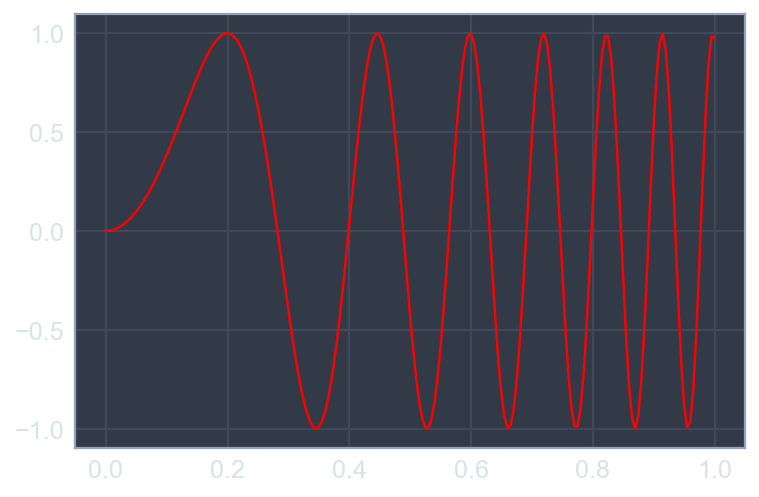

In [2]:
x = np.linspace(0, 1, 201)
y = np.sin((2*np.pi*x)**2)

plt.plot(x, y, 'red')
plt.show()

### Reminder: Scatter plots

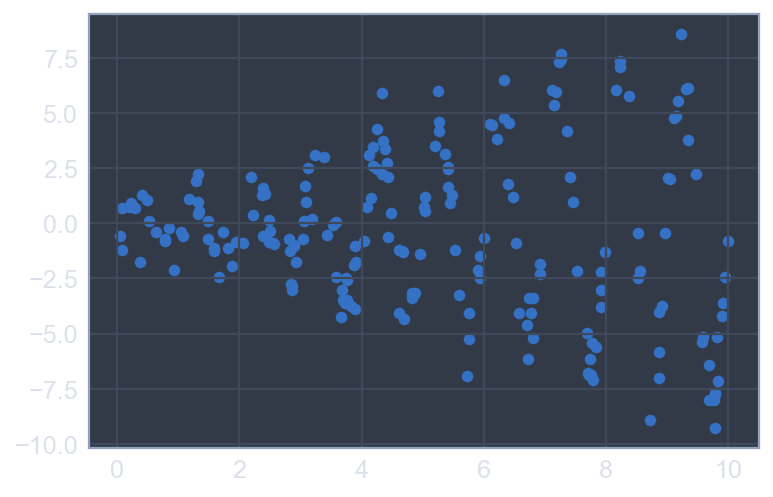

In [3]:
x = 10*np.random.rand(200,1)
y = (0.2 + 0.8*x) * np.sin(2*np.pi*x) + np.random.randn(200,1)

plt.scatter(x,y)
plt.show()

### Reminder: Histograms

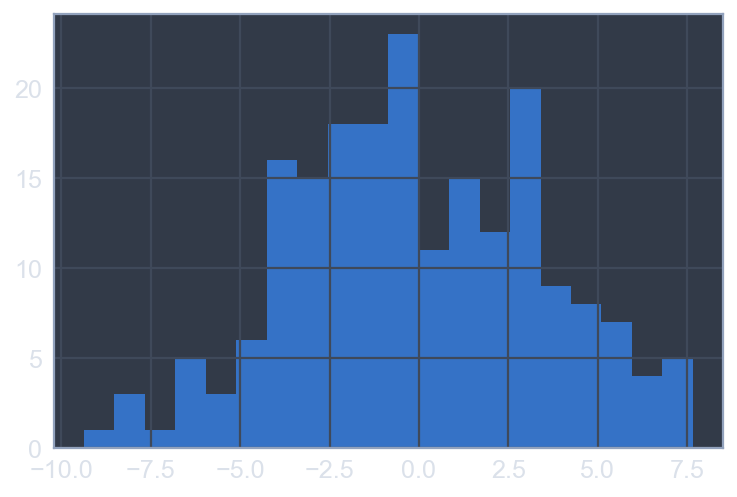

In [4]:
x = 10*np.random.rand(200,1)
y = (0.2 + 0.8*x) * np.sin(2*np.pi*x) + np.random.randn(200,1)

plt.hist(y, bins=20)
plt.show()

## 2. Plotting multiple graphs

In [5]:
weather = pd.read_csv('Introduction_to_Data_Visualization_with_Python/weather_data_austin_2010.csv',
                     index_col='Date', parse_dates=True)
weather.head()

,Temperature,DewPoint,Pressure
Date,,,
2010-01-01 00:00:00,46.2,37.5,1.0
2010-01-01 01:00:00,44.6,37.1,1.0
2010-01-01 02:00:00,44.1,36.9,1.0
2010-01-01 03:00:00,43.8,36.9,1.0
2010-01-01 04:00:00,43.5,36.8,1.0


### Strategies

* Plotting many graphs on common axes
* Creating axes within a figure
* Creating subplots within a figure

### Graphs on common axes

In [6]:
temperature = weather['Temperature']['2010-01-01':'2010-01-15']
dew_point = weather['DewPoint']['2010-01-01':'2010-01-15']

t = temperature.index

dates = temperature.index[::72]
labels = dates.strftime('%b %d %Y')

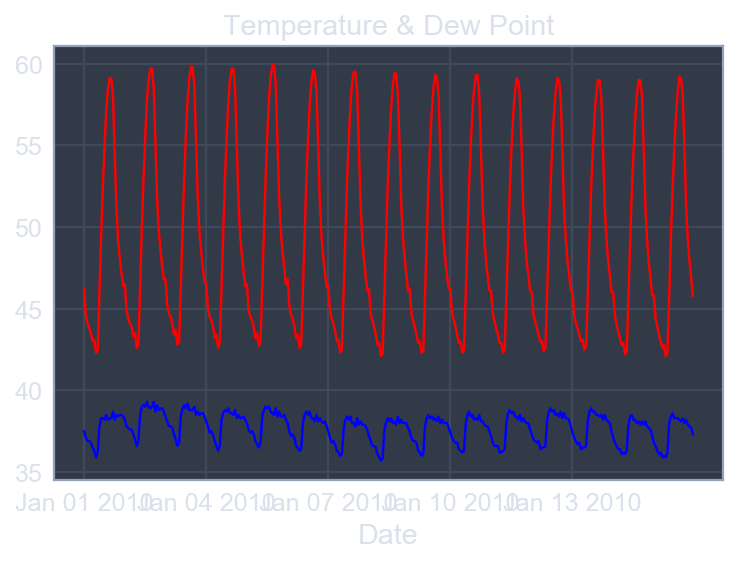

In [7]:
plt.plot(t, temperature, 'red')   
plt.plot(t, dew_point, 'blue') # Appears on same axes
    
plt.xlabel('Date')
plt.title('Temperature & Dew Point')
plt.xticks(dates, labels)
    
plt.show() # Renders plot objects to screen

### Using `axes()`

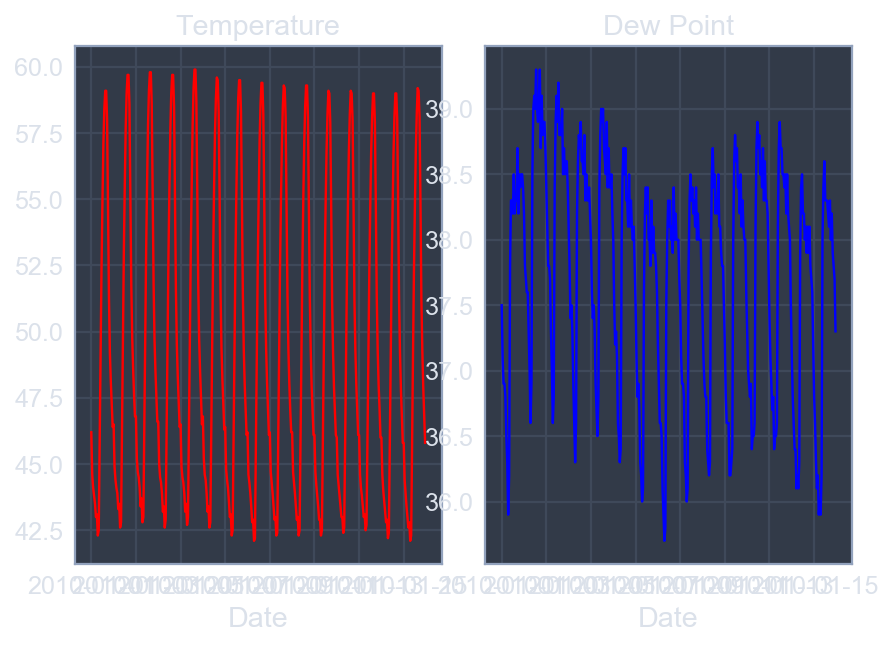

In [8]:
plt.axes([0.05,0.05,0.425,0.9]) 
plt.plot(t, temperature, 'red')
plt.xlabel('Date')
plt.title('Temperature')

plt.axes([0.525,0.05,0.425,0.9])
plt.plot(t, dew_point, 'blue')
plt.xlabel('Date')
plt.title('Dew Point')

plt.show()

### The `axes()` command

* Syntax: axes( [x_lo, y_lo, width, height] )
* Units between 0 and 1 (figure dimensions)

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/The_axes_command.png' alt='The axes command' width=400 align='left'>

### Using `subplot()`

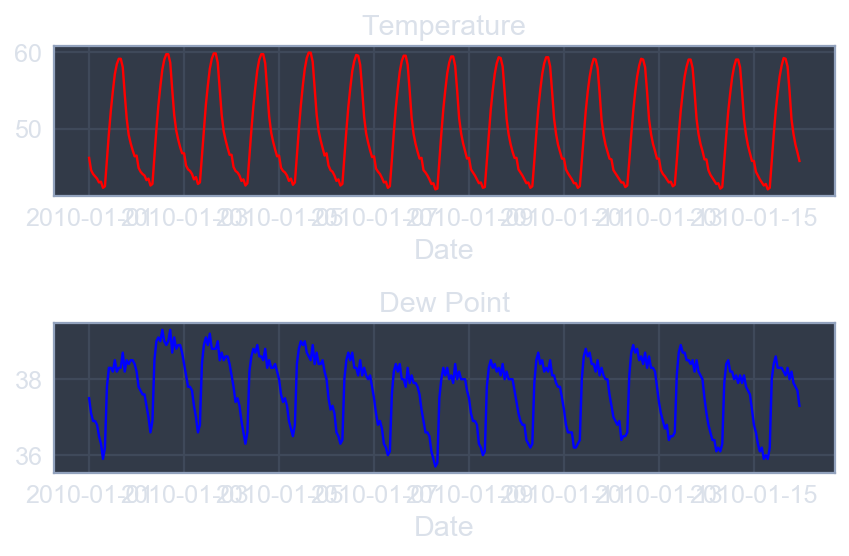

In [9]:
plt.subplot(2, 1, 1)
plt.plot(t, temperature, 'red')
plt.xlabel('Date')
plt.title('Temperature')

plt.subplot(2, 1, 2)
plt.plot(t, dew_point, 'blue')
plt.xlabel('Date')
plt.title('Dew Point')

plt.tight_layout()
plt.show()

### The `subplot()` command

* Syntax: subplot(nrows, ncols, nsubplot)
* Subplot ordering:
    * Row-wise from top left
    * Indexed from 1

### №1 Multiple plots on single axis

* Add a `'blue'` line plot of the % of degrees awarded to women in the Physical Sciences (`physical_sciences`) from 1970 to 2011 (`year`). Note that the x-axis should be specified first
* Add a `'red'` line plot of the % of degrees awarded to women in Computer Science (`computer_science`) from 1970 to 2011 (`year`)
* Use `plt.show()` to display the figure with the curves on the same axes

In [10]:
degrees = pd.read_csv('Introduction_to_Data_Visualization_with_Python/percent-bachelors-degrees-women-usa.csv')

year = degrees['Year']
physical_sciences = degrees['Physical Sciences']
computer_science = degrees['Computer Science']

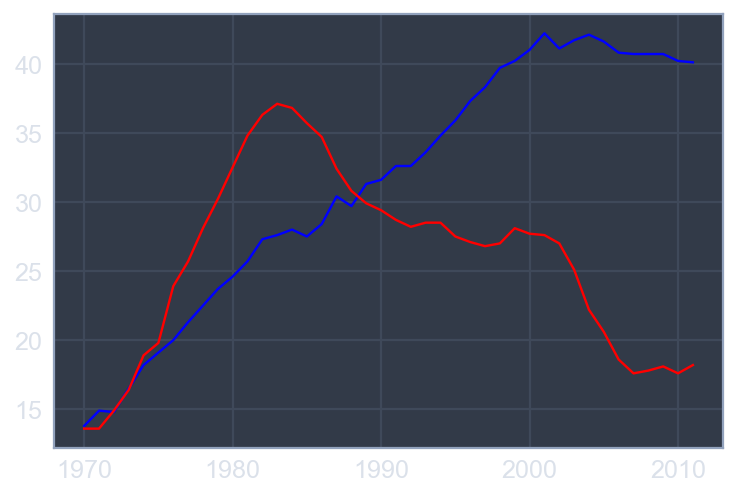

In [11]:
plt.plot(year, physical_sciences, color='blue')
plt.plot(year, computer_science, color='red')

plt.show()

### №2 Using `axes()`

* Create a set of plot axes with lower corner xlo and ylo of `0.05` and `0.05`, width of `0.425`, and height of `0.9` (in units relative to the figure dimension)
    * Note: Remember to pass these coordinates to `plt.axes()` in the form of a list: `[xlo, ylo, width, height]`
* Plot the percentage of degrees awarded to women in Physical Sciences in blue in the active axes just created
* Create a set of plot axes with lower corner xlo and ylo of `0.525` and `0.05`, width of `0.425`, and height of `0.9` (in units relative to the figure dimension)
* Plot the percentage of degrees awarded to women in Computer Science in red in the active axes just created

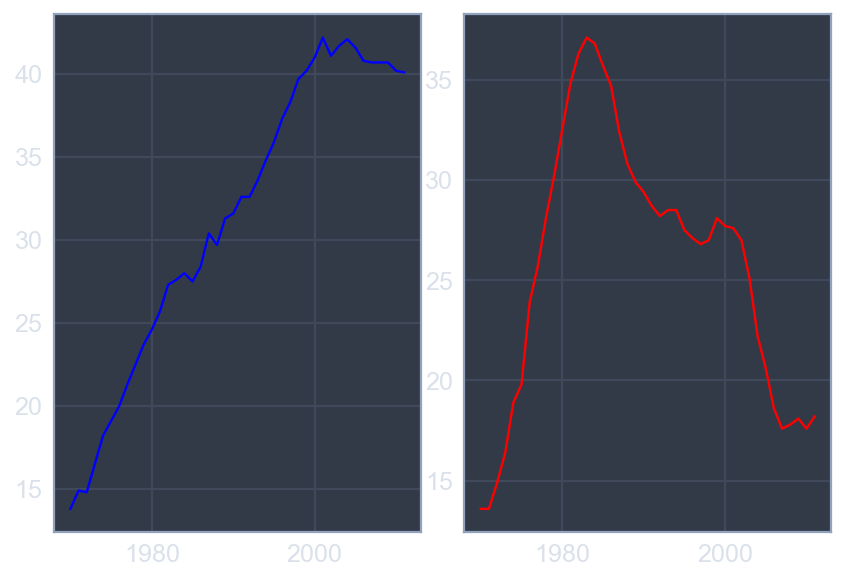

In [12]:
plt.axes([.05, .05, .425, .9])
plt.plot(year, physical_sciences, color='blue')

plt.axes([.525, .05, .425, .9])
plt.plot(year, computer_science, color='red')

plt.show()

### №3 Using `subplot()` (1)

* Use `plt.subplot()` to create a figure with 1x2 subplot layout & make the first subplot active
* Plot the percentage of degrees awarded to women in Physical Sciences in blue in the active subplot
* Use `plt.subplot()` again to make the second subplot active in the current 1x2 subplot grid
* Plot the percentage of degrees awarded to women in Computer Science in red in the active subplot

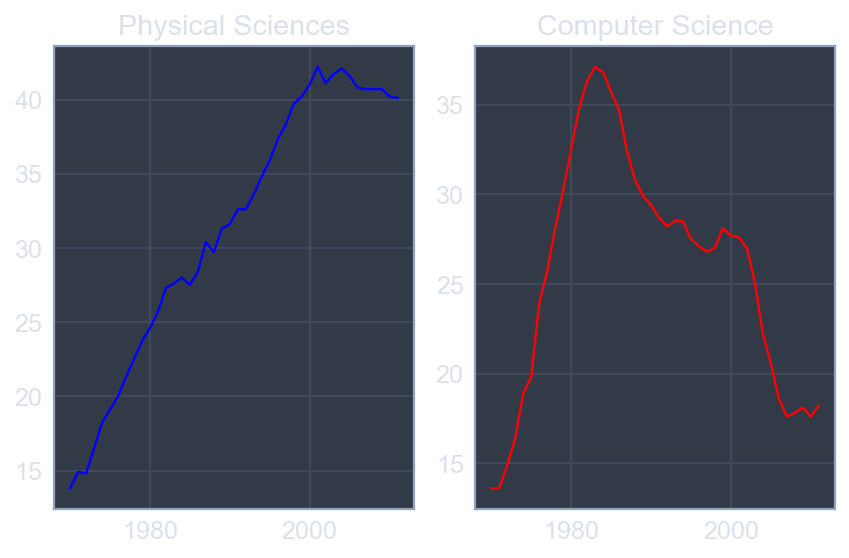

In [13]:
plt.subplot(1, 2, 1)
plt.plot(year, physical_sciences, color='blue')
plt.title('Physical Sciences')

plt.subplot(1, 2, 2)
plt.plot(year, computer_science, color='red')
plt.title('Computer Science')

plt.tight_layout()
plt.show()

### №4 Using `subplot()` (2)

* Create a figure with 2×2 subplot layout, make the top, left subplot active, and plot the % of degrees awarded to women in Physical Sciences in blue in the active subplot
* Make the top, right subplot active in the current 2×2 subplot grid and plot the % of degrees awarded to women in Computer Science in red in the active subplot
* Make the bottom, left subplot active in the current 2×2 subplot grid and plot the % of degrees awarded to women in Health Professions in green in the active subplot
* Make the bottom, right subplot active in the current 2×2 subplot grid and plot the % of degrees awarded to women in Education in yellow in the active subplo

In [14]:
health = degrees['Health Professions']
education = degrees['Education']

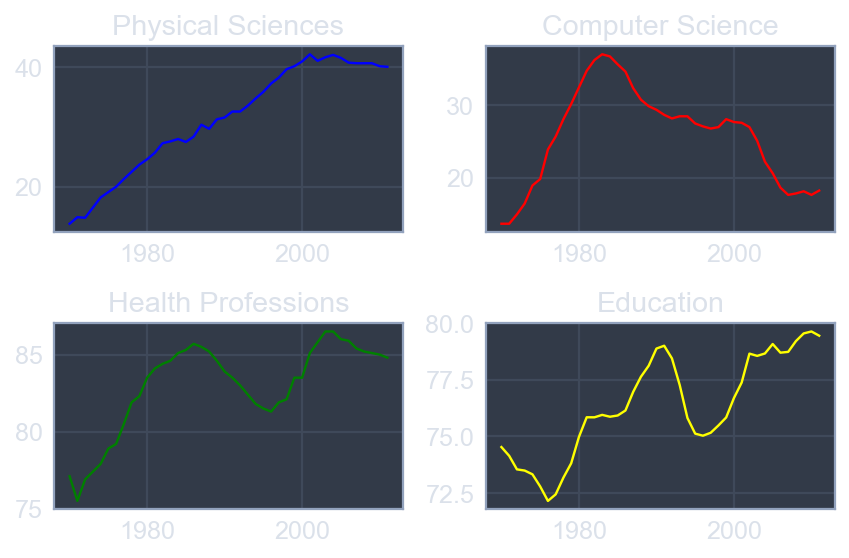

In [15]:
plt.subplot(2, 2, 1)
plt.plot(year, physical_sciences, color='blue')
plt.title('Physical Sciences')

plt.subplot(2, 2, 2)
plt.plot(year, computer_science, color='red')
plt.title('Computer Science')

plt.subplot(2, 2, 3)
plt.plot(year, health, color='green')
plt.title('Health Professions')

plt.subplot(2, 2, 4)
plt.plot(year, education, color='yellow')
plt.title('Education')

plt.tight_layout()
plt.show()

## 3. Customizing axes

### Controlling axis extents

* `axis`([`xmin`, `xmax`, `ymin`, `ymax`]) sets axis extents
* Control over individual axis extents
    * `xlim([xmin, xmax])`
    * `ylim([ymin, ymax])`
* Can use tuples, lists for extents
    * e.g., `xlim((-2, 3))` works
    * e.g., `xlim([-2, 3])` works also

### GDP over time

In [16]:
gdp_us = pd.read_csv('Introduction_to_Data_Visualization_with_Python/gdp_usa.csv',
                     index_col='DATE', parse_dates=True)

yr = pd.Series(gdp_us.index.year)
gdp = gdp_us['VALUE']

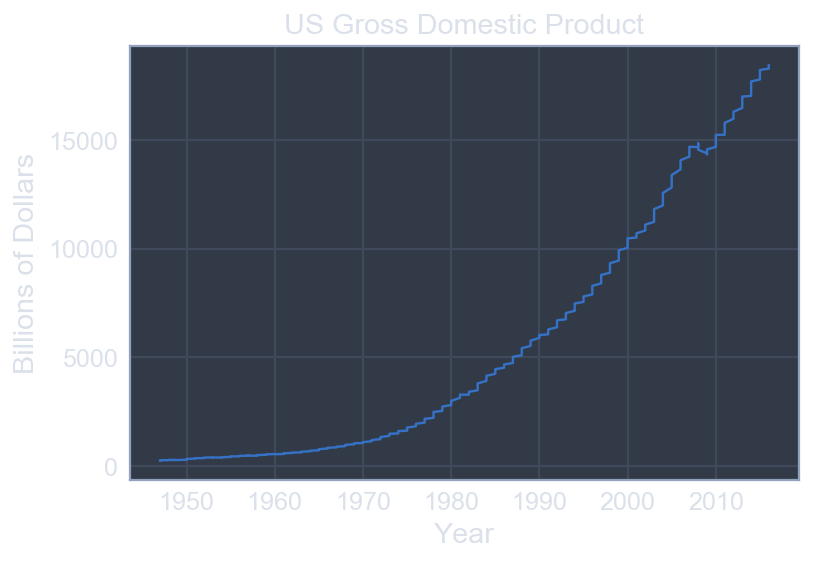

In [17]:
plt.plot(yr, gdp)

plt.xlabel('Year')
plt.ylabel('Billions of Dollars')
plt.title('US Gross Domestic Product')

plt.show()

### Using `xlim()`

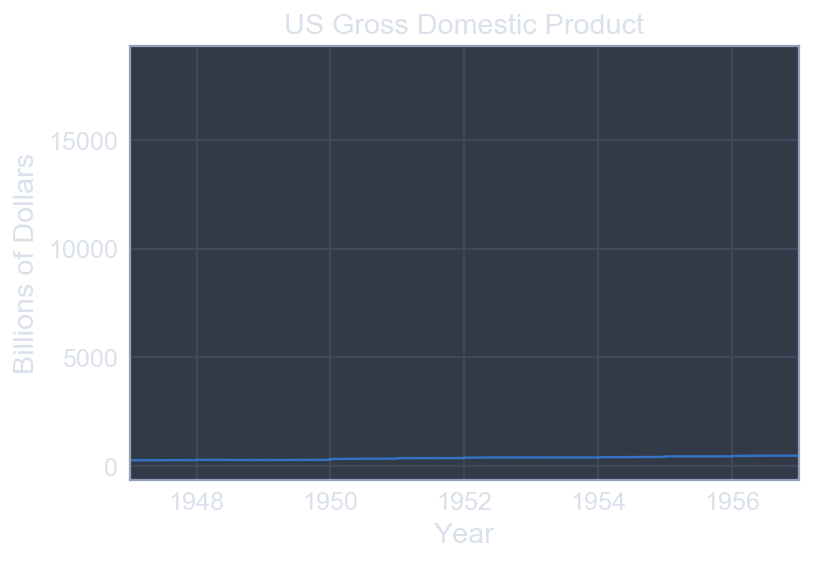

In [18]:
plt.plot(yr, gdp)
    
plt.xlabel('Year')
plt.ylabel('Billions of Dollars')

plt.title('US Gross Domestic Product')
plt.xlim((1947, 1957))
    
plt.show()

### Using `xlim()` & `ylim()`

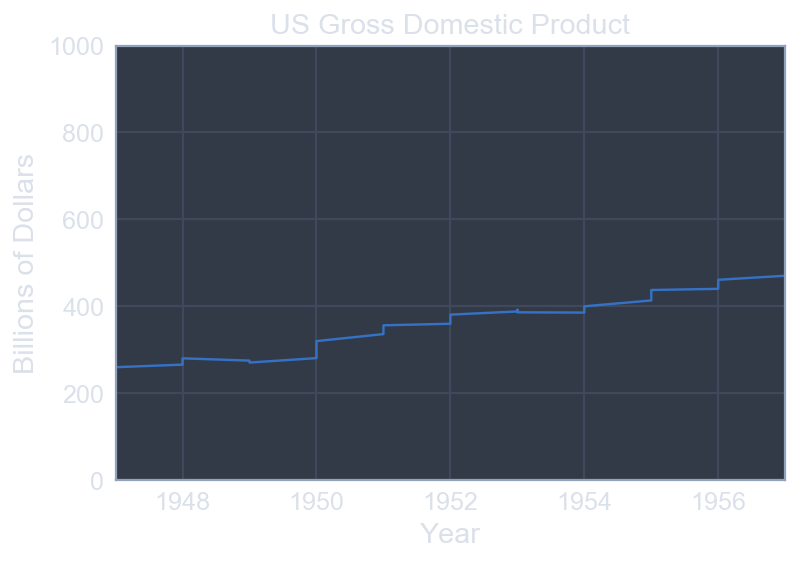

In [19]:
plt.plot(yr, gdp)

plt.xlabel('Year')
plt.ylabel('Billions of Dollars')

plt.title('US Gross Domestic Product')

plt.xlim((1947, 1957))
plt.ylim((0, 1000))

plt.show()

### Using `axis()`

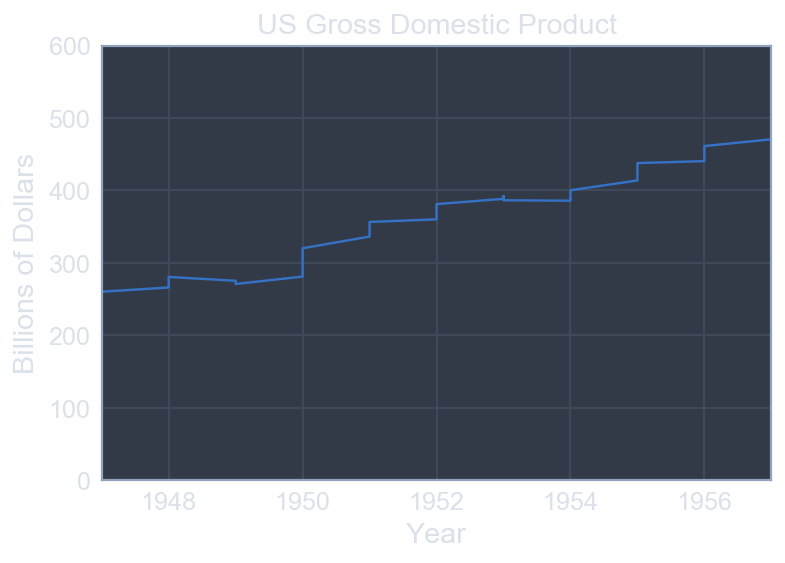

In [20]:
plt.plot(yr, gdp)
    
plt.xlabel('Year')
plt.ylabel('Billions of Dollars')
    
plt.title('US Gross Domestic Product')
plt.axis((1947, 1957, 0, 600))
    
plt.show()

### Other `axis()` options

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/Other_axis_options.png' alt='Other axis options' width=400 align='left'>

### Using `axis(‘equal’)`

```python
In [1]: plt.subplot(2, 1, 1)
    
In [2]: plt.plot(x, y, 'red')
    
In [3]: plt.title('default axis')
    
In [4]: plt.subplot(2, 1, 2)
    
In [5]: plt.plot(x, y, 'red')
    
In [6]: plt.axis('equal')
    
In [7]: plt.title('axis equal')
    
In [8]: plt.tight_layout()
    
In [9]: plt.show()
```

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/Using_axis_equal.png' alt='Using axis(equal)' width=400 align='left'>

### №5 Using `xlim()`, `ylim()`

* Use `plt.xlim()` to set the x-axis range to the period between the years 1990 and 2010
* Use `plt.ylim()` to set the y-axis range to the interval between 0% and 50% of degrees awarded
* Display the final figure with `plt.show()` and save the output to `'xlim_and_ylim.png'`

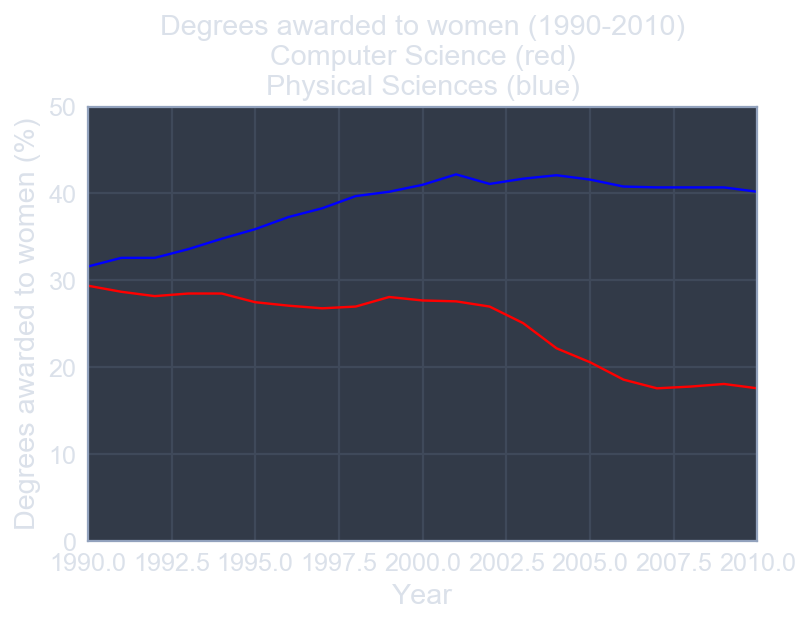

<Figure size 432x288 with 0 Axes>

In [21]:
plt.plot(year,computer_science, color='red') 
plt.plot(year, physical_sciences, color='blue')

plt.xlabel('Year')
plt.ylabel('Degrees awarded to women (%)')

plt.xlim([1990, 2010])
plt.ylim([0, 50])

plt.title('Degrees awarded to women (1990-2010)\nComputer Science (red)\nPhysical Sciences (blue)')
plt.show()

plt.savefig('Introduction_to_Data_Visualization_with_Python/Pictures/xlim_and_ylim.png')

### №6 Using `axis()`

* Use `plt.axis()` to select the time period between 1990 and 2010 on the x-axis as well as the interval between 0 and 50% awarded on the y-axis
* Save the resulting plot as `'axis_limits.png'`

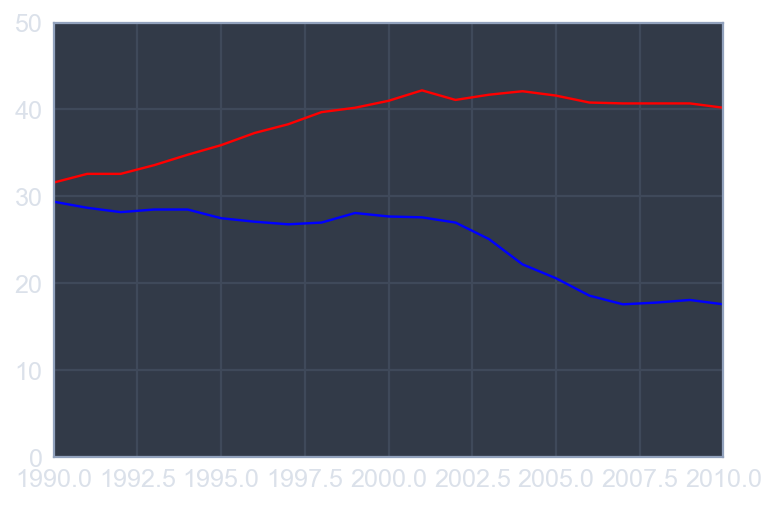

<Figure size 432x288 with 0 Axes>

In [22]:
plt.plot(year,computer_science, color='blue')
plt.plot(year, physical_sciences,color='red')

plt.axis([1990, 2010, 0, 50])

plt.show()
plt.savefig('Introduction_to_Data_Visualization_with_Python/Pictures/axis_limits.png')

## 4. Legends, annotations, and styles

### Legends

* provide labels for overlaid points and curves

In [23]:
iris = pd.read_csv('Introduction_to_Data_Visualization_with_Python/iris_data.csv', sep=';')

setosa_len = iris[iris['species'] == 'Iris-setosa']['sepal_length']
versicolor_len = iris[iris['species'] == 'Iris-versicolor']['sepal_length']
virginica_len = iris[iris['species'] == 'Iris-virginica']['sepal_length']

setosa_wid = iris[iris['species'] == 'Iris-setosa']['sepal_width']
versicolor_wid = iris[iris['species'] == 'Iris-versicolor']['sepal_width']
virginica_wid = iris[iris['species'] == 'Iris-virginica']['sepal_width']

### Using `legend()`

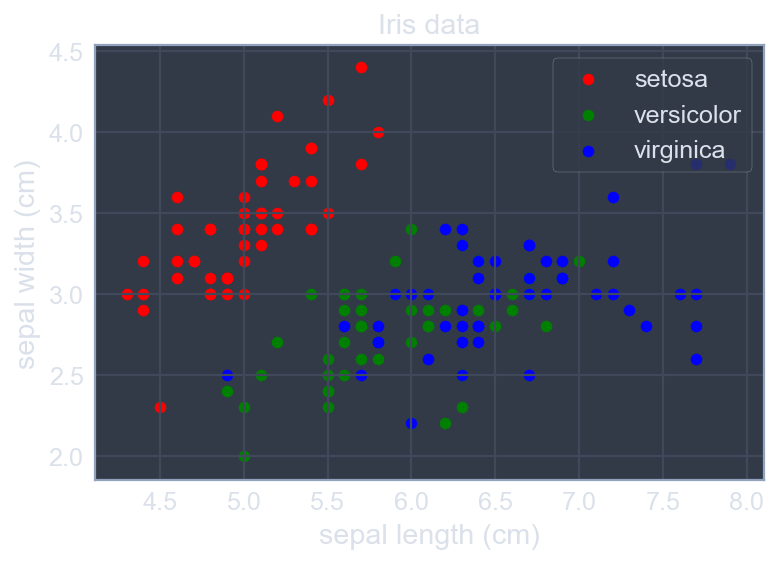

In [24]:
plt.scatter(setosa_len, setosa_wid, marker='o', color='red', label='setosa')
plt.scatter(versicolor_len, versicolor_wid, marker='o', color='green', label='versicolor')
plt.scatter(virginica_len, virginica_wid, marker='o', color='blue', label='virginica')

plt.legend(loc='upper right')
plt.title('Iris data')

plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')

plt.show()

### Legend locations

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/Legend_locations.png' alt='Legend locations' width=400 align='left'>

### Plot annotations

* Text labels and arrows using annotate() method
* Flexible specification of coordinates
* Keyword arrowprops: dict of arrow properties
    * width
    * color
    * etc.

### Using `annotate()` for text

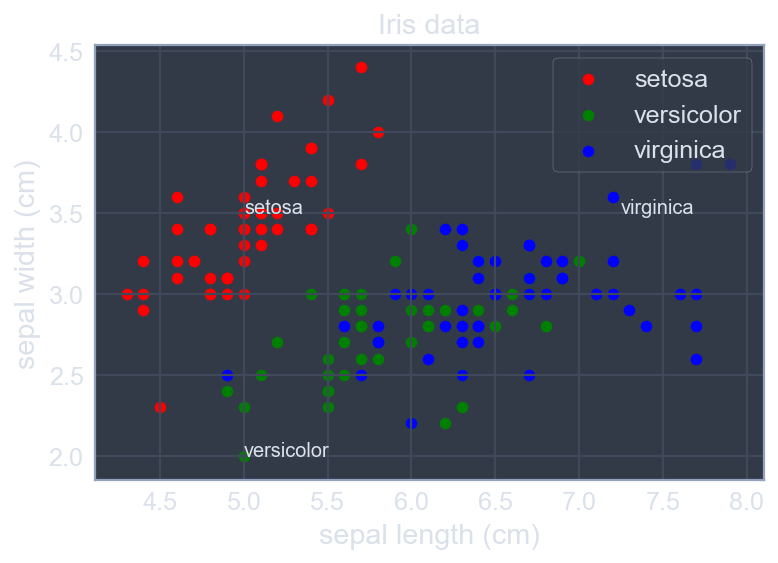

In [25]:
plt.scatter(setosa_len, setosa_wid, marker='o', color='red', label='setosa')
plt.scatter(versicolor_len, versicolor_wid, marker='o', color='green', label='versicolor')
plt.scatter(virginica_len, virginica_wid, marker='o', color='blue', label='virginica')

plt.legend(loc='upper right')
plt.title('Iris data')

plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')

plt.annotate('setosa', xy=(5.0, 3.5))
plt.annotate('virginica', xy=(7.25, 3.5))
plt.annotate('versicolor', xy=(5.0, 2.0))

plt.show()

### Options for `annotate()`

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/Options_for_annotate.png' alt='Options for annotate' width=350 align='left'>

### Using `annotate()` for arrows

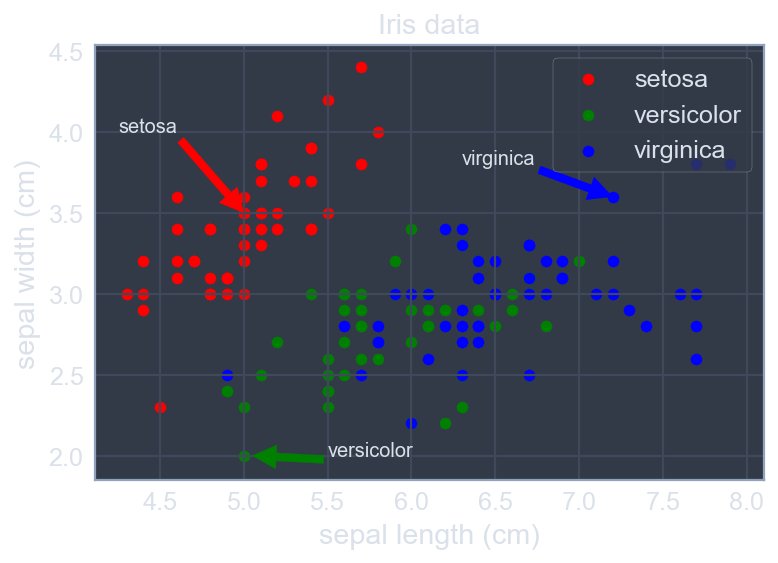

In [26]:
plt.scatter(setosa_len, setosa_wid, marker='o', color='red', label='setosa')
plt.scatter(versicolor_len, versicolor_wid, marker='o', color='green', label='versicolor')
plt.scatter(virginica_len, virginica_wid, marker='o', color='blue', label='virginica')

plt.legend(loc='upper right')
plt.title('Iris data')

plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')

plt.annotate('setosa', xy=(5.0, 3.5), xytext=(4.25, 4.0), arrowprops={'color':'red'})
plt.annotate('virginica', xy=(7.2, 3.6), xytext=(6.3, 3.8), arrowprops={'color':'blue'})
plt.annotate('versicolor', xy=(5.05, 2.00), xytext=(5.5, 2.00), arrowprops={'color':'green'})

plt.show()

### Working with plot styles

* Style sheets in Matplotlib
* Defaults for lines, points, backgrounds, etc.
* Switch styles globally with `plt.style.use()`
* `plt.style.available`: list of styles

### `ggplot style`

```python
plt.scatter(setosa_len, setosa_wid, marker='o', color='red', label='setosa')
plt.scatter(versicolor_len, versicolor_wid, marker='o', color='green', label='versicolor')
plt.scatter(virginica_len, virginica_wid, marker='o', color='blue', label='virginica')

plt.legend(loc='upper right')
plt.title('Iris data')

plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')

plt.annotate('setosa', xy=(5.0, 3.5), xytext=(4.25, 4.0), arrowprops={'color':'red'})
plt.annotate('virginica', xy=(7.2, 3.6), xytext=(6.3, 3.8), arrowprops={'color':'blue'})
plt.annotate('versicolor', xy=(5.05, 2.00), xytext=(5.5, 2.00), arrowprops={'color':'green'})

plt.style.use('ggplot')

plt.show()
```

<img src='[13]Introduction_to_Data_Visualization_with_Python/Pictures/ggplot_style.png' alt='ggplot style' width=450 align='left'>

### `fivethirtyeight style`

```python
plt.scatter(setosa_len, setosa_wid, marker='o', color='red', label='setosa')
plt.scatter(versicolor_len, versicolor_wid, marker='o', color='green', label='versicolor')
plt.scatter(virginica_len, virginica_wid, marker='o', color='blue', label='virginica')

plt.legend(loc='upper right')
plt.title('Iris data')

plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')

plt.annotate('setosa', xy=(5.0, 3.5), xytext=(4.25, 4.0), arrowprops={'color':'red'})
plt.annotate('virginica', xy=(7.2, 3.6), xytext=(6.3, 3.8), arrowprops={'color':'blue'})
plt.annotate('versicolor', xy=(5.05, 2.00), xytext=(5.5, 2.00), arrowprops={'color':'green'})

plt.style.use('fivethirtyeight')

plt.show()
```

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/fivethirtyeight_style.png' alt='fivethirtyeight style' width=450 align='left'>

### №7 Using `legend()`

* Modify the plot command provided that draws the enrollment of women in Computer Science over time so that the curve is labelled `'Computer Science'` in the legend
* Modify the plot command provided that draws the enrollment of women in the Physical Sciences over time so that the curve is labelled `'Physical Sciences'` in the legend
* Add a legend at the lower center (i.e., `loc='lower center'`)

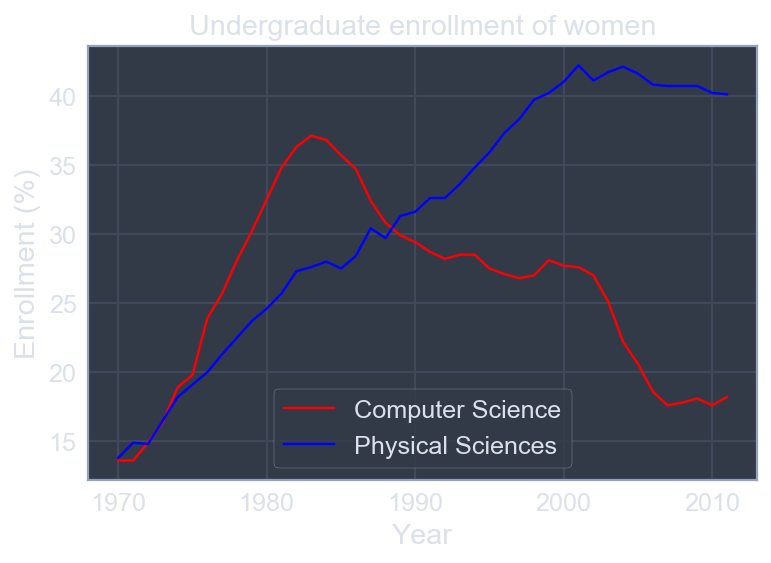

In [27]:
plt.plot(year, computer_science, color='red', label='Computer Science') 
plt.plot(year, physical_sciences, color='blue', label='Physical Sciences')

plt.legend(loc='lower center')

plt.xlabel('Year')
plt.ylabel('Enrollment (%)')
plt.title('Undergraduate enrollment of women')

plt.show()

### №8 Using `annotate()`

* Compute the maximum enrollment of women in Computer Science using the `.max()` method.
* Calculate the year in which there was maximum enrollment of women in Computer Science using the `.argmax()` method
* Annotate the plot with an arrow at the point of peak women enrolling in Computer Science
    * Label the arrow `'Maximum'`. The parameter for this is `s`, but you don't have to specify it
    * Pass in the arguments to `xy` and `xytext` as tuples
    * For `xy`, use the `yr_max` and `cs_max` that you computed
    * For `xytext`, use `(yr_max+5, cs_max+5)` to specify the displacement of the label from the tip of the arrow
    * Draw the arrow by specifying the keyword argument `arrowprops=dict(facecolor='black')`. The single letter shortcut for `'black'` is `'k'`

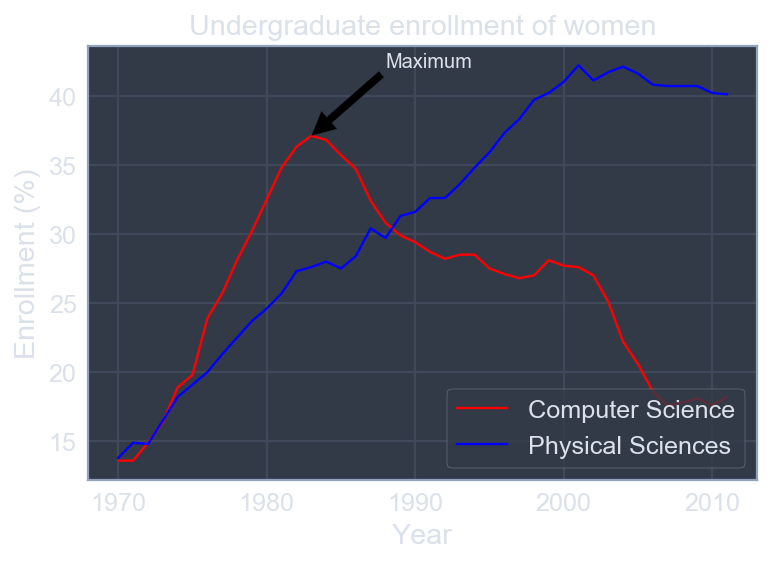

In [28]:
plt.plot(year, computer_science, color='red', label='Computer Science') 
plt.plot(year, physical_sciences, color='blue', label='Physical Sciences')
plt.legend(loc='lower right')

cs_max = computer_science.max()
yr_max = year[computer_science.argmax()]

plt.annotate('Maximum', xy=(yr_max, cs_max), xytext=(yr_max+5, cs_max+5),
             arrowprops=dict(facecolor='black'))

plt.xlabel('Year')
plt.ylabel('Enrollment (%)')
plt.title('Undergraduate enrollment of women')

plt.show()

### №9 Modifying styles

In [29]:
print(plt.style.available)

['seaborn-dark', 'seaborn-darkgrid', 'seaborn-ticks', 'fivethirtyeight', 'seaborn-whitegrid', 'classic', '_classic_test', 'fast', 'seaborn-talk', 'seaborn-dark-palette', 'seaborn-bright', 'seaborn-pastel', 'grayscale', 'seaborn-notebook', 'ggplot', 'seaborn-colorblind', 'seaborn-muted', 'seaborn', 'Solarize_Light2', 'seaborn-paper', 'bmh', 'tableau-colorblind10', 'seaborn-white', 'dark_background', 'seaborn-poster', 'seaborn-deep']


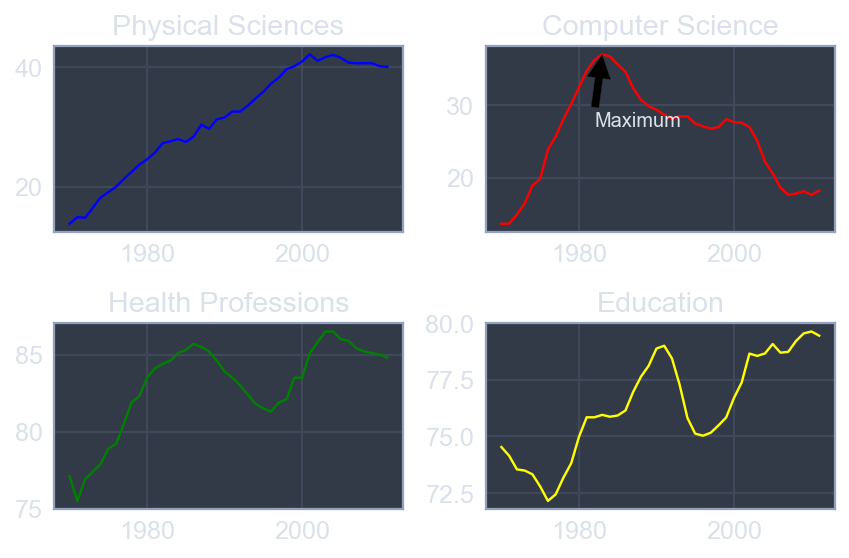

In [30]:
# plt.style.use('ggplot')
plt.subplot(2, 2, 1)
plt.plot(year, physical_sciences, color='blue')
plt.title('Physical Sciences')

plt.subplot(2, 2, 2)
plt.plot(year, computer_science, color='red')
plt.title('Computer Science')

cs_max = computer_science.max()
yr_max = year[computer_science.argmax()]
plt.annotate('Maximum', xy=(yr_max, cs_max), xytext=(yr_max-1, cs_max-10), arrowprops=dict(facecolor='black'))

plt.subplot(2, 2, 3)
plt.plot(year, health, color='green')
plt.title('Health Professions')

plt.subplot(2, 2, 4)
plt.plot(year, education, color='yellow')
plt.title('Education')

plt.tight_layout()
plt.show()

## Chapter 2. Plotting 2D arrays

## 5. Working with 2D arrays

### Reminder: NumPy arrays

* Homogeneous in type
* Calculations all at once
* Indexing with brackets:
    * A[_index_] for 1D array
    * A[_index0_, _index1_] for 2D array

### Reminder: slicing arrays

* Slicing: 1D arrays: A[*slice*], 2D arrays: A[*slice0, slice1*]
* Slicing: *slice = start:stop:stride*
    * Indexes from *start* to *stop-1* in steps of *stride*
    * Missing *start*: implicitly at *beginning* of array
    * Missing *stop*: implicitly at *end* of array
    * Missing *stride*: implicitly *stride 1*
* Negative indexes/slices: count from *end of array*

### 2D arrays & images

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/2D_arrays_images.png' alt='2D arrays & images' width=500 align='left'>

### 2D arrays & functions

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/2D_arrays_functions.png' alt='2D arrays & functions' width=400 align='left'>

### Using `meshgrid()`

In [31]:
u = np.linspace(-2, 2, 3)
v = np.linspace(-1, 1, 5)

X,Y = np.meshgrid(u, v)

Z = X**2/25 + Y**2/4

In [32]:
Y

array([[-1. , -1. , -1. ],
       [-0.5, -0.5, -0.5],
       [ 0. ,  0. ,  0. ],
       [ 0.5,  0.5,  0.5],
       [ 1. ,  1. ,  1. ]])

In [33]:
print('X:\n',X)

X:
 [[-2.  0.  2.]
 [-2.  0.  2.]
 [-2.  0.  2.]
 [-2.  0.  2.]
 [-2.  0.  2.]]


In [34]:
print('Y:\n',Y)

Y:
 [[-1.  -1.  -1. ]
 [-0.5 -0.5 -0.5]
 [ 0.   0.   0. ]
 [ 0.5  0.5  0.5]
 [ 1.   1.   1. ]]


### Meshgrid

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/Meshgrid.png' alt='Meshgrid' width=300 align='left'>

### Sampling on a grid

In [35]:
u = np.linspace(-2, 2, 3)
v = np.linspace(-1, 1, 5)

X,Y = np.meshgrid(u, v)
Z = X**2/25 + Y**2/4

print('Z:\n', Z)

Z:
 [[0.41   0.25   0.41  ]
 [0.2225 0.0625 0.2225]
 [0.16   0.     0.16  ]
 [0.2225 0.0625 0.2225]
 [0.41   0.25   0.41  ]]


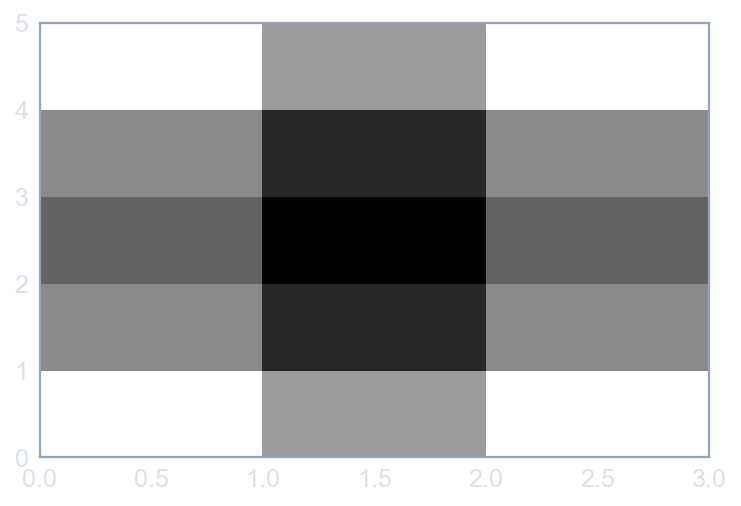

In [36]:
plt.set_cmap('gray')
plt.pcolor(Z)
plt.show()

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/2D_arrays_functions.png' alt='Sampling on a grid' width=400 align='left'>

### Orientations of 2D arrays & images

In [37]:
Z = np.array([[1, 2, 3], [4, 5, 6]])
print('Z:\n', Z)

Z:
 [[1 2 3]
 [4 5 6]]


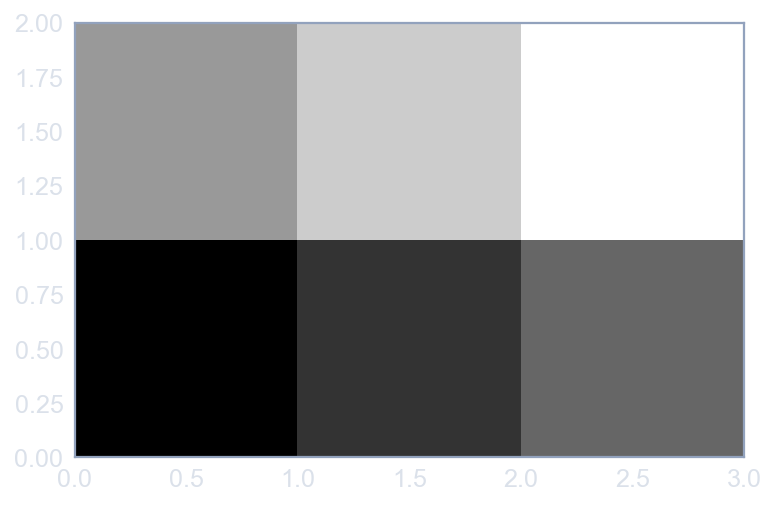

In [38]:
plt.pcolor(Z)
plt.show()

### №10 Generating meshes

* Generate two one-dimensional arrays `u` and `v` using `np.linspace()`. The array `u` should contain 41 values uniformly spaced beween -2 and +2. The array `v` should contain 21 values uniformly spaced between -1 and +1
* Construct two two-dimensional arrays `X` and `Y` from `u` and `v` using `np.meshgrid()`. The resulting arrays should have shape `(41,21)`
* After the array `Z` is computed using `X` and `Y`, visualize the array `Z` using `plt.pcolor()` and `plt.show()`
* Save the resulting figure as `'sine_mesh.png'`

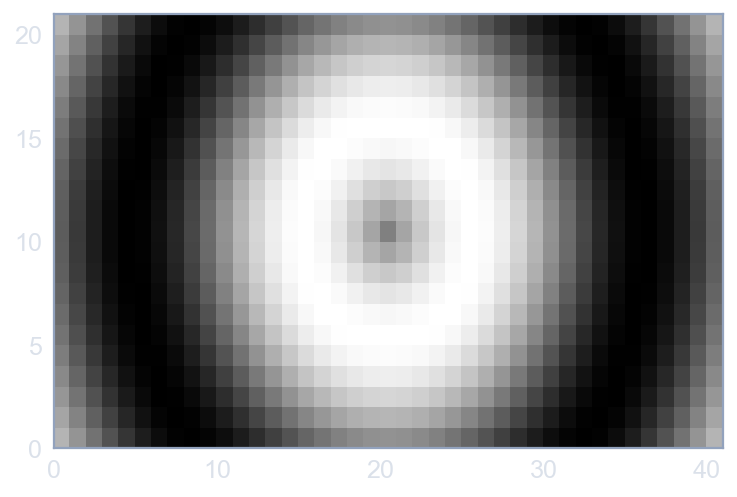

<Figure size 432x288 with 0 Axes>

In [39]:
u = np.linspace(-2, 2, 41)
v = np.linspace(-1, 1, 21)

X,Y = np.meshgrid(u, v)

Z = np.sin(3*np.sqrt(X**2 + Y**2)) 

plt.pcolor(Z)
plt.show()

plt.savefig('Introduction_to_Data_Visualization_with_Python/Pictures/sine_mesh.png')

### №11 Array orientation

* The commands below produce the pseudocolor plot above using a Numpy array `A`
* Which of the commands below could have generated `A`?

```python
plt.pcolor(A, cmap='Blues')
plt.colorbar()
plt.show()
```

* `A = np.array([[1, 2, 1], [0, 0, 1], [-1, 1, 1]])`
* *`A = np.array([[1, 0, -1], [2, 0, 1], [1, 1, 1]])`*
* `A = np.array([[-1, 0, 1], [1, 0, 2], [1, 1, 1]])`
* `A = np.array([[1, 1, 1], [2, 0, 1], [1, 0, -1]])`

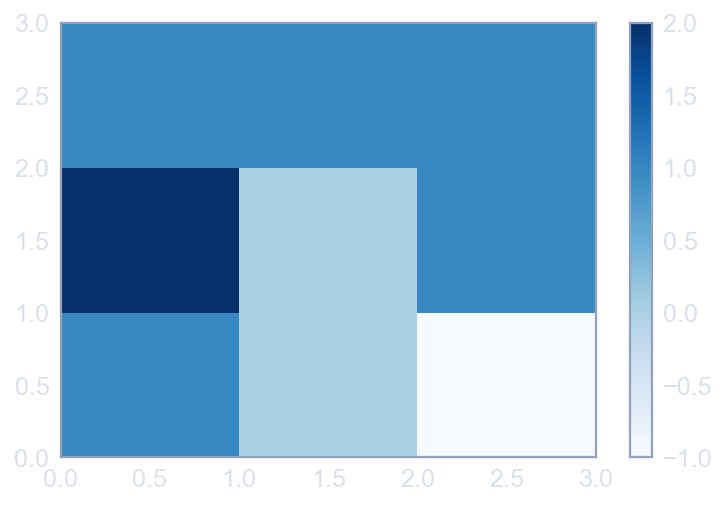

In [40]:
A = np.array([[1, 0, -1], [2, 0, 1], [1, 1, 1]])

plt.pcolor(A, cmap='Blues')
plt.colorbar()

plt.show()

## 6. Visualizing bivariate functions

### Bivariate functions

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/2D_arrays_functions.png' alt='Sampling on a grid' width=400 align='left'>

### Pseudocolor plot

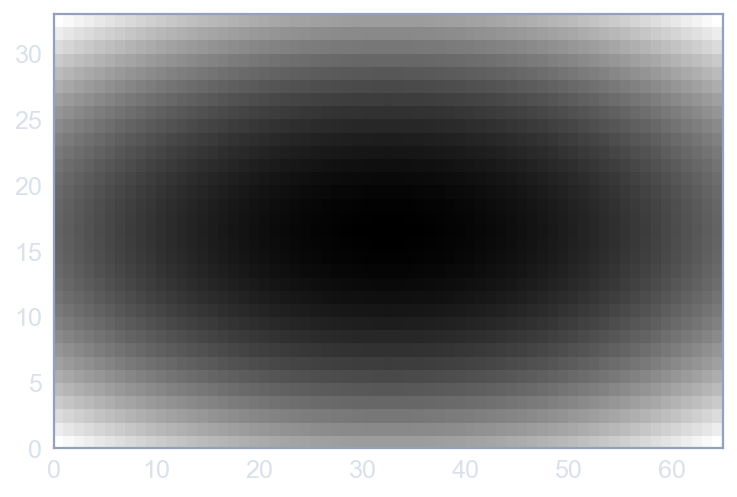

In [41]:
u = np.linspace(-2, 2, 65)
v = np.linspace(-1, 1, 33)

X,Y = np.meshgrid(u, v)
Z = X**2/25 + Y**2/4

plt.pcolor(Z)
plt.show()

### Color bar

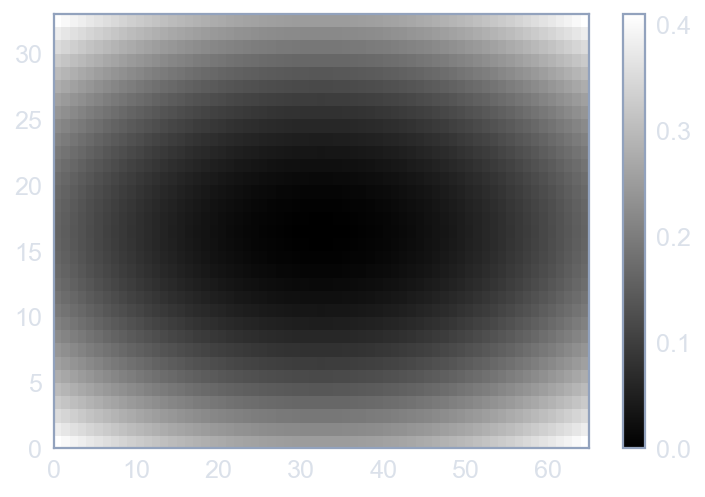

In [42]:
plt.pcolor(Z)
plt.colorbar()
plt.show()

### Color map

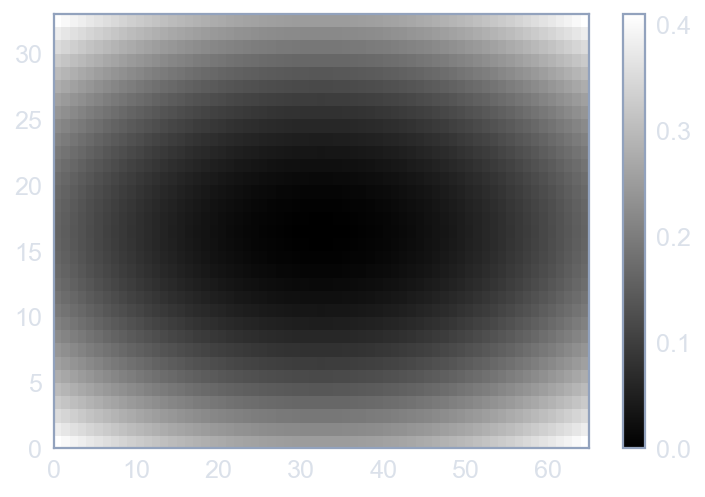

In [43]:
plt.pcolor(Z, cmap= 'gray')
plt.colorbar()
plt.show()

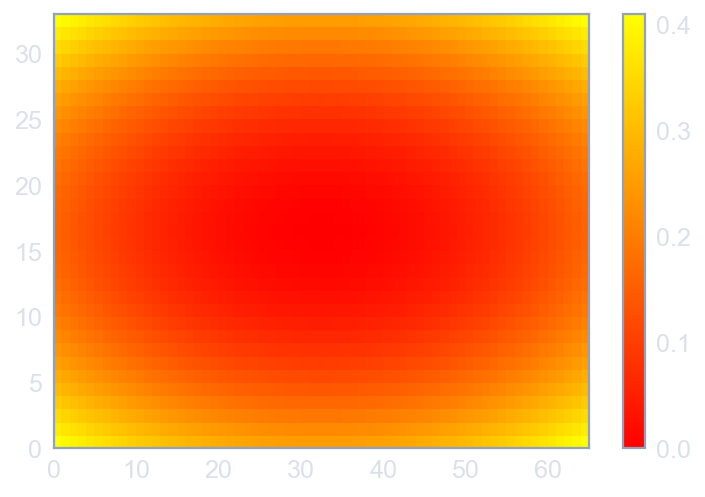

In [44]:
plt.pcolor(Z, cmap= 'autumn')
plt.colorbar()
plt.show()

### Axis tight

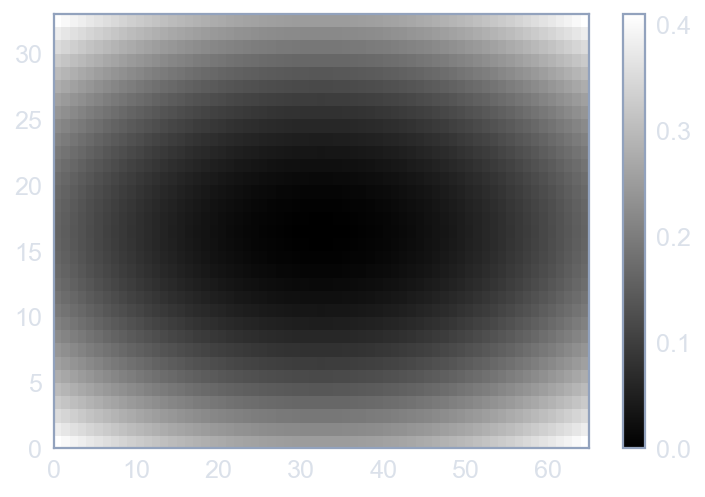

In [45]:
plt.pcolor(Z)
plt.colorbar()
plt.axis('tight')
plt.show()

### Plot using mesh grid

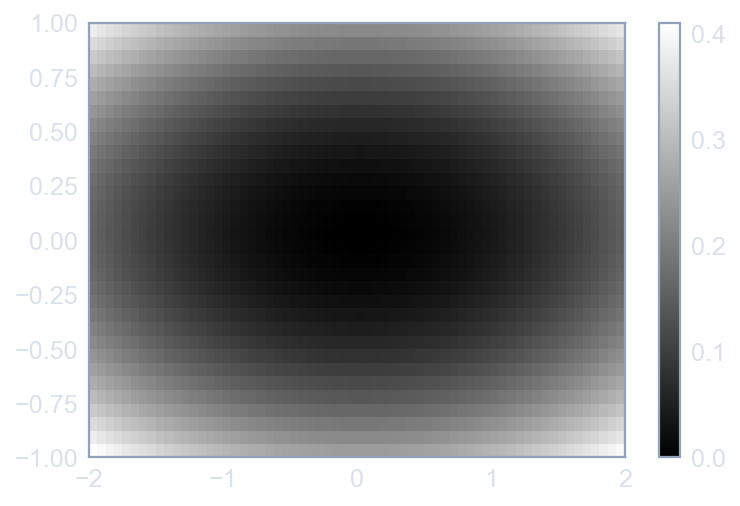

In [46]:
plt.pcolor(X, Y, Z) # X, Y are 2D meshgrid
plt.colorbar()
plt.show()

### Contour plots

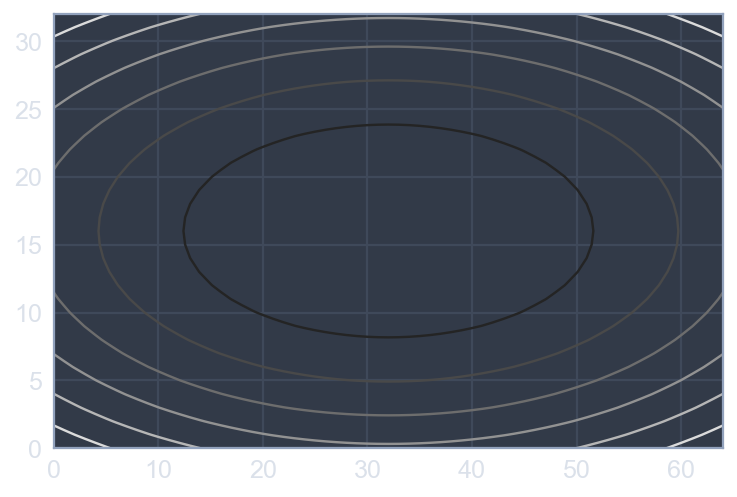

In [47]:
plt.contour(Z)
plt.show()

### More contours

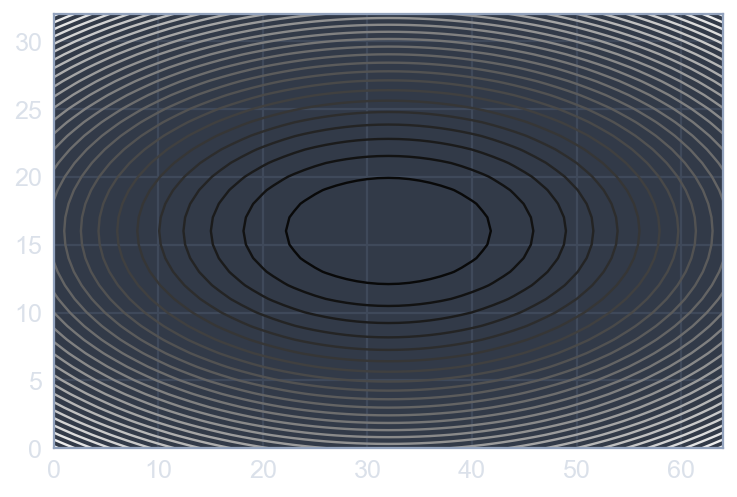

In [48]:
plt.contour(Z, 30)
plt.show()

### Contour plot using meshgrid

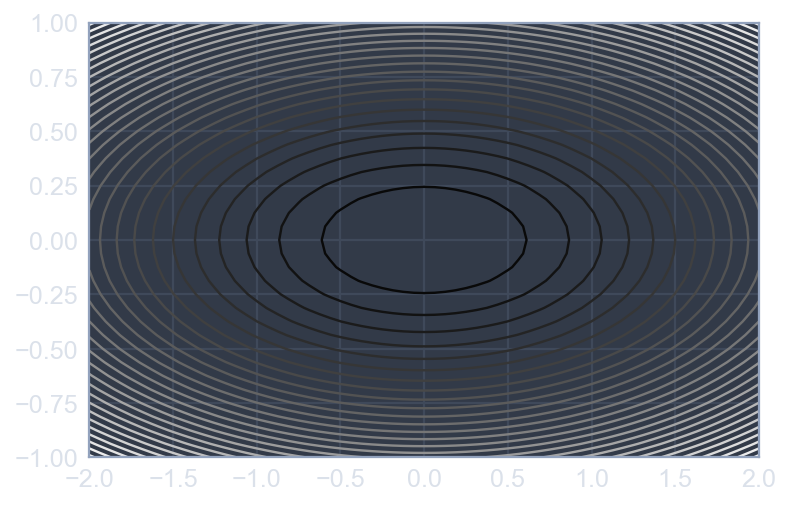

In [49]:
plt.contour(X, Y, Z, 30)
plt.show()

### Filled contour plots

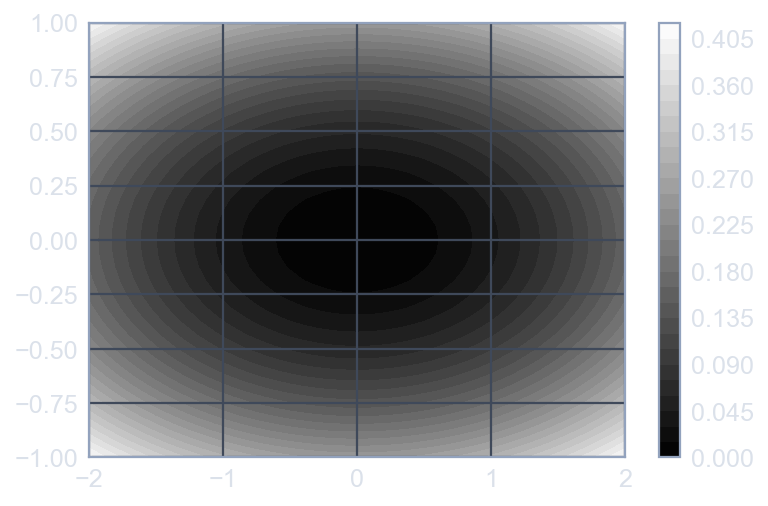

In [50]:
plt.contourf(X, Y, Z, 30)
plt.colorbar()
plt.show()

### More information

* API has many (optional) keyword arguments
* More in matplotlib.pyplot documentation
* More examples: [matplotlib](http://matplotlib.org/gallery.html)

### №12 Contour & filled contour plots

* Using the meshgrid `X`, `Y` as axes:
    * Generate a default contour plot of the array `Z` in the upper left subplot
    * Generate a contour plot of the array `Z` in the upper right subplot with `20` contours
    * Generate a default filled contour plot of the array `Z` in the lower left subplot
    * Generate a default filled contour plot of the array `Z` in the lower right subplot with `20` contours
* Improve the spacing between the subplots with `plt.tight_layout()` and display the figure

In [51]:
u = np.linspace(-2, 2, 101)
v = np.linspace(0, 2, 51)

X,Y = np.meshgrid(u, v)
Z = X**2/4 + Y**2/-3

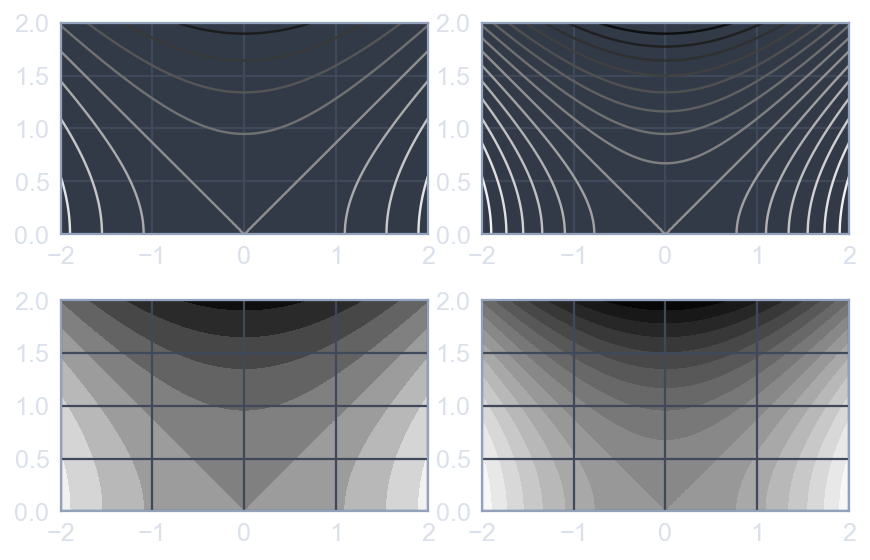

In [52]:
plt.subplot(2,2,1)
plt.contour(X, Y, Z)

plt.subplot(2,2,2)
plt.contour(X, Y, Z, 20)

plt.subplot(2,2,3)
plt.contourf(X, Y, Z)

plt.subplot(2,2,4)
plt.contourf(X, Y, Z, 20)

plt.tight_layout()
plt.show()

### №13 Modifying colormaps

* Modify the call to `plt.contourf()` so the filled contours in the top left subplot use the `'viridis'` colormap
* Modify the call to `plt.contourf()` so the filled contours in the top right subplot use the `'gray'` colormap
* Modify the call to `plt.contourf()` so the filled contours in the bottom left subplot use the `'autumn'` colormap
* Modify the call to `plt.contourf()` so the filled contours in the bottom right subplot use the `'winter'` colormap

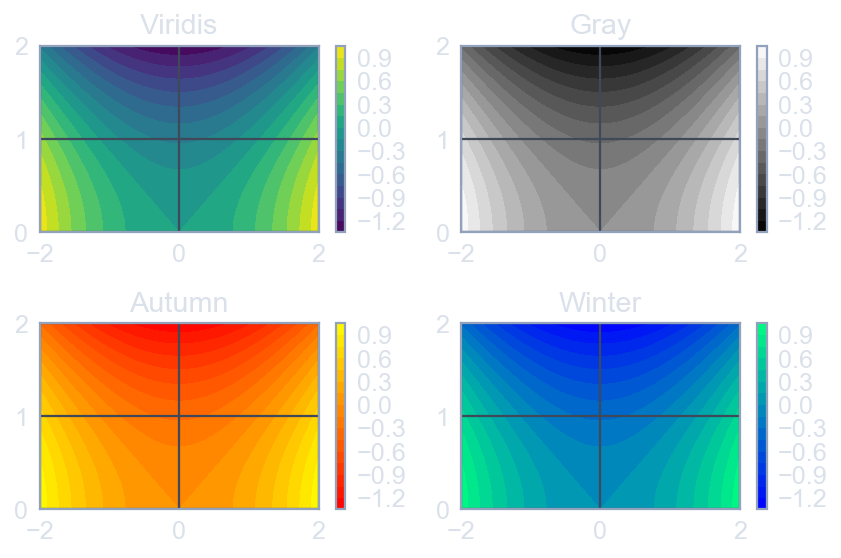

In [53]:
plt.subplot(2,2,1)
plt.contourf(X,Y,Z,20, cmap='viridis')
plt.colorbar()
plt.title('Viridis')

plt.subplot(2,2,2)
plt.contourf(X,Y,Z,20, cmap='gray')
plt.colorbar()
plt.title('Gray')

plt.subplot(2,2,3)
plt.contourf(X,Y,Z,20, cmap='autumn')
plt.colorbar()
plt.title('Autumn')

plt.subplot(2,2,4)
plt.contourf(X,Y,Z,20, cmap='winter')
plt.colorbar()
plt.title('Winter')

plt.tight_layout()
plt.show()

## 7. Visualizing bivariate distributions

In [54]:
auto = pd.read_csv('Introduction_to_Data_Visualization_with_Python/auto-mpg.csv')

x = auto['weight']
y = auto['accel']

### Distributions of 2D points

* 2D points given as two 1D arrays x & y
* Goal: generate a 2D histogram from x & y

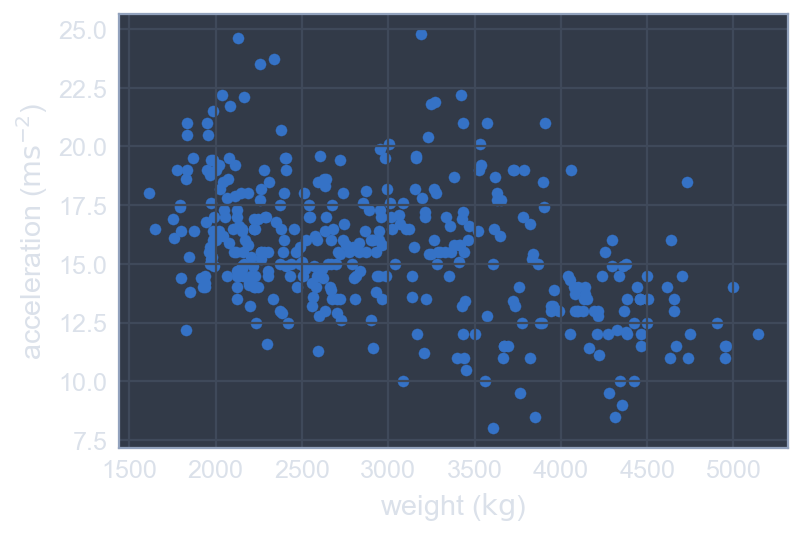

In [55]:
plt.scatter(x, y)

plt.xlabel('weight ($\mathrm{kg}$)')
plt.ylabel('acceleration ($\mathrm{ms}^{-2}$)')

plt.show()

### Histograms in 1D

* Choose bins (intervals)
* Count realizations within bins & plot


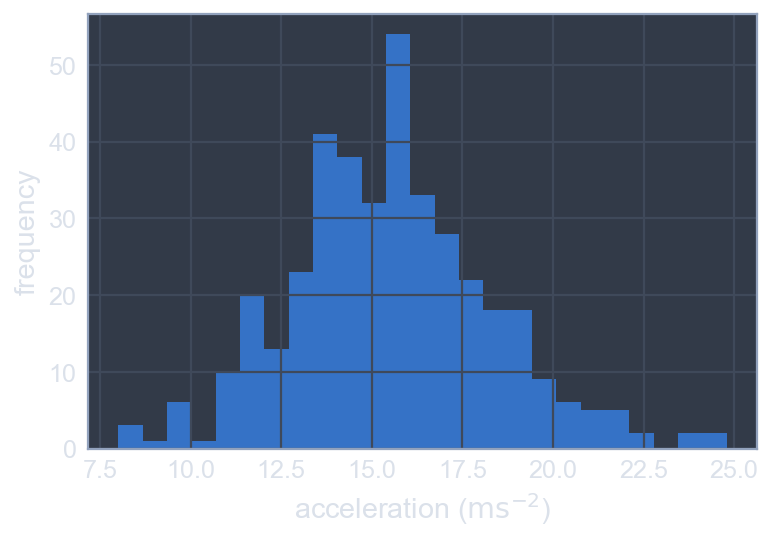

In [56]:
counts, bins, patches = plt.hist(y, bins=25)

plt.xlabel('acceleration ($\mathrm{ms}^{-2}$)')
plt.ylabel('frequency')

plt.show()

### Bins in 2D

* Different shapes available for binning points
* Common choices: rectangles & hexagons

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/Bins_in2D.png' alt='Bins in 2D' width=400 align='left'>

### hist2d(): Rectangular binning

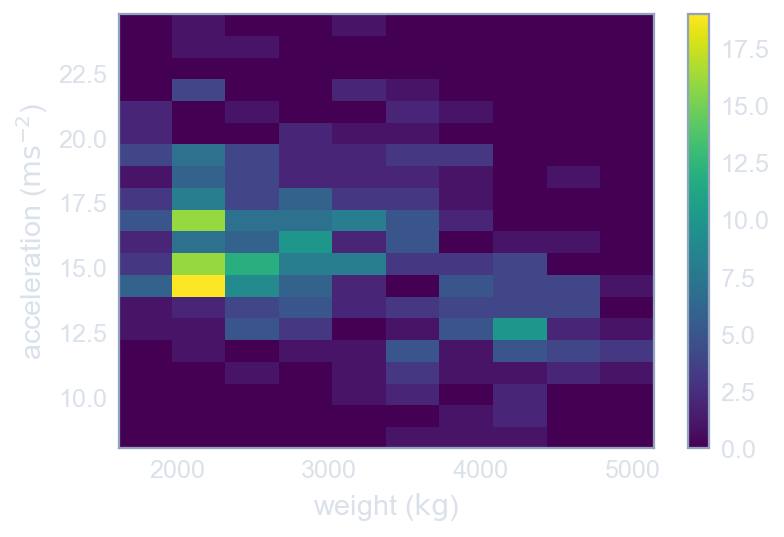

In [57]:
plt.hist2d(x, y, bins=(10, 20), cmap='viridis') # x & y are 1D arrays of same length 
plt.colorbar()
    
plt.xlabel('weight ($\mathrm{kg}$)')
plt.ylabel('acceleration ($\mathrm{ms}^{-2}$)')
    
plt.show()

### hexbin(): Hexagonal binning

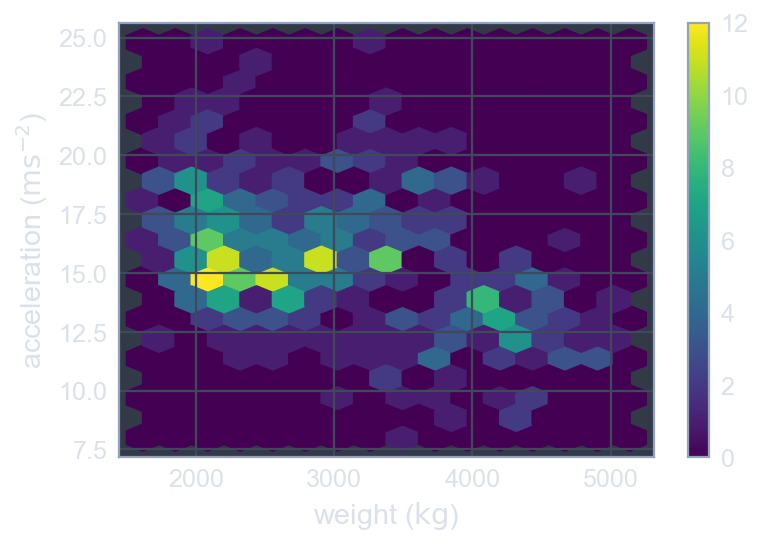

In [58]:
plt.hexbin(x, y, gridsize=(15,10), cmap='viridis')
plt.colorbar()

plt.xlabel('weight ($\mathrm{kg}$)')
plt.ylabel('acceleration ($\mathrm{ms}^{-2}$)')

plt.show()

### №14 Using `hist2d()`

1. Theory 
    * You specify the coordinates of the points using `plt.hist2d(x,y)` assuming x and y are two vectors of the same length
    * You can specify the number of bins with the argument `bins=(nx, ny)` where nx is the number of bins to use in the horizontal direction and ny is the number of bins to use in the vertical direction
    * You can specify the rectangular region in which the samples are counted in constructing the 2D histogram. The optional parameter required is `range=((xmin, xmax), (ymin, ymax))` where
    * *xmin* and *xmax* are the respective lower and upper limits for the variables on the x-axis and
    * *ymin* and *ymax* are the respective lower and upper limits for the variables on the y-axis. Notice that the optional `range` argument can use nested tuples or lists

2. Task
    * Generate a two-dimensional histogram to view the joint variation of the `mpg` and `hp` arrays
    * Put `hp` along the horizontal axis and `mpg` along the vertical axis
    * Specify 20 by 20 rectangular bins with the bins argument
    * Specify the region covered with the optional `range` argument so that the plot samples `hp` between 40 and 235 on the x-axis and `mpg` between 8 and 48 on the y-axis


In [59]:
mpg = auto['mpg']
hp = auto['hp']

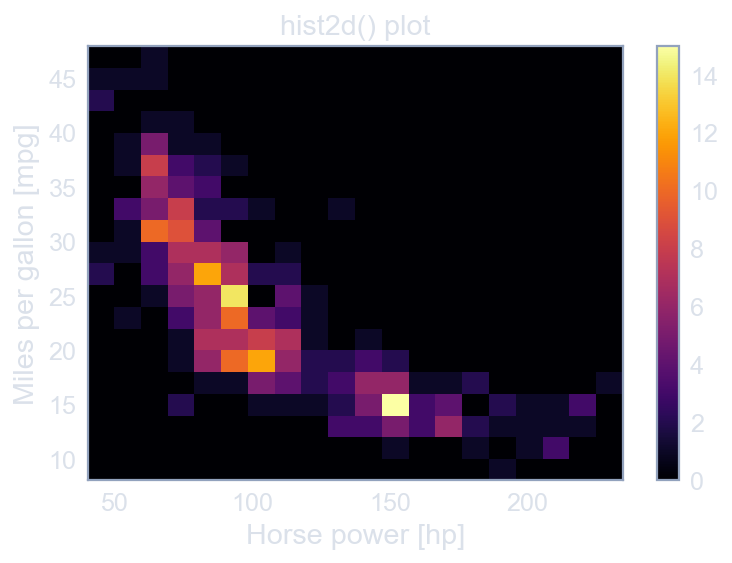

In [60]:
plt.hist2d(hp, mpg, bins=(20, 20), range=((40, 235), (8, 48)), cmap='inferno')
plt.colorbar()

plt.xlabel('Horse power [hp]')
plt.ylabel('Miles per gallon [mpg]')
plt.title('hist2d() plot')

plt.show()

### №15 Using `hexbin()`

1. Theory
    * The optional `gridsize` argument (default 100) gives the number of hexagons across the x-direction used in the hexagonal tiling. If specified as a list or a tuple of length two, gridsize fixes the number of hexagon in the x- and y-directions respectively in the tiling
    * The optional parameter `extent=(xmin, xmax, ymin, ymax)` specifies rectangular region covered by the hexagonal tiling. In that case, xmin and xmax are the respective lower and upper limits for the variables on the x-axis and ymin and ymax are the respective lower and upper limits for the variables on the y-axis
    
2. Task
    * Generate a two-dimensional histogram with `plt.hexbin()` to view the joint variation of the `mpg` and `hp` vectors
    * Put `hp` along the horizontal axis and `mpg` along the vertical axis
    * Specify a hexagonal tesselation with 15 hexagons across the x-direction and 12 hexagons across the y-direction using `gridsize`
    * Specify the rectangular region covered with the optional `extent` argument: use `hp` from 40 to 235 and `mpg` from 8 to 48
    * Add a color bar to the histogram

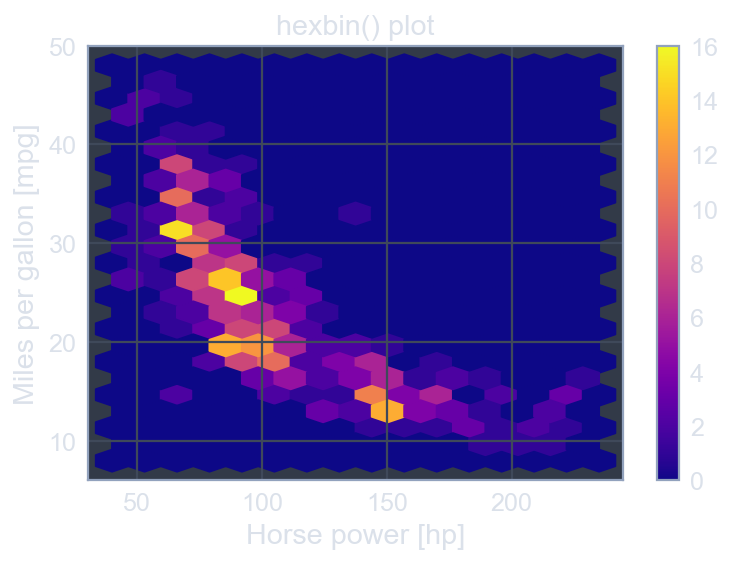

In [61]:
plt.hexbin(hp, mpg, gridsize=(15, 12), extent=(40, 235, 8, 48), cmap='plasma')
plt.colorbar()

plt.xlabel('Horse power [hp]')
plt.ylabel('Miles per gallon [mpg]')
plt.title('hexbin() plot')

plt.show()

## 8. Working with images

### Images

* Grayscale images: rectangular 2D arrays
* Color images: typically three 2D arrays (channels)
    * RGB (Red-Green-Blue)
* Channel values:
    * 0 to 1 (floating-point numbers)
    * 0 to 255 (8 bit integers)

### Loading images

In [62]:
img = plt.imread('Introduction_to_Data_Visualization_with_Python/Pictures/sunflower.jpg')
print(img.shape)

(554, 744, 4)


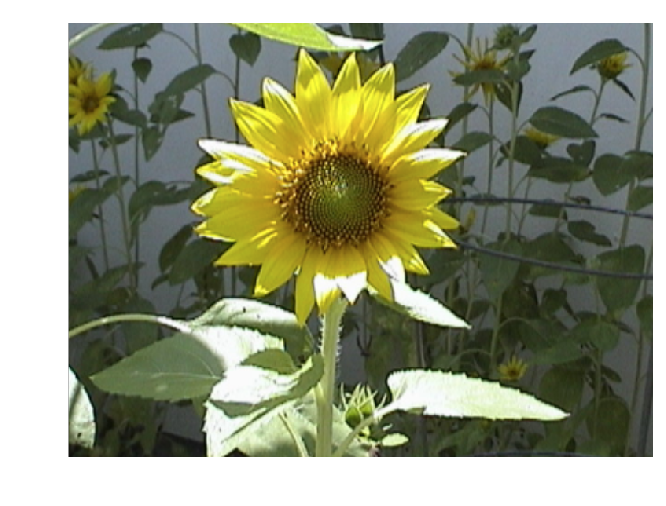

In [63]:
plt.imshow(img)
plt.axis('off')
plt.show()

### Reduction to gray-scale image

In [64]:
collapsed = img.mean(axis=2)
print(collapsed.shape)

(554, 744)


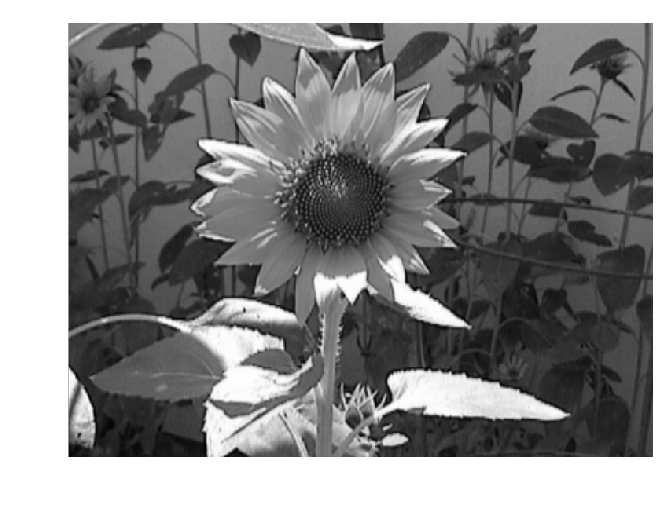

In [65]:
plt.set_cmap('gray')
plt.imshow(collapsed, cmap='gray')
plt.axis('off')
plt.show()

### Uneven samples

In [66]:
uneven = collapsed[::4,::2] # nonuniform subsampling
print(uneven.shape)

(139, 372)


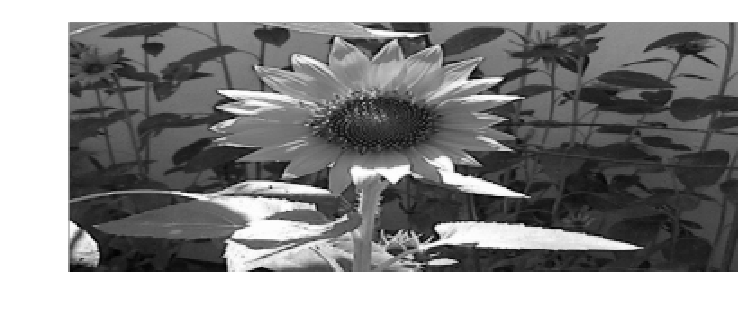

In [67]:
plt.imshow(uneven)
plt.axis('off')
plt.show()

### Adjusting aspect ratio

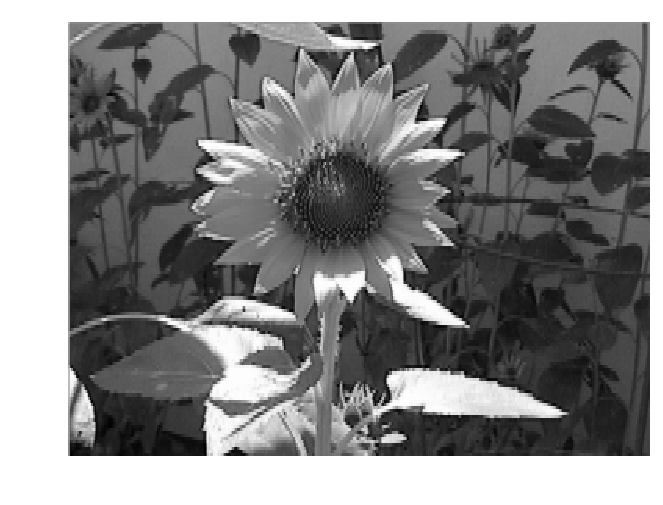

In [68]:
plt.imshow(uneven, aspect=2.0)
plt.axis('off')
plt.show()

### Adjusting extent

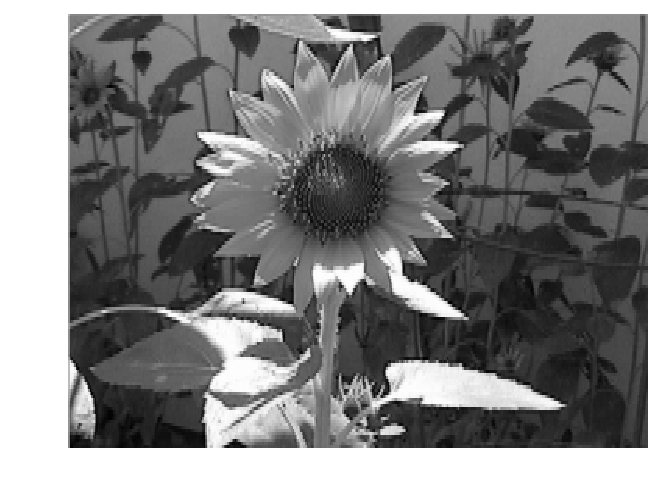

In [69]:
plt.imshow(uneven, cmap='gray', extent=(0,640,0,480))
plt.axis('off')
plt.show()

### №16 Loading, examining images

* Load the file `'480px-Astronaut-EVA.jpg'` into an array
* Print the shape of the `img` array. How wide and tall do you expect the image to be?
* Prepare `img` for display using `plt.imshow()`
* Turn off the axes using `plt.axis('off')`

(480, 480, 3)


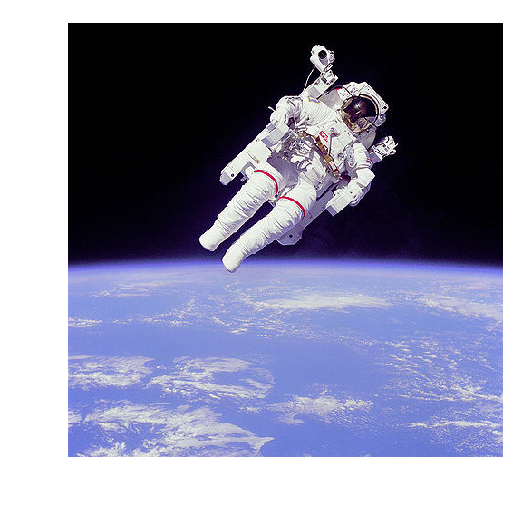

In [70]:
img = plt.imread('Introduction_to_Data_Visualization_with_Python/Pictures/480px-Astronaut-EVA.jpg')
print(img.shape)

plt.imshow(img)
plt.axis('off')
plt.show()

### №17 Pseudocolor plot from image data

* Print the shape of the existing image array
* Compute the sum of the red, green, and blue channels of `img` by using the `.sum()` method with `axis=2`
* Print the shape of the `intensity` array to verify this is the shape you expect
* Plot `intensity` with `plt.imshow()` using a 'gray' colormap
* Add a colorbar to the figure

(480, 480, 3)
(480, 480)


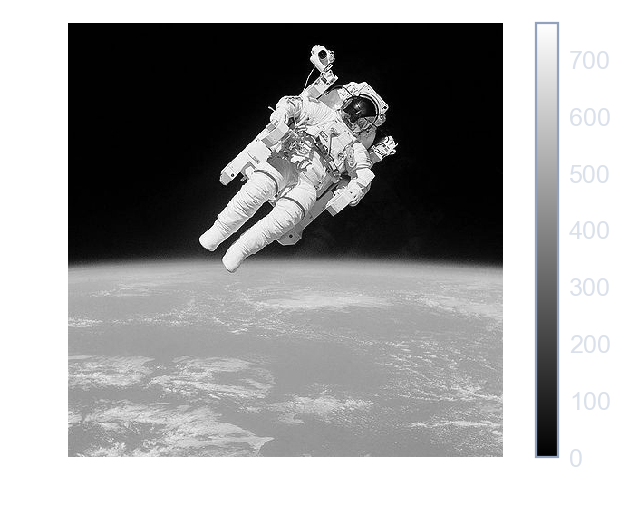

In [71]:
img = plt.imread('Introduction_to_Data_Visualization_with_Python/Pictures/480px-Astronaut-EVA.jpg')
print(img.shape)

intensity = img.sum(axis=2)
print(intensity.shape)

plt.imshow(intensity, cmap='gray')
plt.colorbar()

plt.axis('off')
plt.show()

### №18 Extent and aspect

* Display `img` in the top left subplot with horizontal extent from -1 to 1, vertical extent from -1 to 1, and aspect ratio 0.5
* Display `img` in the top right subplot with horizontal extent from -1 to 1, vertical extent from -1 to 1, and aspect ratio 1
* Display `img` in the bottom left subplot with horizontal extent from -1 to 1, vertical extent from -1 to 1, and aspect ratio 2
* Display `img` in the bottom right subplot with horizontal extent from -2 to 2, vertical extent from -1 to 1, and aspect ratio 2

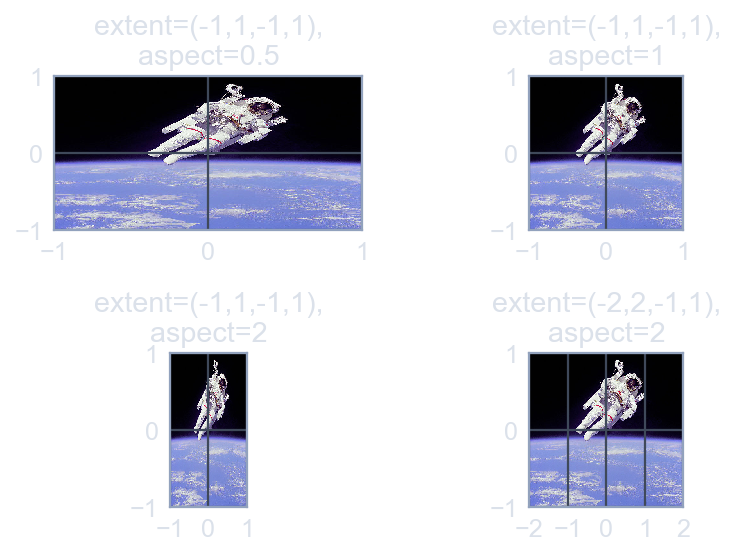

In [72]:
plt.subplot(2,2,1)
plt.title('extent=(-1,1,-1,1),\naspect=0.5') 
plt.xticks([-1,0,1])
plt.yticks([-1,0,1])
plt.imshow(img, extent=(-1,1,-1,1), aspect=0.5)

plt.subplot(2,2,2)
plt.title('extent=(-1,1,-1,1),\naspect=1')
plt.xticks([-1,0,1])
plt.yticks([-1,0,1])
plt.imshow(img, extent=(-1,1,-1,1), aspect=1)

plt.subplot(2,2,3)
plt.title('extent=(-1,1,-1,1),\naspect=2')
plt.xticks([-1,0,1])
plt.yticks([-1,0,1])
plt.imshow(img, extent=(-1,1,-1,1), aspect=2)

plt.subplot(2,2,4)
plt.title('extent=(-2,2,-1,1),\naspect=2')
plt.xticks([-2,-1,0,1,2])
plt.yticks([-1,0,1])
plt.imshow(img, extent=(-2,2,-1,1), aspect=2)

plt.tight_layout()
plt.show()

### №19 Rescaling pixel intensities

* Use the methods `.min()` and `.max()` to save the minimum and maximum values from the array `image` as `pmin` and `pmax` respectively
* Create a new 2-D array `rescaled_image` using `256*(image-pmin)/(pmax-pmin)`
* Plot the original array `image` in the top subplot of a 2×1 grid
* Plot the new array `rescaled_image` in the bottom subplot of a 2×1 grid

The smallest & largest pixel intensities are 104 & 230.
The rescaled smallest & largest pixel intensities are 0.0 & 256.0.


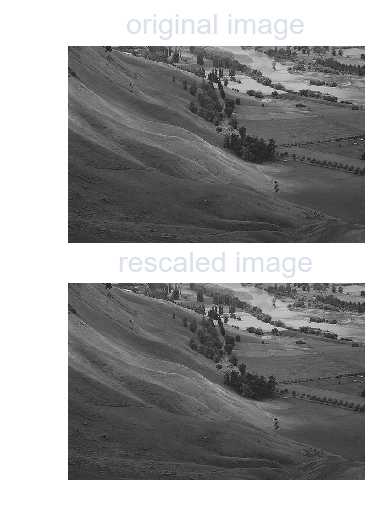

In [73]:
image = plt.imread('Introduction_to_Data_Visualization_with_Python/Pictures/640px-Unequalized_Hawkes_Bay_NZ.jpg')

pmin, pmax = image.min(), image.max()
print("The smallest & largest pixel intensities are %d & %d." % (pmin, pmax))

rescaled_image = 256*(image - pmin) / (pmax - pmin)
print("The rescaled smallest & largest pixel intensities are %.1f & %.1f." % (rescaled_image.min(), rescaled_image.max()))

plt.subplot(2,1,1)
plt.title('original image')
plt.axis('off')
plt.imshow(image)

plt.subplot(2,1,2)
plt.title('rescaled image')
plt.axis('off')
plt.imshow(rescaled_image)

plt.show()

## Chapter 3. Statistical plots with Seaborn

## 9. Visualizing Regressions

### Seaborn

* [Seaborn](https://stanford.edu/~mwaskom/software/seaborn/)

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/Seaborn.png' alt='Seborn' width=500 align='left'>

### Recap: Pandas DataFrames

* Labelled tabular data structure
* Labels on rows: *index*
* Labels on columns: *columns*
* Columns are Pandas Series

In [74]:
tips = pd.read_csv('Introduction_to_Data_Visualization_with_Python/tips.csv')
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


### Linear regression plots

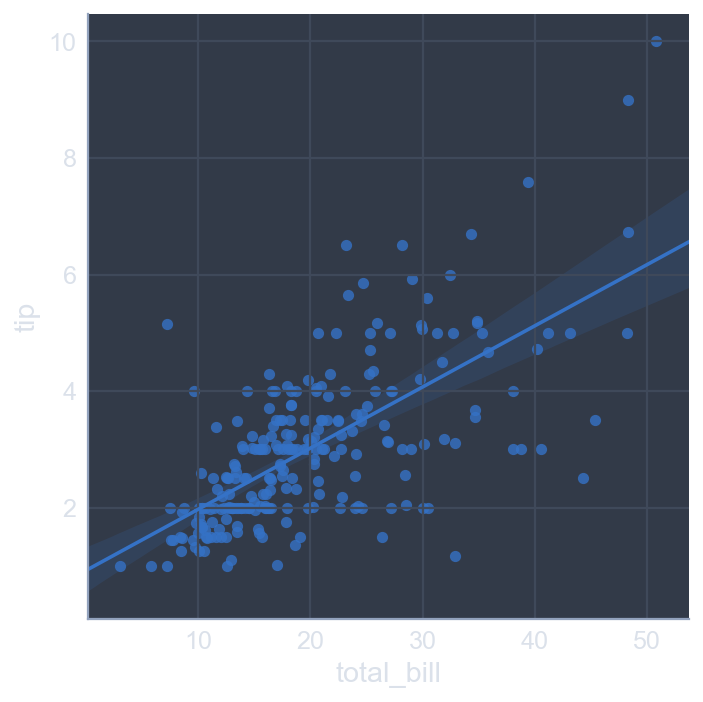

In [75]:
tips = sns.load_dataset('tips')
sns.lmplot(x= 'total_bill', y='tip', data=tips)
plt.show()

### Grouping factors (same plot) using `hue=`

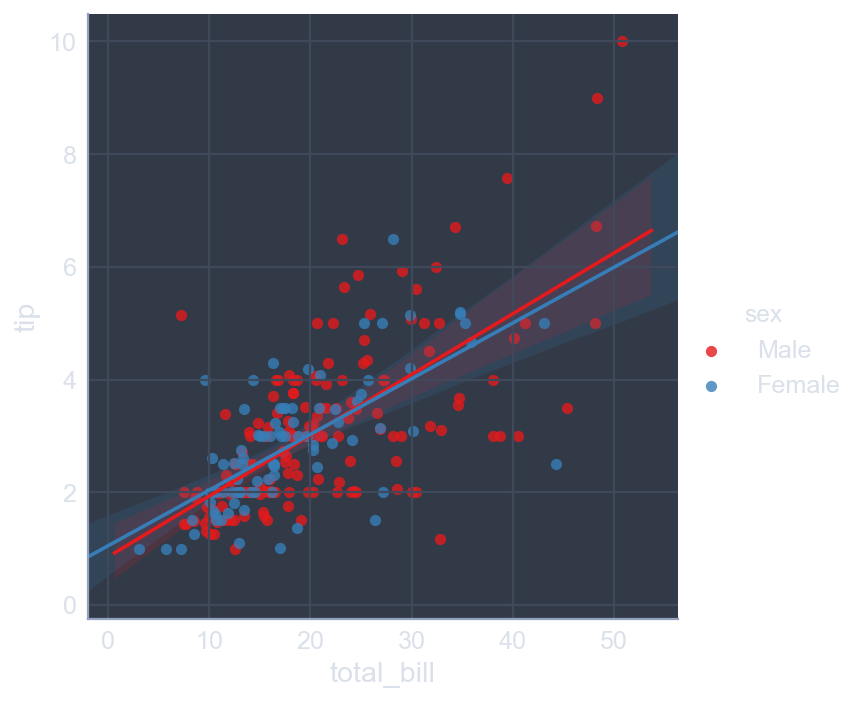

In [76]:
sns.lmplot(x='total_bill', y='tip', data=tips, hue='sex', palette='Set1')
plt.show()

### Grouping factors (subplots) using `col=`

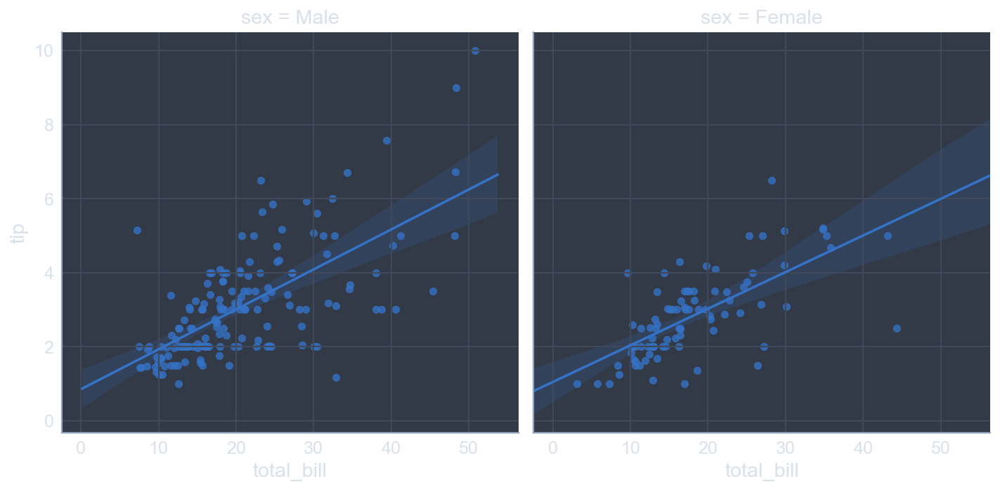

In [77]:
sns.lmplot(x='total_bill', y='tip', data=tips, col='sex')
plt.show()

### Residual plots using `residplot()`

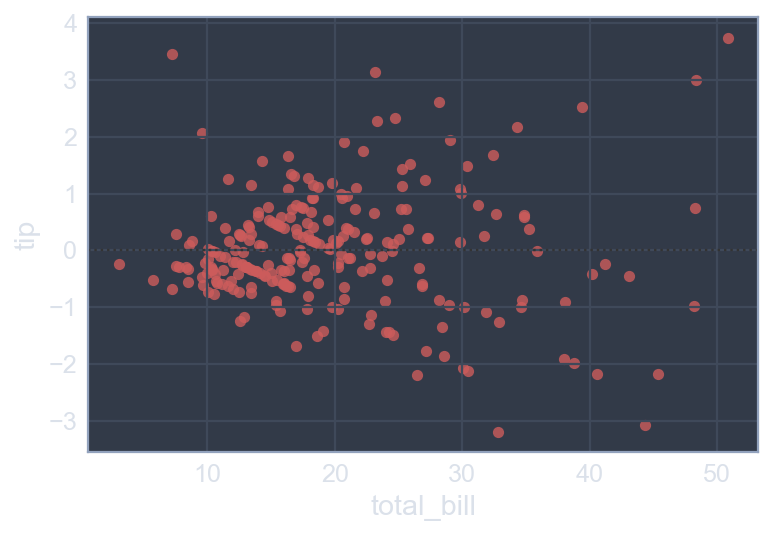

In [78]:
sns.residplot(x='total_bill', y='tip', data=tips, color='indianred')
plt.show()

* Similar arguments as lmplot() but more flexible
    * x, y can be *arrays* or *strings*
    * data is DataFrame (optional)
* Optional arguments (e.g., color) as in Matplotlib

### №20 Simple linear regressions

* Plot a linear regression between the `'weight'` column (on the x-axis) and the `'hp'` column (on the y-axis) from the DataFrame `auto`
* Display the plot as usual with `plt.show()`

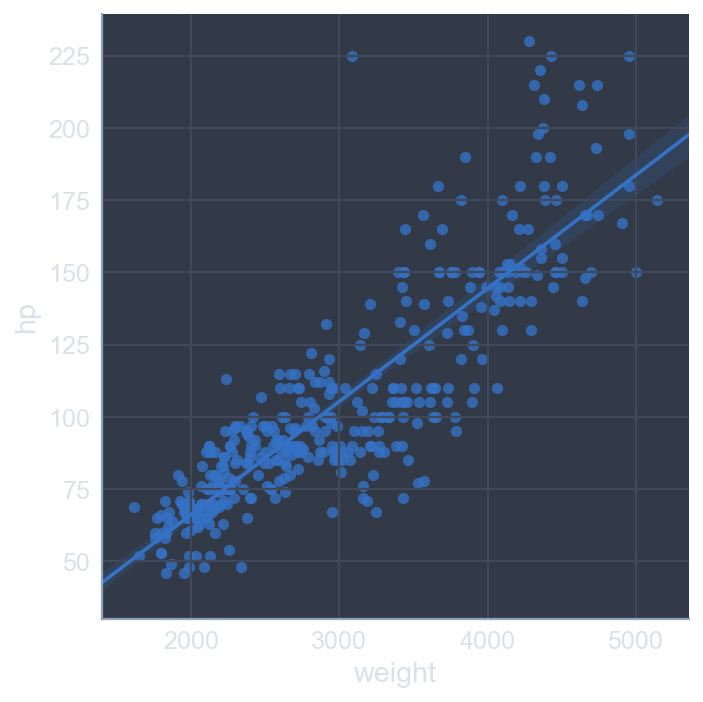

In [79]:
sns.lmplot(x='weight', y='hp', data=auto)
plt.show()

### №21 Plotting residuals of a regression

* Generate a green residual plot of the regression between `'hp'` (on the x-axis) and `'mpg'` (on the y-axis). You will need to specify the additional `data` and `color` parameters
* Display the plot as usual using `plt.show()`

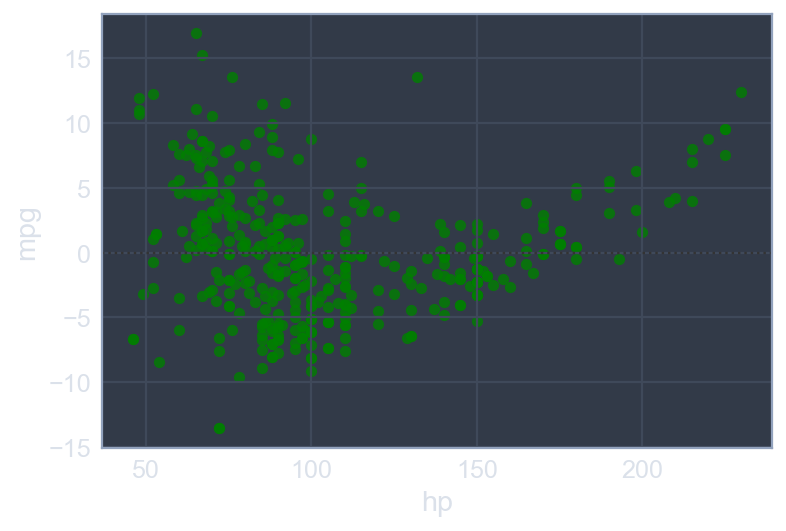

In [80]:
sns.residplot(x='hp', y='mpg', data=auto, color='green')
plt.show()

### №22 Higher-order regressions

1. Theory
    * A principal difference between `sns.lmplot()` and `sns.regplot()` is the way in which matplotlib options are passed (`sns.regplot()` is more permissive)
    * For both `sns.lmplot()` and `sns.regplot()`, the keyword order is used to control the `order` of polynomial regression
    * The function `sns.regplot()` uses the argument `scatter=None` to prevent plotting the scatter plot points again
2. Task
    * Modify the call to `plt.scatter()` to plot `auto['weight']` on the x-axis and `auto['mpg']` on the y-axis, filled with red circles and with `label='data'`
    * Plot a linear regression line of `'order 1'` between `'weight'` and `'mpg'` in `'blue'` without the scatter points
        * You need to specify the `label` and `color` parameters, in addition to `scatter=None`
    * Plot a linear regression line of `'order 2'` between `'weight'` and `'mpg'` in `'green'` without the scatter points
        * To force a higher order regression, you need to specify the `order` parameter Here, it should be `2`
    * Add a legend to the `'upper right'`

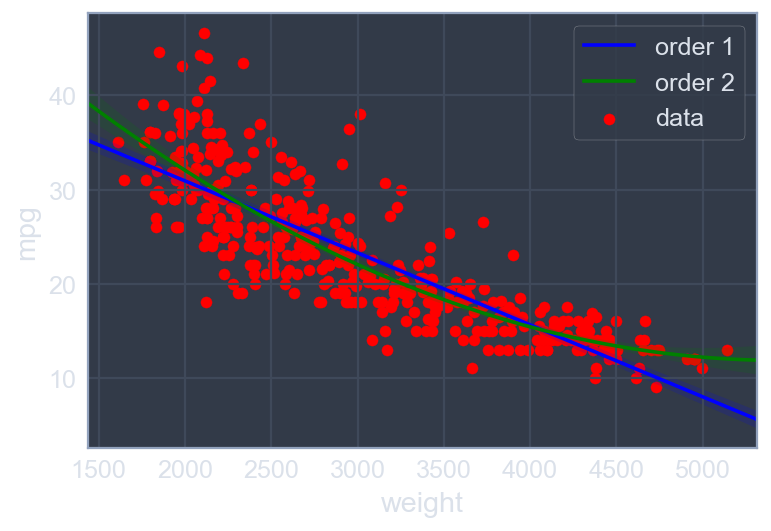

In [81]:
plt.scatter(auto['weight'], auto['mpg'], label='data', color='red', marker='o')

sns.regplot(x='weight', y='mpg', data=auto, scatter=None, color='blue', label='order 1')
sns.regplot(x='weight', y='mpg', data=auto, scatter=None, order=2, color='green', label='order 2')

plt.legend(loc='upper right')
plt.show()

### №23 Grouping linear regressions by hue

* Plot a linear regression between `'weight'` and `'hp'` grouped by `'origin'`
    * Use the keyword argument `hue` to group rows with the categorical column `'origin'`
    * Use the keyword argument `palette` to specify the `'Set1'` palette for coloring the distinct groups

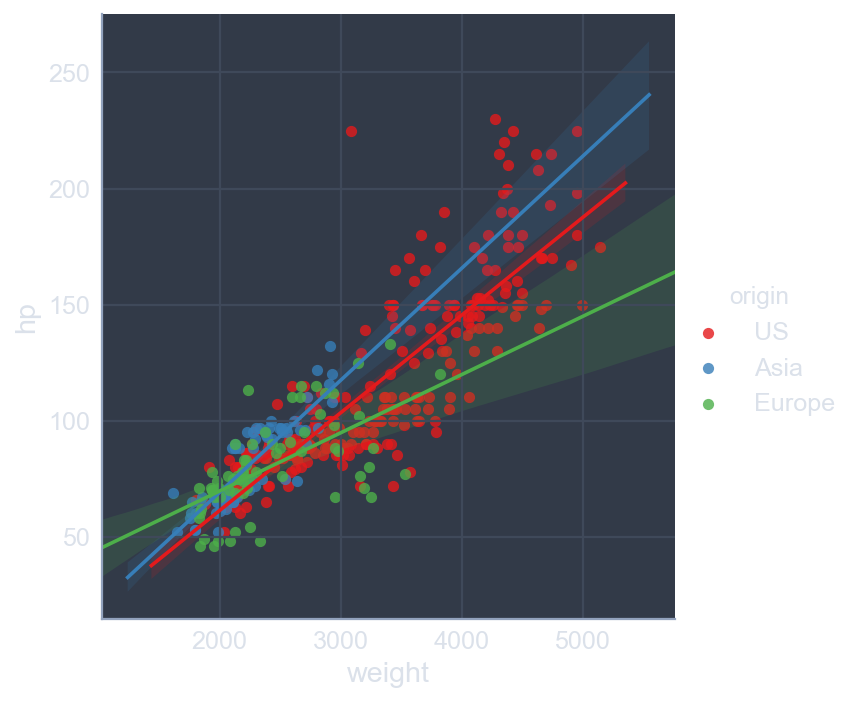

In [82]:
sns.lmplot(x='weight', y='hp', data=auto, hue='origin', palette='Set1')
plt.show()

### №24 Grouping linear regressions by row or column

* Plot linear regressions of `'hp'` (on the y-axis) versus `'weight'` (on the x-axis) grouped row-wise by `'origin'` from DataFrame `auto`
* Use the keyword argument `row` to group observations with the categorical column `'origin'` in subplots organized in rows

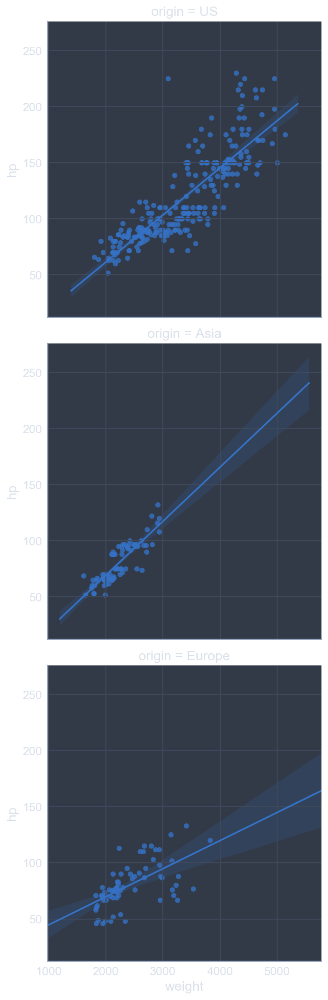

In [83]:
sns.lmplot(x='weight', y='hp', data=auto, row='origin')
plt.show()

## 10. Visualizing univariate distributions

### Visualizing data

* Univariate → “one variable”
* Visualization techniques for sampled univariate data
    * Strip plots
    * Swarm plots
    * Violin plots

### Strip plot using `stripplot()`

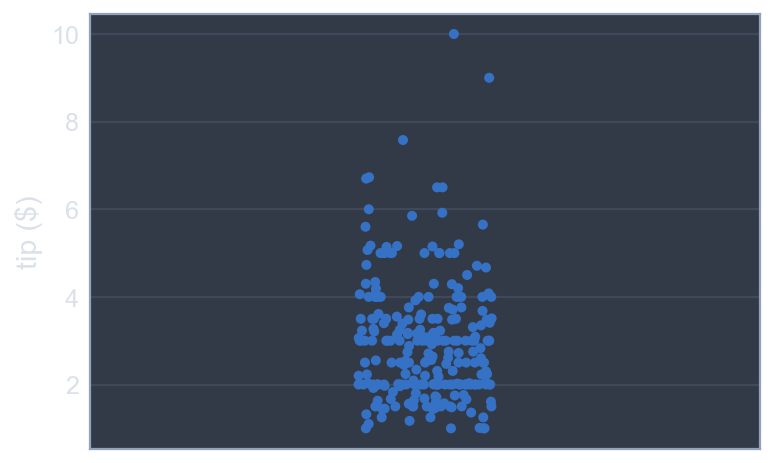

In [84]:
sns.stripplot(y='tip', data=tips)

plt.ylabel('tip ($)')
plt.show()

### Grouping with `stripplot()`

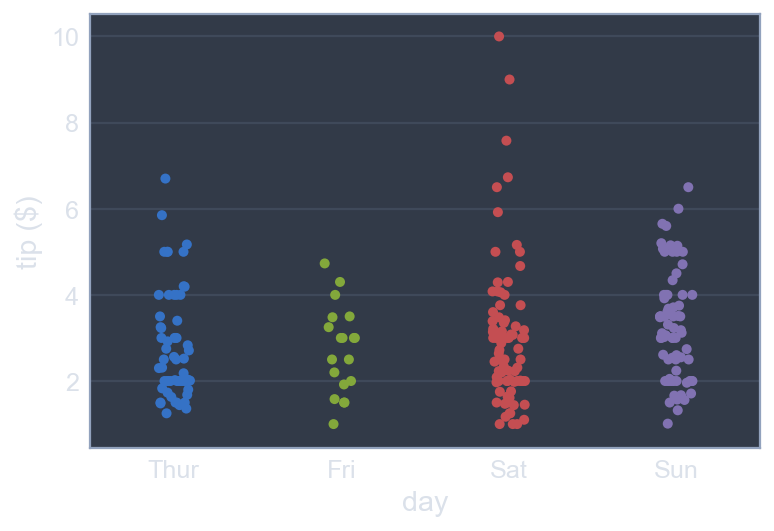

In [85]:
sns.stripplot(x='day', y='tip', data=tips)

plt.ylabel('tip ($)')
plt.show()

### Spreading out strip plots

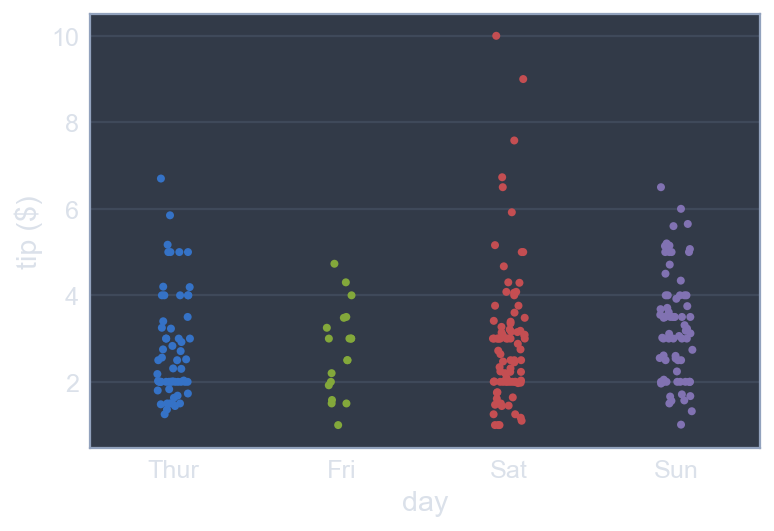

In [86]:
sns.stripplot(x='day', y='tip', data=tips, size=4, jitter=True)

plt.ylabel('tip ($)')
plt.show()

### Swarm plot `swarmplot()`

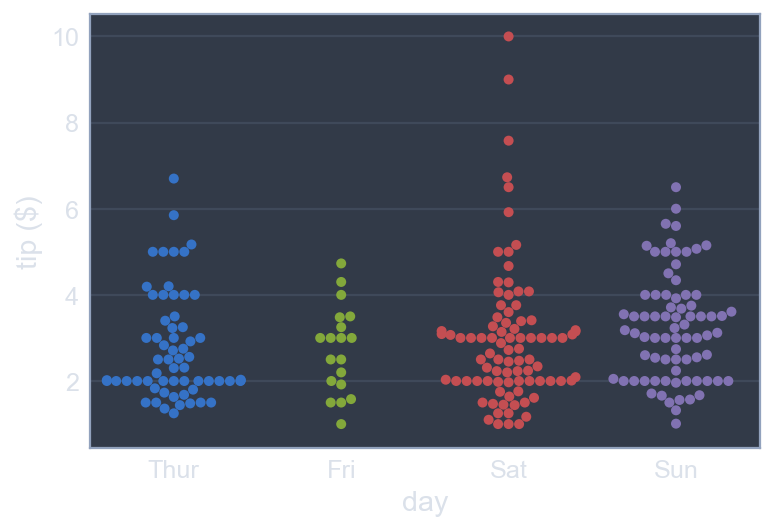

In [87]:
sns.swarmplot(x='day', y='tip', data=tips)

plt.ylabel('tip ($)')
plt.show()

### More grouping with `swarmplot()`

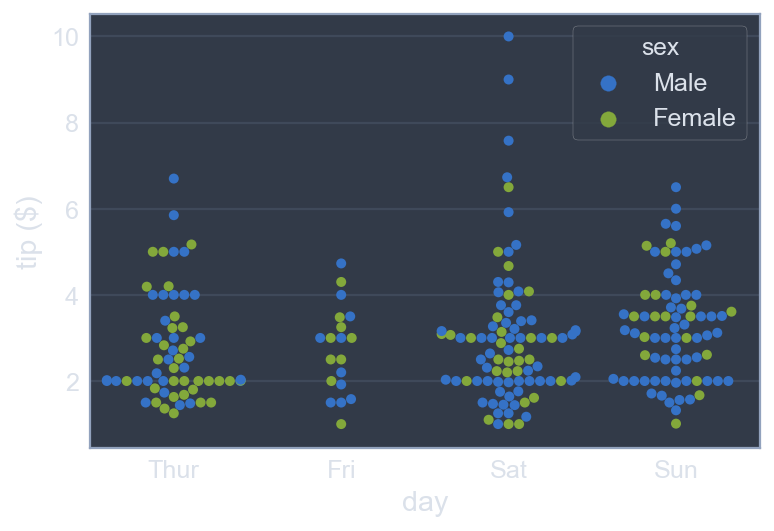

In [88]:
sns.swarmplot(x='day', y='tip', data=tips, hue='sex')

plt.ylabel('tip ($)')
plt.show()

### Changing orientation

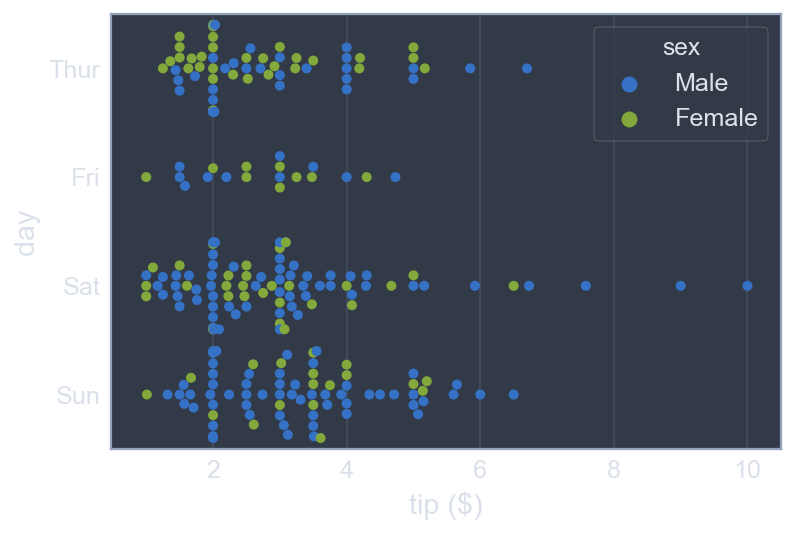

In [89]:
sns.swarmplot(x='tip', y='day', data=tips, hue='sex', orient='h')

plt.xlabel('tip ($)')
plt.show()

### Using `violinplot()`

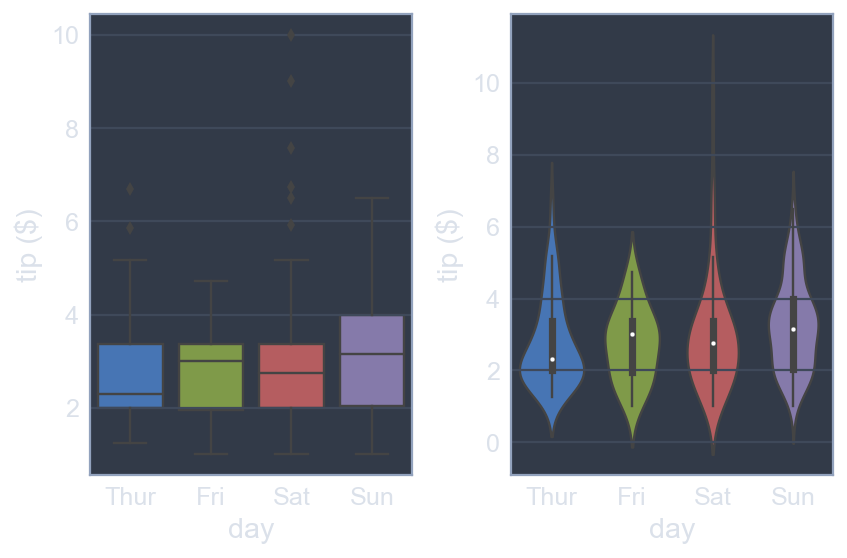

In [90]:
plt.subplot(1,2,1)
sns.boxplot(x='day', y='tip', data=tips)
plt.ylabel('tip ($)')

plt.subplot(1,2,2)
sns.violinplot(x='day', y='tip', data=tips)
plt.ylabel('tip ($)')

plt.tight_layout()
plt.show()

### Combining plots

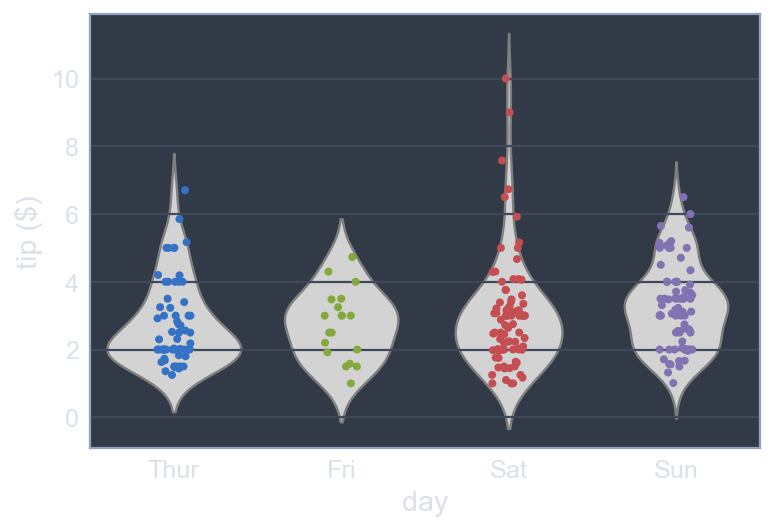

In [91]:
sns.violinplot(x='day', y='tip', data=tips, inner=None, color='lightgray')
sns.stripplot(x='day', y='tip', data=tips, size=4, jitter=True)

plt.ylabel('tip ($)')
plt.show()

### №25 Constructing strip plots

* In the first row of subplots, make a strip plot showing distribution of `'hp'` values grouped horizontally by `'cyl'`
* In the second row of subplots, make a second strip plot with improved readability. In particular, you'll call `sns.stripplot()` again, this time adding `jitter=True` and decreasing the point size to 3 using the `size` parameter

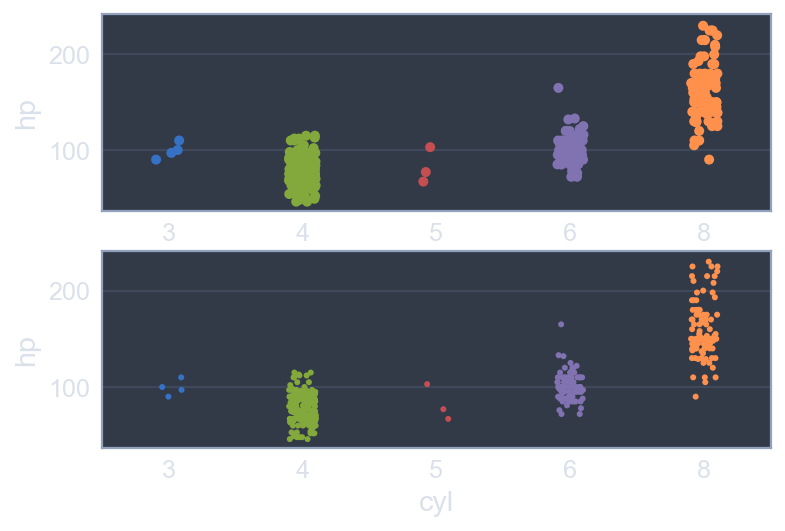

In [92]:
plt.subplot(2,1,1)
sns.stripplot(x='cyl', y='hp', data=auto)

plt.subplot(2,1,2)
sns.stripplot(x='cyl', y='hp', data=auto, jitter=True, size=3)

plt.show()

### №26 Constructing swarm plots

1. Theory
    * The syntax for `sns.swarmplot()` is similar to that of `sns.stripplot()`, e.g., `sns.swarmplot(x='type', y='length', data=df)`
    * The orientation for the continuous variable in the strip/swarm plot can be inferred from the choice of the columns `x` and `y` from the DataFrame `data`. The orientation can be set explicitly using `orient='h'` (horizontal) or `orient='v'` (vertical)
    * Another grouping can be added in using the hue keyword. For instance, using `sns.swarmplot(x='type', y='length', data=df, hue='build year')` makes a swarm plot from the DataFrame df with the `'length'` column values spread out vertically, horizontally grouped by the column `'type'` and each point colored by the categorical column `'build year'`
    
2. Task

    * In the first row of subplots, make a swarm plot showing distribution of `'hp'` values grouped horizontally by `'cyl'`
    * In the second row of subplots, make a second swarm plot with horizontal orientation (i.e., grouped vertically by `'cyl'` with `'hp'` value spread out horizontally) with points colored by `'origin'`. You need to specify the `orient` parameter to explicitly set the horizontal orientation

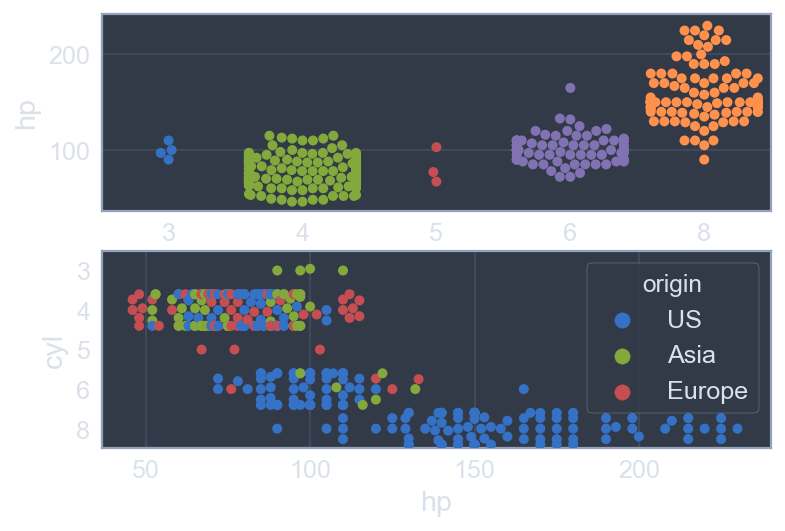

In [93]:
plt.subplot(2,1,1)
sns.swarmplot(x='cyl', y='hp', data=auto)

plt.subplot(2,1,2)
sns.swarmplot(x='hp', y='cyl', data=auto, hue='origin', orient='h')

plt.show()

### №27 Constructing violin plots

* In the first row of subplots, make a violin plot showing the distribution of `'hp'` grouped by `'cyl'`
* In the second row of subplots, make a second violin plot without the inner annotations (by specifying `inner=None`) and with the color `'lightgray'`
* In the second row of subplots, overlay a strip plot with jitter and a point size of `1.5`

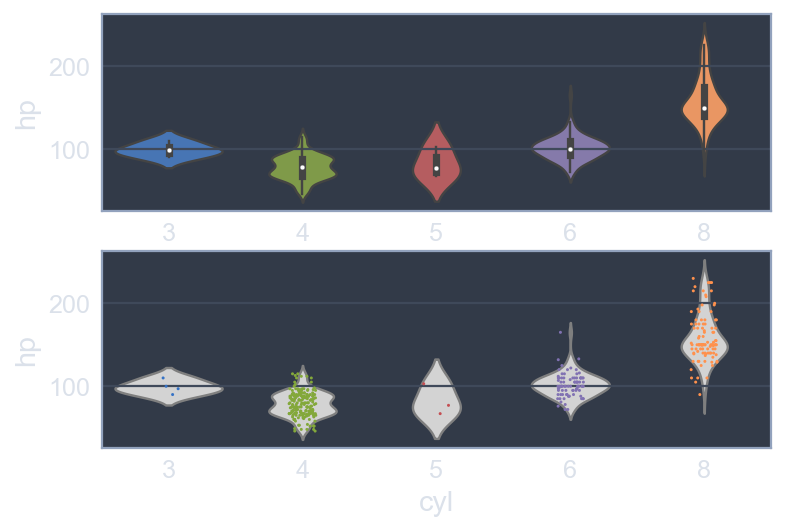

In [94]:
plt.subplot(2,1,1)
sns.violinplot(x='cyl', y='hp', data=auto)

plt.subplot(2,1,2)
sns.violinplot(x='cyl', y='hp', data=auto, color='lightgray', inner=None)

sns.stripplot(x='cyl', y='hp', data=auto, jitter=True, size=1.5)
plt.show()

## 11. Visualizing Multivariate Distributions

### Visualizing data

* Bivariate → “two variables”
* Multivariate → “multiple variables”
* Visualizing relationships in multivariate data
    * Joint plots
    * Pair plots
    * Heat maps

### Using `jointplot()`

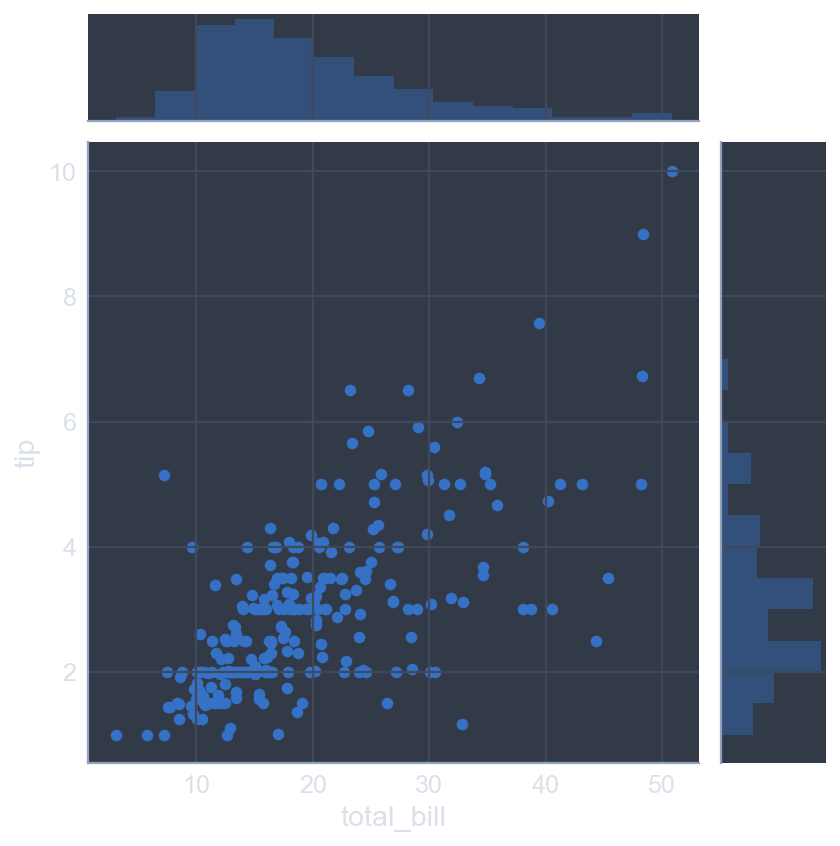

In [95]:
sns.jointplot(x='total_bill', y= 'tip', data=tips)
plt.show()

### Joint plot using `kde=True`

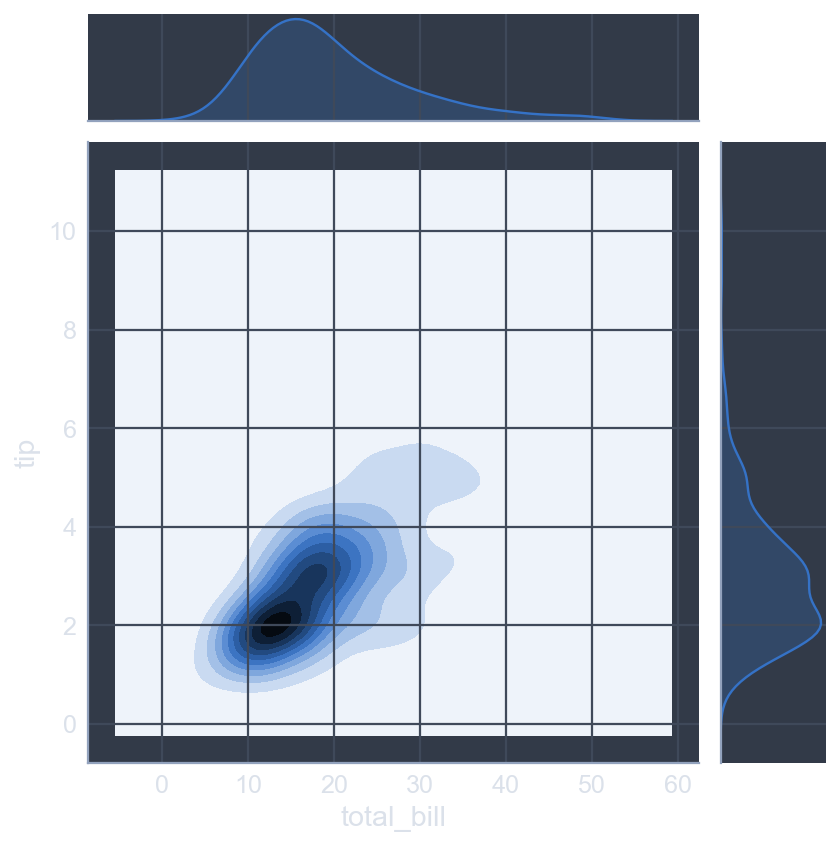

In [96]:
sns.jointplot(x='total_bill', y= 'tip', data=tips, kind='kde')
plt.show()

### Using `pairplot()`

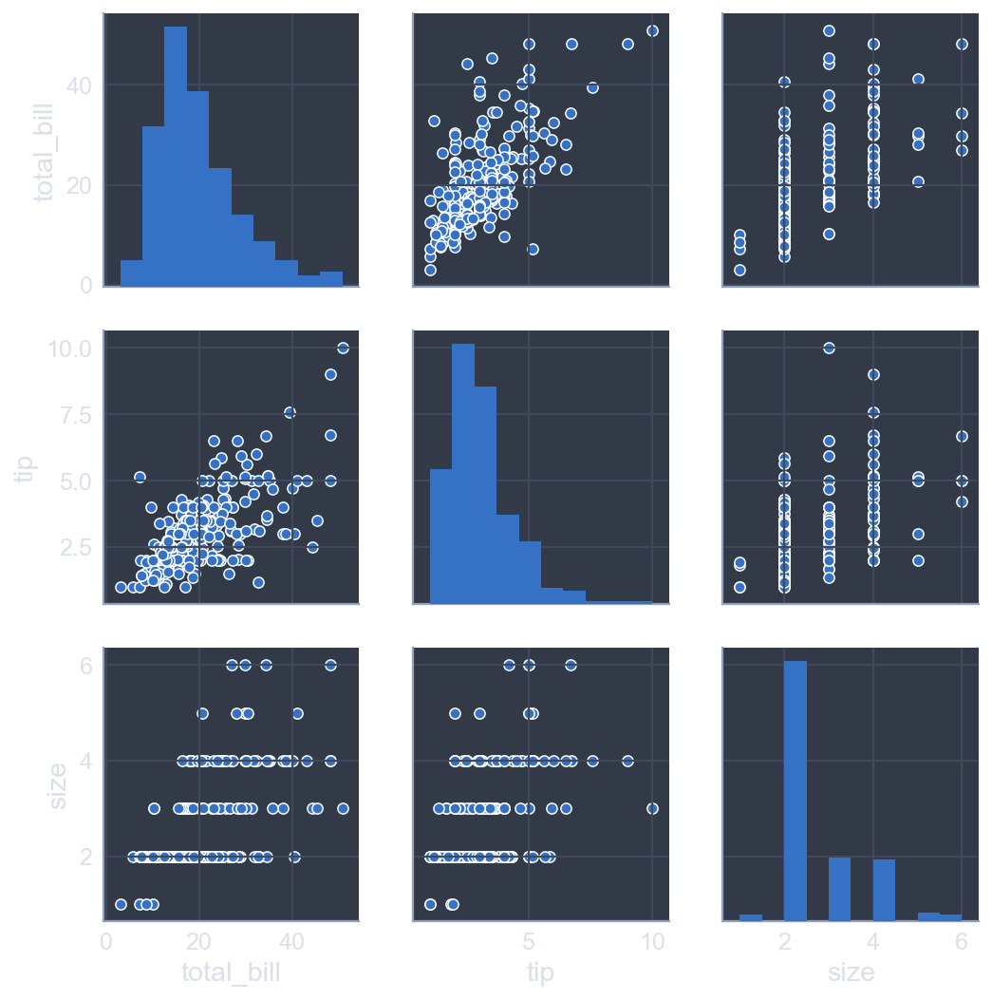

In [97]:
sns.pairplot(tips)
plt.show()

### Using `pairplot()` with `hue`

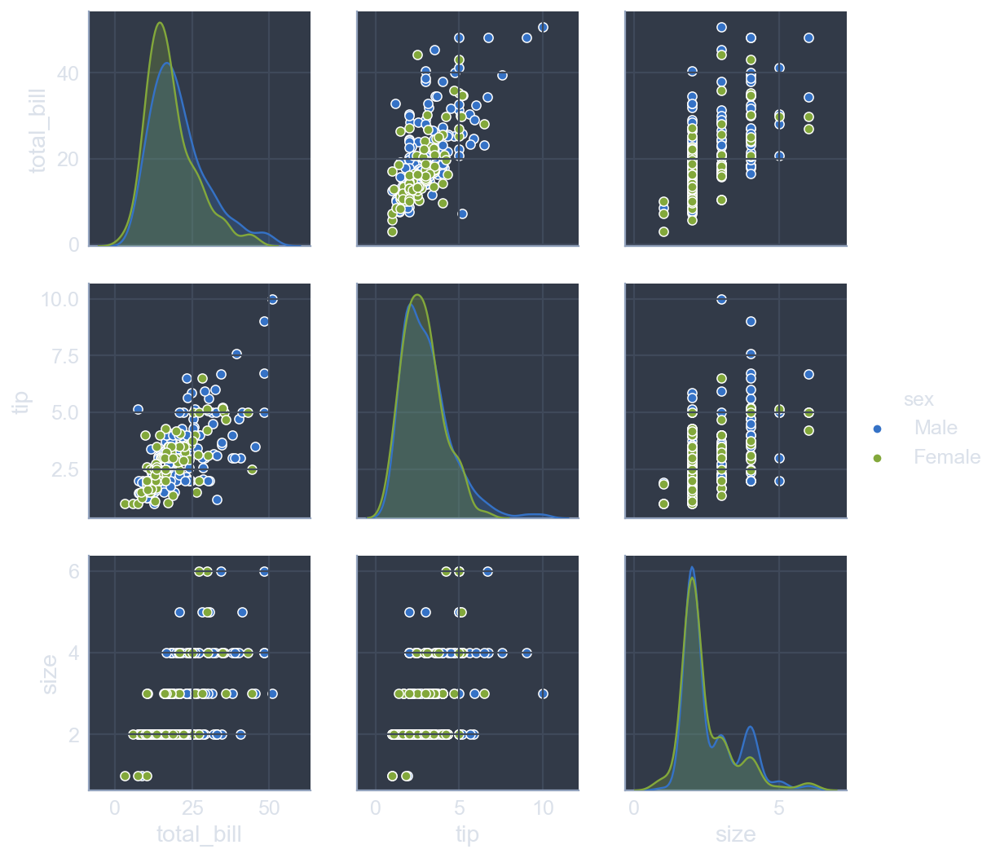

In [98]:
sns.pairplot(tips, hue='sex')
plt.show()

### Covariance heat map of tips data

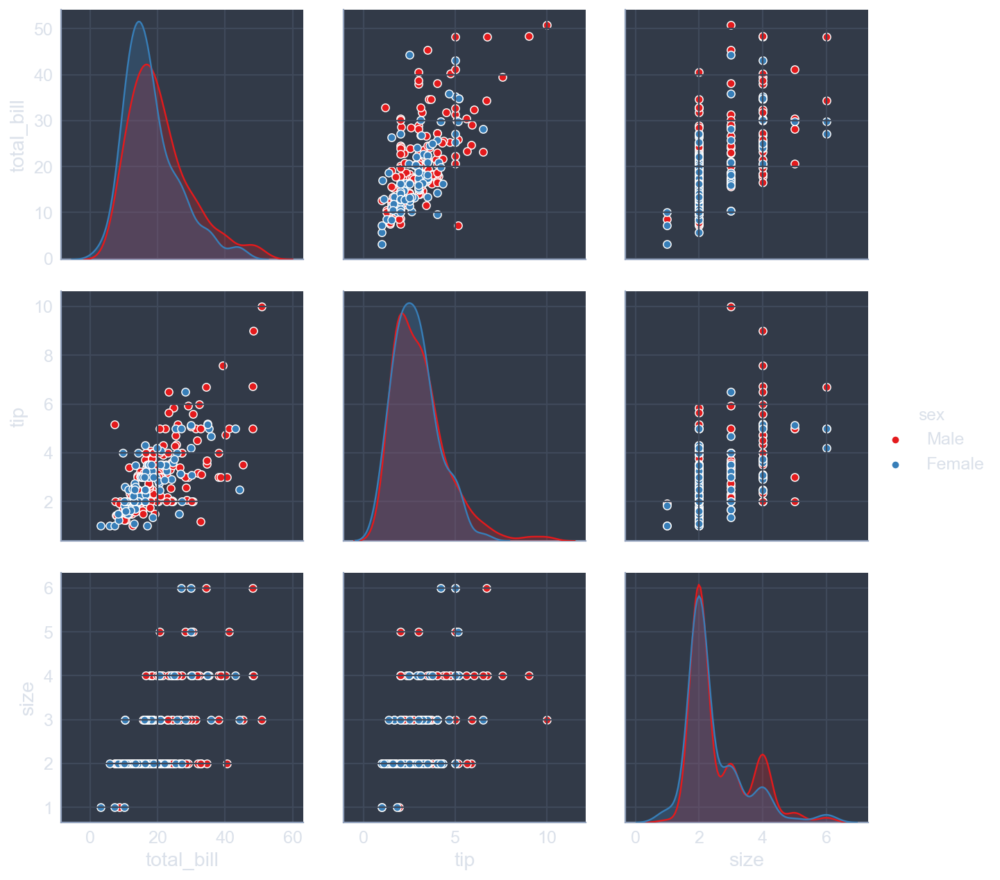

In [99]:
corr_list = ['total_bill', 'tip', 'size', 'sex']
sns.pairplot(tips[corr_list], hue='sex', palette='Set1', size=3)

### Using `heatmap()`

In [100]:
covariance = tips[corr_list].corr()
print(covariance)

            total_bill       tip      size
total_bill    1.000000  0.675734  0.598315
tip           0.675734  1.000000  0.489299
size          0.598315  0.489299  1.000000


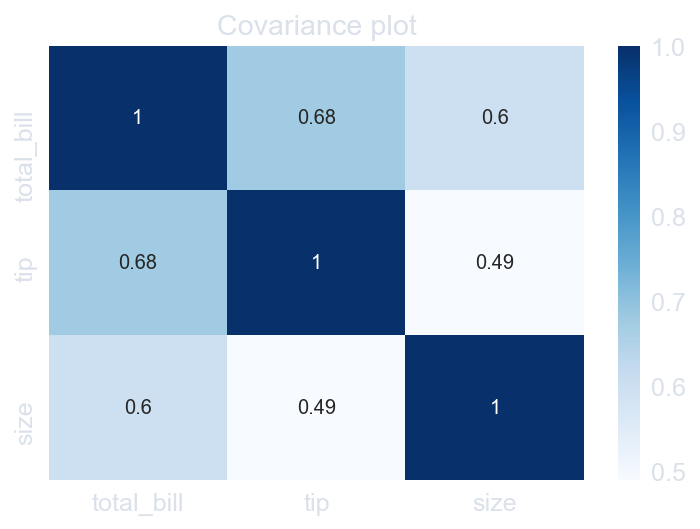

In [101]:
sns.heatmap(covariance, cmap='Blues', cbar=True, annot=True)
plt.title('Covariance plot')
plt.show()

### №28 Plotting joint distributions (1)

* Use `sns.jointplot()` to visualize the joint variation of the columns `'hp'` (on the x-axis) and `'mpg'` (on the y-axis) from the DataFrame `auto`

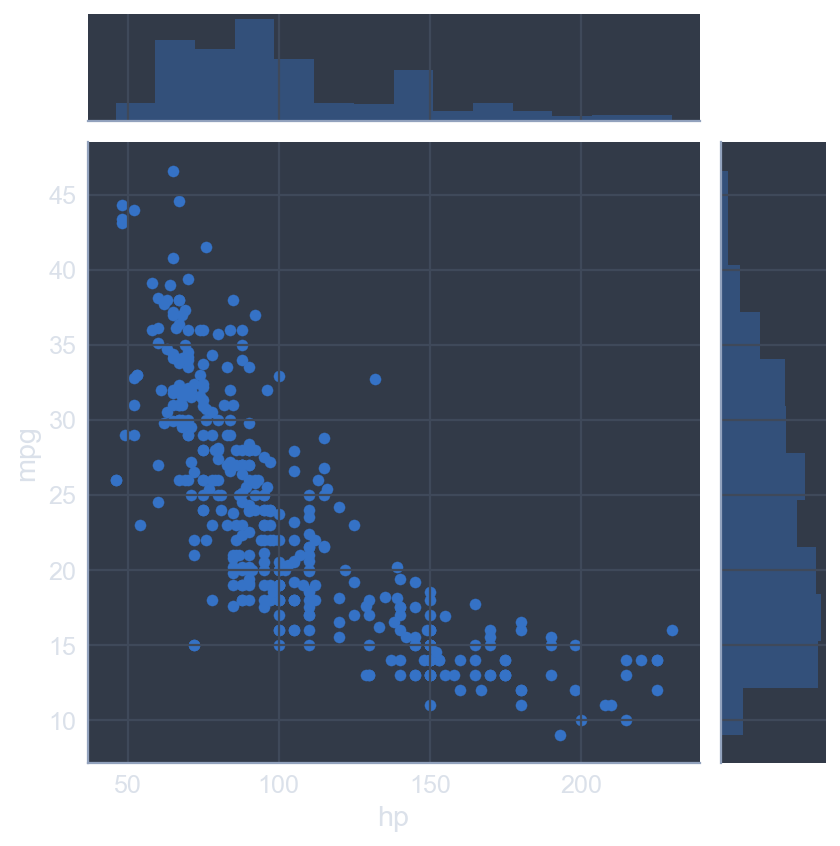

In [102]:
sns.jointplot(x='hp', y='mpg', data=auto)
plt.show()

### №29 Plotting joint distributions (2)

1. Theory
    * `kind='scatter'` uses a scatter plot of the data points
    * `kind='reg'` uses a regression plot (default order 1)
    * `kind='resid'` uses a residual plot
    * `kind='kde'` uses a kernel density estimate of the joint distribution
    * `kind='hex'` uses a hexbin plot of the joint distribution
2. Task
    * Create a hexbin plot of the joint distribution between `'hp'` and `'mpg'`

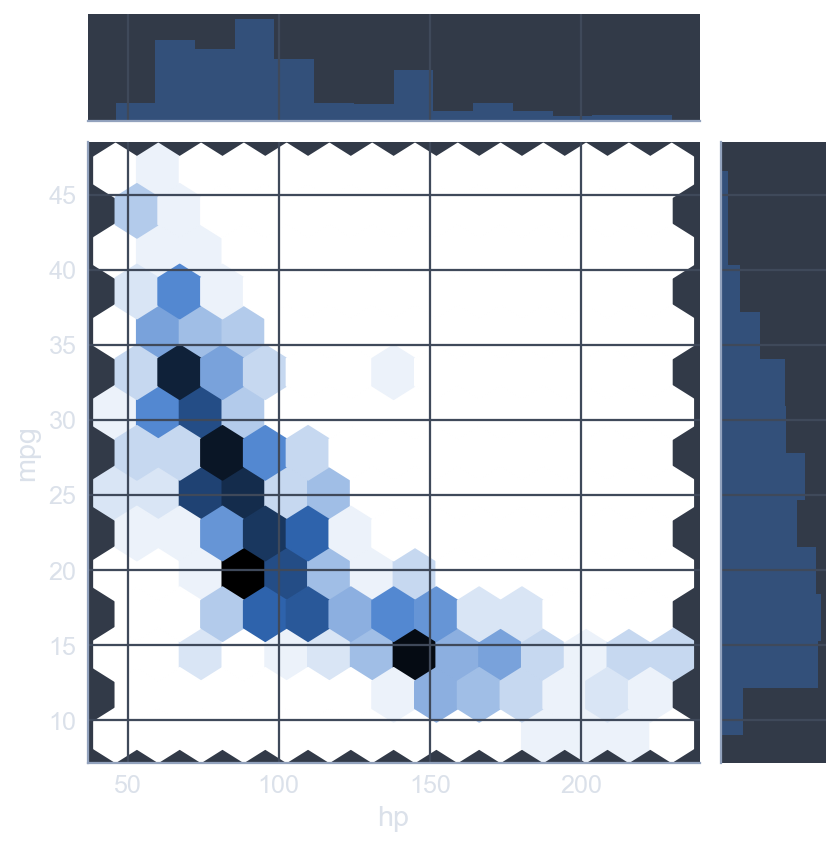

In [103]:
sns.jointplot(x='hp', y='mpg', data=auto, kind='hex')
plt.show()

### №30 Plotting distributions pairwise (1)

* Print the first five rows of the DataFrame `auto`
* Plot the joint distributions between columns from the entire DataFrame `auto`

    mpg   hp  origin
0  18.0   88      US
1   9.0  193      US
2  36.1   60    Asia
3  18.5   98      US
4  34.3   78  Europe


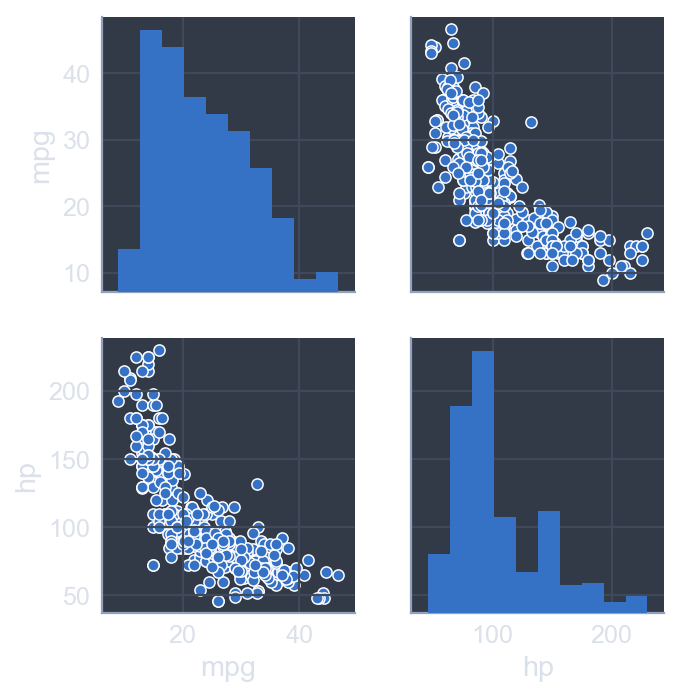

In [104]:
auto_2 = auto[['mpg', 'hp', 'origin']]
print(auto_2.head())

sns.pairplot(auto_2)
plt.show()

### №31 Plotting distributions pairwise (2)

1. Theory
    * You will display regressions as well as scatter plots in the off-diagonal subplots. You will do this with the argument `kind='reg'` (where `'reg'` means `'regression'`). Another option for `kind` is `'scatter'` (the default) that plots scatter plots in the off-diagonal subplots
    * You will also visualize the joint distributions separated by continent of origin. You will do this with the keyword argument `hue` specifying the `'origin'`
2. Task
    * Plot the pairwise joint distributions separated by continent of origin and display the regressions

    mpg   hp  origin
0  18.0   88      US
1   9.0  193      US
2  36.1   60    Asia
3  18.5   98      US
4  34.3   78  Europe


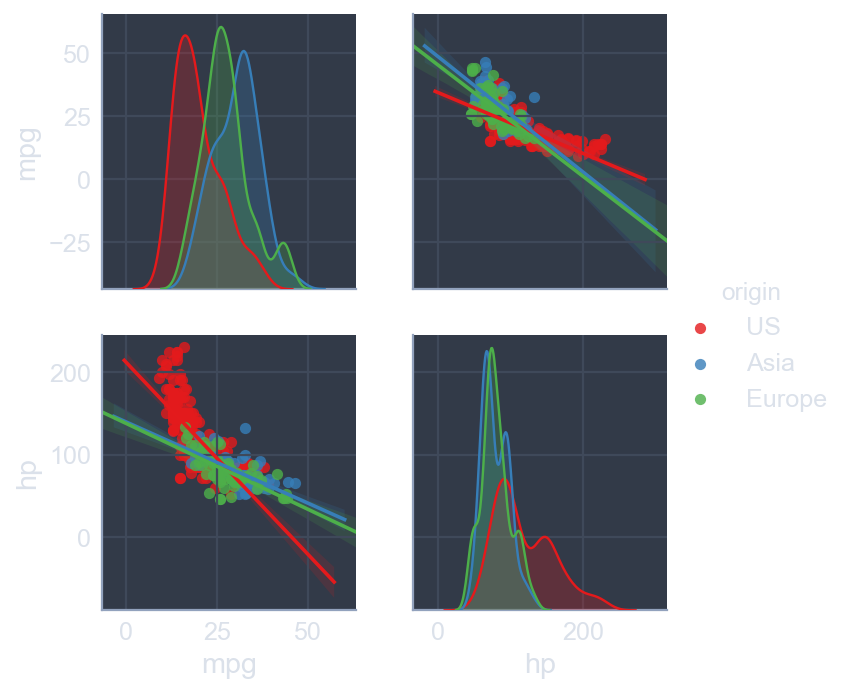

In [105]:
print(auto_2.head())

sns.pairplot(auto_2, kind='reg', hue='origin', palette='Set1')
plt.show()

### №32 Visualizing correlations with a heatmap3

* Print the covariance matrix `cov_matrix` to examine its contents and labels
* Plot the covariance matrix `cov_matrix` using `sns.heatmap()`

             mpg        hp    weight     accel     displ
mpg     1.000000 -0.778427 -0.832244  0.423329 -0.805127
hp     -0.778427  1.000000  0.864538 -0.689196  0.897257
weight -0.832244  0.864538  1.000000 -0.416839  0.932994
accel   0.423329 -0.689196 -0.416839  1.000000 -0.543800
displ  -0.805127  0.897257  0.932994 -0.543800  1.000000


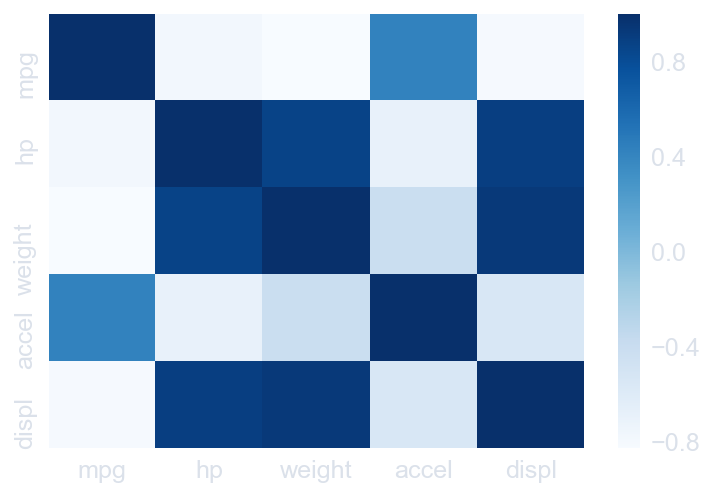

In [106]:
cov_matrix = auto[['mpg', 'hp', 'weight', 'accel', 'displ']].corr()
print(cov_matrix)

sns.heatmap(cov_matrix, cmap='Blues')
plt.show()

## Chapter 4. Analyzing time series and images

## 12. Visualizing time series

### Datetimes & time series

In [107]:
weather.head()

,Temperature,DewPoint,Pressure
Date,,,
2010-01-01 00:00:00,46.2,37.5,1.0
2010-01-01 01:00:00,44.6,37.1,1.0
2010-01-01 02:00:00,44.1,36.9,1.0
2010-01-01 03:00:00,43.8,36.9,1.0
2010-01-01 04:00:00,43.5,36.8,1.0


In [108]:
type(weather)

pandas.core.frame.DataFrame

In [109]:
type(weather.index)

pandas.core.indexes.datetimes.DatetimeIndex

### Plotting DataFrames

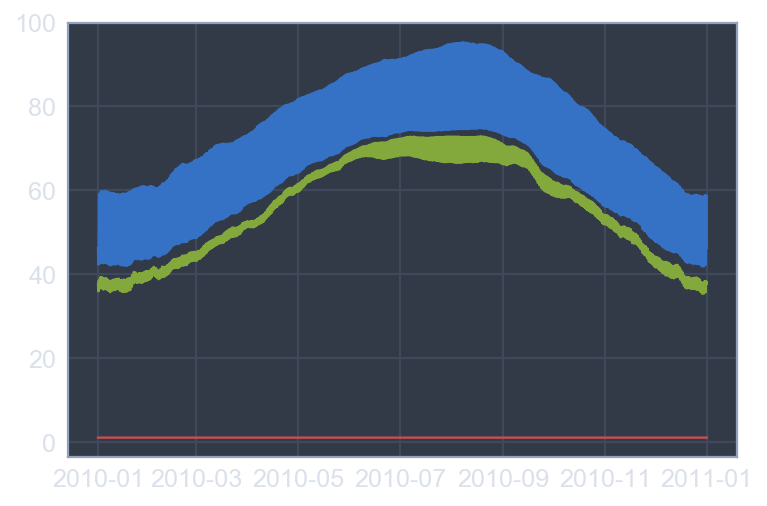

In [110]:
plt.plot(weather)
plt.show()

### Time series

* Pandas time series: *datetime* as index
* Datetime: represents periods or time-stamps
* Datetime index: specialized slicing
    * e.g., `weather[‘2010-07-04’]`
    * e.g., `weather[‘2010-03’:’2010-04’]`
    * e.g., `weather[‘2010-05’]`

### Slicing time series

In [111]:
temperature = weather['Temperature']

march_apr = temperature['2010-03':'2010-04'] # data of March & April 2010 only
march_apr.shape

(1463,)

In [112]:
march_apr.iloc[-4:] #extract last 4 entries from time

Date
2010-04-30 20:00:00    73.3
2010-04-30 21:00:00    71.3
2010-04-30 22:00:00    69.7
2010-04-30 23:00:00    68.5
Name: Temperature, dtype: float64

### Plotting time series slices

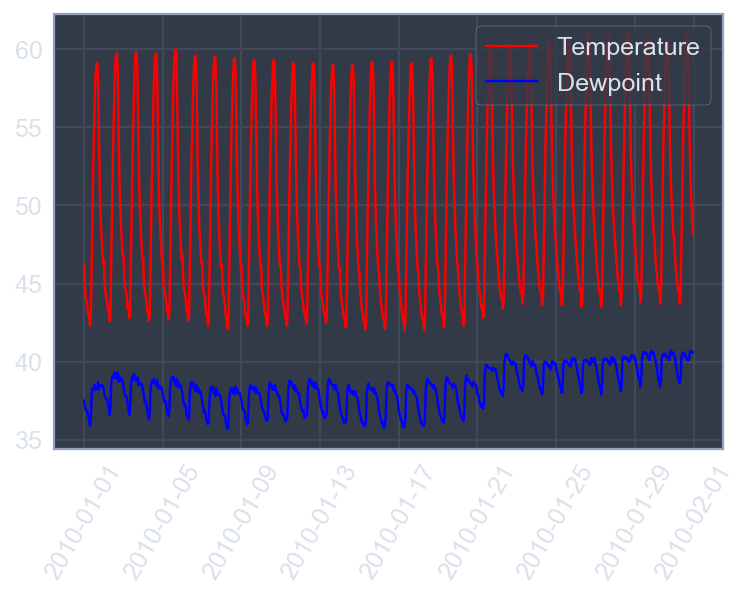

In [113]:
dew_point = weather['DewPoint']

plt.plot(temperature['2010-01'], color='red', label='Temperature')
plt.plot(dew_point['2010-01'], color='blue', label='Dewpoint')

plt.legend(loc='upper right')
plt.xticks(rotation=60)

plt.show()

### Selecting & formatting dates

In [114]:
jan = temperature['2010-01']

dates = jan.index[::96] # Pick every 4th day
print(dates)

DatetimeIndex(['2010-01-01', '2010-01-05', '2010-01-09', '2010-01-13',
               '2010-01-17', '2010-01-21', '2010-01-25', '2010-01-29'],
              dtype='datetime64[ns]', name='Date', freq=None)


In [115]:
labels = dates.strftime('%b %d') # Make formatted labels
print(labels)

Index(['Jan 01', 'Jan 05', 'Jan 09', 'Jan 13', 'Jan 17', 'Jan 21', 'Jan 25',
       'Jan 29'],
      dtype='object')


### Cleaning up ticks on axis

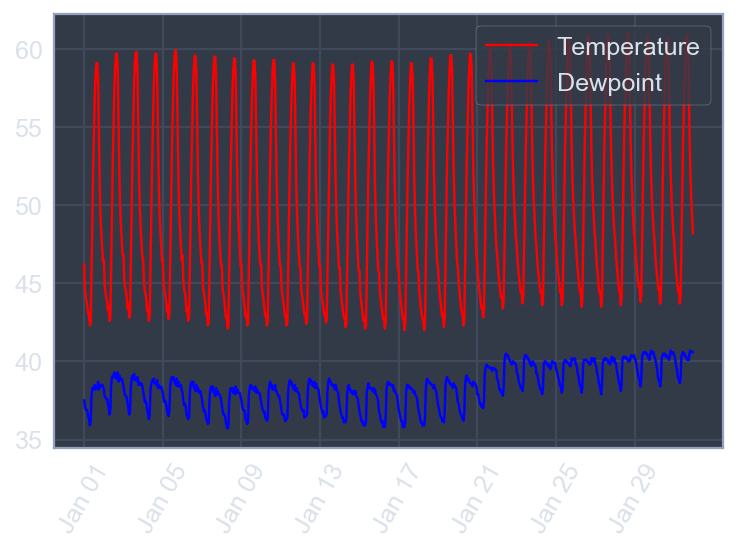

In [116]:
plt.plot(temperature['2010-01'], color='red', label='Temperature')
plt.plot(dew_point['2010-01'], color='blue', label='Dewpoint')

plt.xticks(dates, labels, rotation=60)
plt.legend(loc='upper right')

plt.show()

### №33 Multiple time series on common axes

* Plot the `aapl` time series in blue with a label of `'AAPL'`
* Plot the `ibm` time series in green with a label of `'IBM'`
* Plot the `csco` time series in red with a label of `'CSCO'`
* Plot the `msft` time series in magenta with a label of `'MSFT'`
* Specify a `rotation` of 60 for the xticks with `plt.xticks()`
* Add a legend in the `'upper left`' corner of the plot

In [117]:
stocks = pd.read_csv('Introduction_to_Data_Visualization_with_Python/stocks.csv',
                     index_col='Date', parse_dates=True)

aapl = stocks['AAPL']
ibm = stocks['IBM']
csco = stocks['CSCO']
msft = stocks['MSFT']

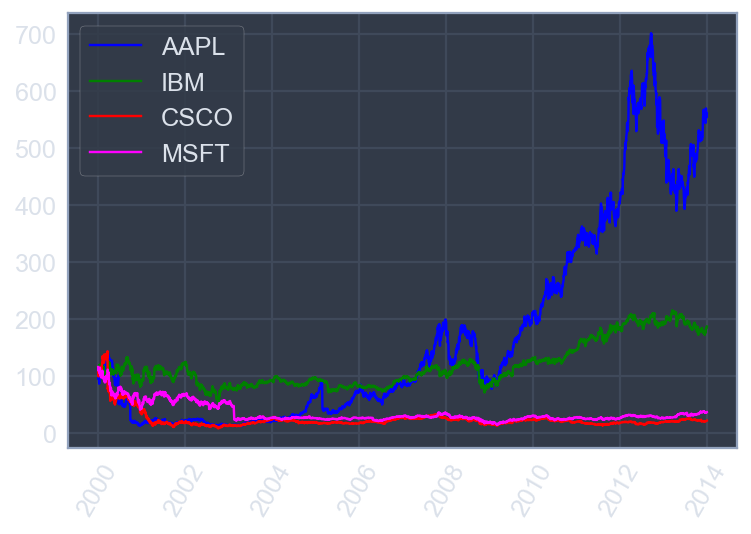

In [118]:
plt.plot(aapl, color='blue', label='AAPL')
plt.plot(ibm, color='green', label='IBM')
plt.plot(csco, color='red', label='CSCO')
plt.plot(msft, color='magenta', label='MSFT')

plt.legend(loc='upper left')
plt.xticks(rotation=60)

plt.show()

### №34 Multiple time series slices (1)

1. Theory
    * Unlike slicing from standard Python lists, tuples, and strings, when slicing time series by labels (and other pandas Series & DataFrames by labels), the slice includes the right-most portion of the slice. That is, extracting `my_time_series['1990':'1995']` extracts data from `my_time_series` corresponding to `1990`, `1991`, `1992`, `1993`, `1994`, and `1995` inclusive.
    * You can use partial strings or `datetime` objects for indexing and slicing from time series
2. Task
    * Plot the series `aapl` in `'blue'` in the top subplot of a vertically-stacked pair of subplots, with the xticks rotated to 45 degrees
    * Extract a slice named `view` from the series ``aapl`` containing data from the years 2007 to 2008 (inclusive)
    * Plot the slice `view` in black in the bottom subplot

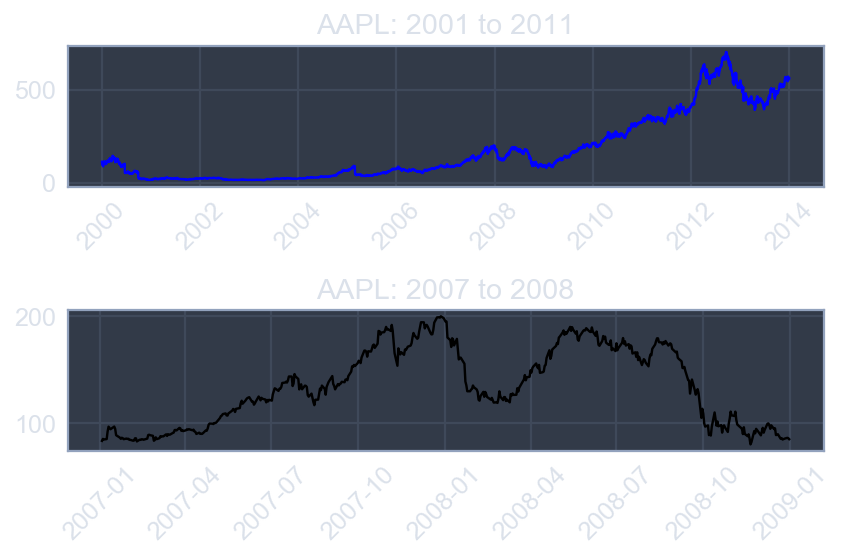

In [119]:
plt.subplot(2,1,1)
plt.xticks(rotation=45)
plt.title('AAPL: 2001 to 2011')
plt.plot(aapl, color='blue')

view = aapl['2007':'2008']

plt.subplot(2,1,2)
plt.xticks(rotation=45)
plt.title('AAPL: 2007 to 2008')
plt.plot(view, color='black')

plt.tight_layout()
plt.show()

### №35 Multiple time series slices (2)

1. Theory
    * Partial string indexing works without slicing as well. For instance, using `my_time_series['1995']`, `my_time_series['1999-05']`, and `my_time_series['2000-11-04']` respectively extracts views of the time series `my_time_series` corresponding to the entire year 1995, the entire month May 1999, and the entire day November 4, 2000
2. Task
    * Extract a slice named `view` from the series `aapl` containing data from November 2007 to April 2008 (inclusive)
    * Plot the slice view in 'red' in the top subplot of a vertically-stacked pair of subplots with the xticks rotated to 45 degrees
    * Reassign the slice `view` to contain data from the series `aapl` for January 2008
    * Plot the slice `view` in `'green'` in the bottom subplot with the xticks rotated to 45 degrees

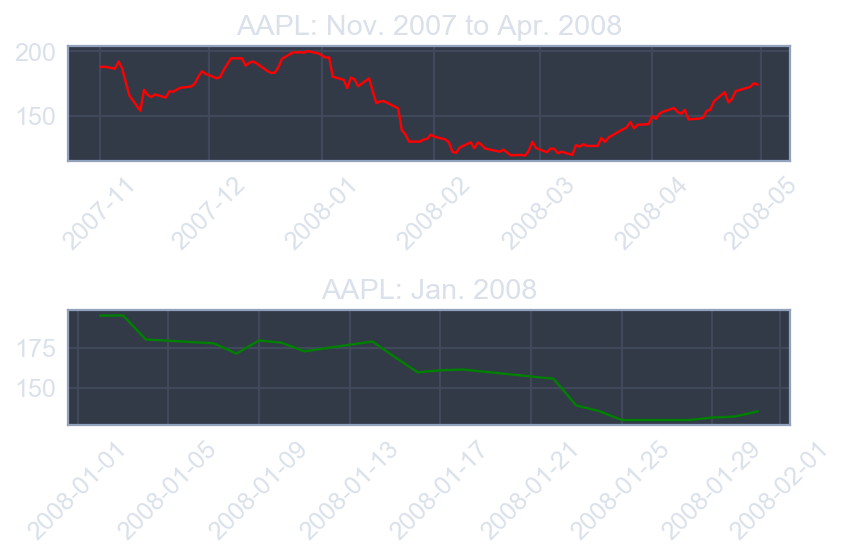

In [120]:
view = aapl['2007-11':'2008-04']

plt.subplot(2, 1, 1)
plt.plot(view, color='red')
plt.title('AAPL: Nov. 2007 to Apr. 2008')
plt.xticks(rotation=45)

view = aapl['2008-01']

plt.subplot(2, 1, 2)
plt.plot(view, color='green')
plt.title('AAPL: Jan. 2008')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### №36 Plotting an inset view

* Extract a slice of series `aapl` from November 2007 to April 2008 inclusive
* Plot the entire series `aapl`
* Create a set of axes with lower left corner (0.25, 0.5), width 0.35, and height 0.35. Pass these coordinates to `plt.axes()` as a list (all in units relative to the figure dimensions)
* Plot the sliced `view` in the current axes in `'red'`

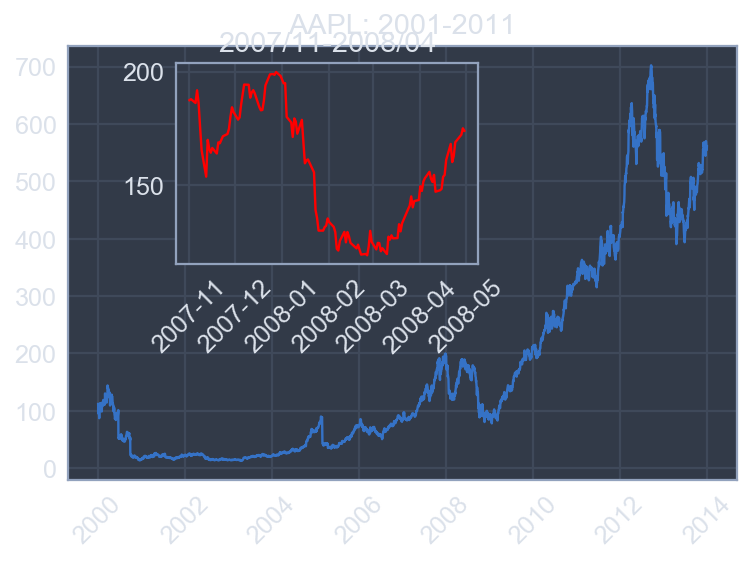

In [121]:
view = aapl['2007-11':'2008-04']

plt.plot(aapl)
plt.xticks(rotation=45)
plt.title('AAPL: 2001-2011')

plt.axes([0.25, 0.5, 0.35, 0.35])

plt.plot(view, color='red')
plt.xticks(rotation=45)
plt.title('2007/11-2008/04')

plt.show()

## 13. Time series with moving windows

### Hourly data over a year

In [122]:
dates = temperature.index[::744]

labels = dates.strftime('%b %Y')
print(labels)

Index(['Jan 2010', 'Feb 2010', 'Mar 2010', 'Apr 2010', 'May 2010', 'Jun 2010',
       'Jul 2010', 'Aug 2010', 'Sep 2010', 'Oct 2010', 'Nov 2010', 'Dec 2010'],
      dtype='object')


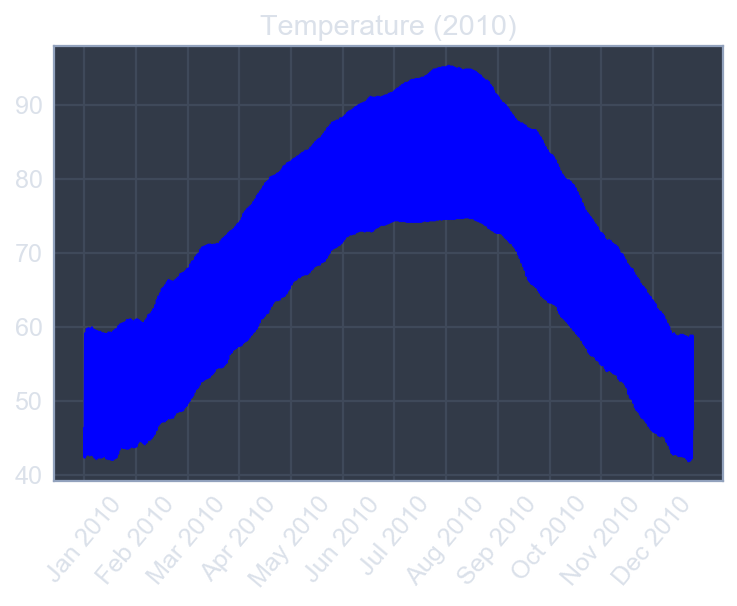

In [123]:
plt.plot(temperature, color='blue')

plt.title('Temperature (2010)')
plt.xticks(dates, labels, rotation=50)

plt.show()

### Zooming in

In [124]:
jul = temperature['2010-07']
dates = jul[71:].index[::72]

labels = dates.strftime('%b %d %Y')
print(labels)

Index(['Jul 03 2010', 'Jul 06 2010', 'Jul 09 2010', 'Jul 12 2010',
       'Jul 15 2010', 'Jul 18 2010', 'Jul 21 2010', 'Jul 24 2010',
       'Jul 27 2010', 'Jul 30 2010'],
      dtype='object')


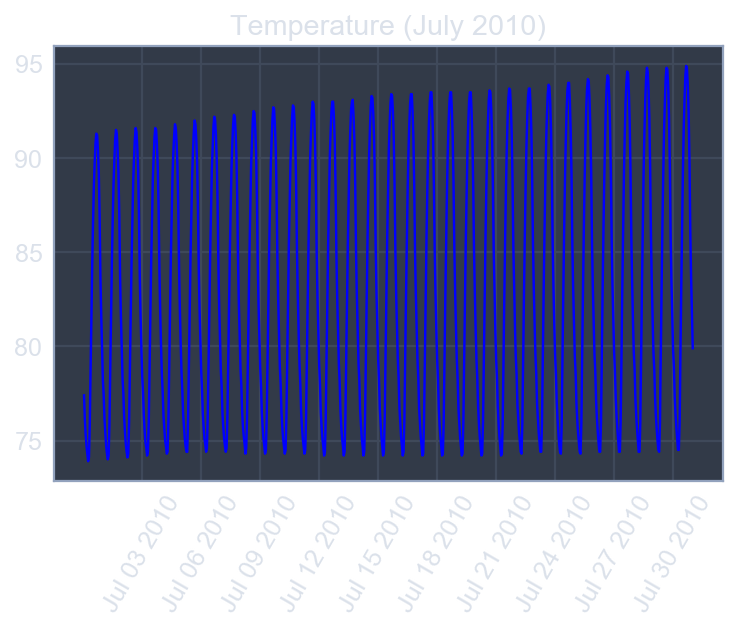

In [125]:
plt.plot(jul, color='blue')

plt.title('Temperature (July 2010)')
plt.xticks(dates, labels, rotation=60)

plt.show()

### Moving windows & time series

* Moving window calculations
    * Averages
    * Medians
    * Standard deviations
* Extracts information on longer time scales
* See Pandas courses on how to compute

### Moving averages

In [126]:
smoothed = weather[['Temperature']]
smoothed['1d'] = smoothed['Temperature'].rolling(24).mean()
smoothed['3d'] = smoothed['Temperature'].rolling(72).mean()
smoothed['7d'] = smoothed['Temperature'].rolling(168).mean()
smoothed['14d'] = smoothed['Temperature'].rolling(336).mean()
#smoothed.drop(columns='Temperature', inplace=True)
smoothed.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8759 entries, 2010-01-01 00:00:00 to 2010-12-31 23:00:00
Data columns (total 5 columns):
Temperature    8759 non-null float64
1d             8736 non-null float64
3d             8688 non-null float64
7d             8592 non-null float64
14d            8424 non-null float64
dtypes: float64(5)
memory usage: 730.6 KB


In [127]:
print(smoothed.iloc[:3,:])

                     Temperature  1d  3d  7d  14d
Date                                             
2010-01-01 00:00:00         46.2 NaN NaN NaN  NaN
2010-01-01 01:00:00         44.6 NaN NaN NaN  NaN
2010-01-01 02:00:00         44.1 NaN NaN NaN  NaN


### Viewing 24 hour averages

In [128]:
dates = smoothed.index[::744]
labels = dates.strftime('%b %Y')

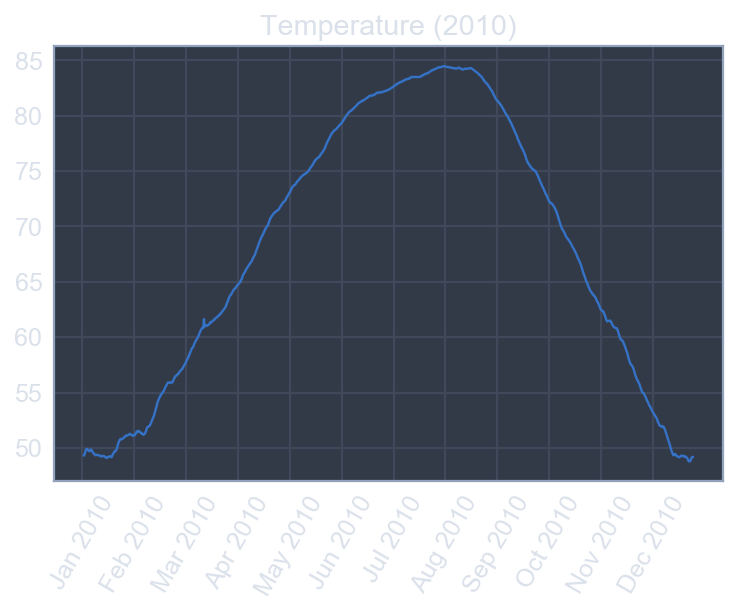

In [129]:
plt.plot(smoothed['1d']) # moving average over 24 hours
plt.title('Temperature (2010)')
plt.xticks(dates, labels, rotation=60)

plt.show()

### Viewing all moving averages

In [130]:
dates = smoothed['2010-01'].index[::72]
labels = dates.strftime('%b %d %Y')

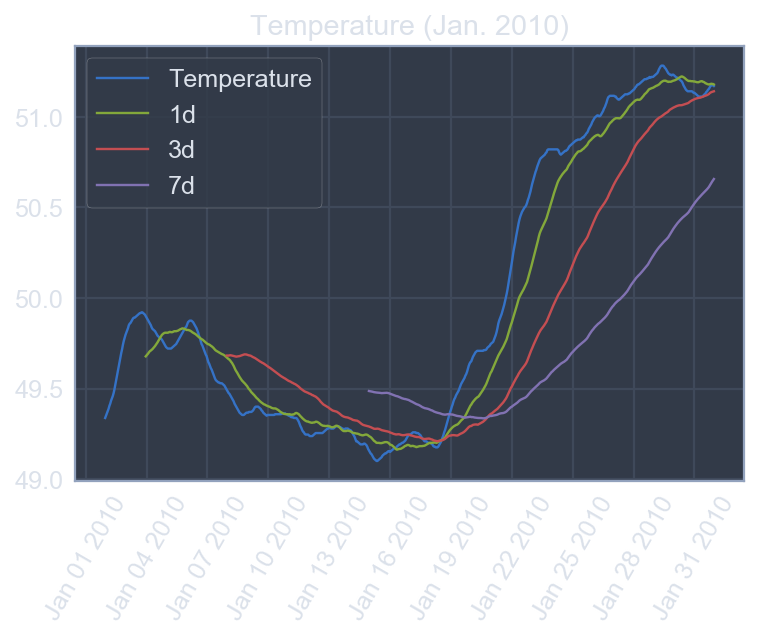

In [131]:
plt.plot(smoothed.loc['2010-01', ['1d', '3d', '7d', '14d']]) # plot DataFrame for January
plt.legend(smoothed.columns[:-1])
plt.title('Temperature (Jan. 2010)')
plt.xticks(dates, labels, rotation=60)
plt.show()

### Moving standard deviations

In [132]:
variances = weather[['Temperature']]
variances['1d'] = variances['Temperature'].rolling(24).std()
variances['3d'] = variances['Temperature'].rolling(72).std()
variances['7d'] = variances['Temperature'].rolling(168).std()
variances['14d'] = variances['Temperature'].rolling(336).std()
variances.drop(columns='Temperature', inplace=True)

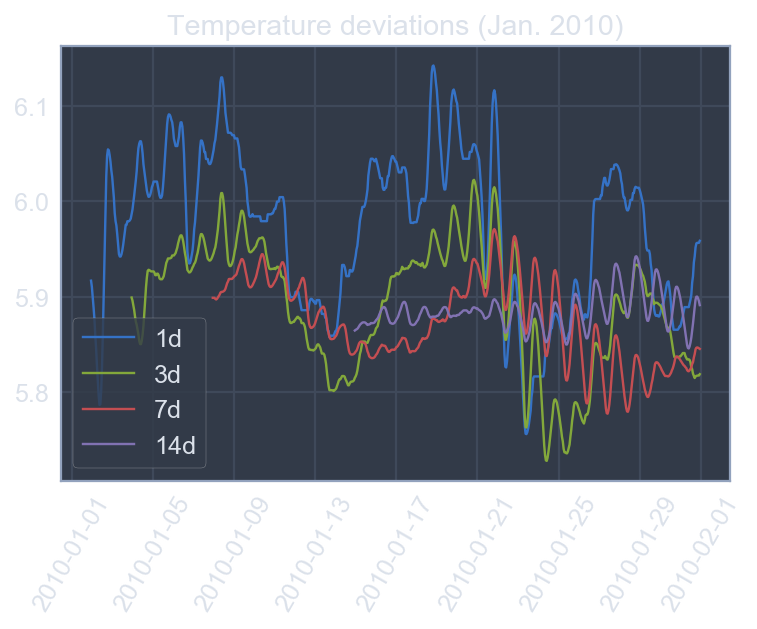

In [133]:
plt.plot(variances['2010-01'])
plt.title('Temperature deviations (Jan. 2010)')
plt.xticks(rotation=60)
plt.legend(variances.columns)

plt.show()

### №37 Plotting moving averages

* In the top left subplot, plot the 30-day moving averages series `mean_30` in `'green'`
* In the top right subplot, plot the 75-day moving averages series `mean_75` in `'red'`
* In the bottom left subplot, plot the 125-day moving averages series `mean_125` in `'magenta'`
* In the bottom right subplot, plot the 250-day moving averages series `mean_250` in `'cyan'`

In [134]:
mean_30 = aapl.rolling(30).sum()
mean_75 = aapl.rolling(75).sum()
mean_125 = aapl.rolling(125).sum()
mean_250 = aapl.rolling(250).sum()

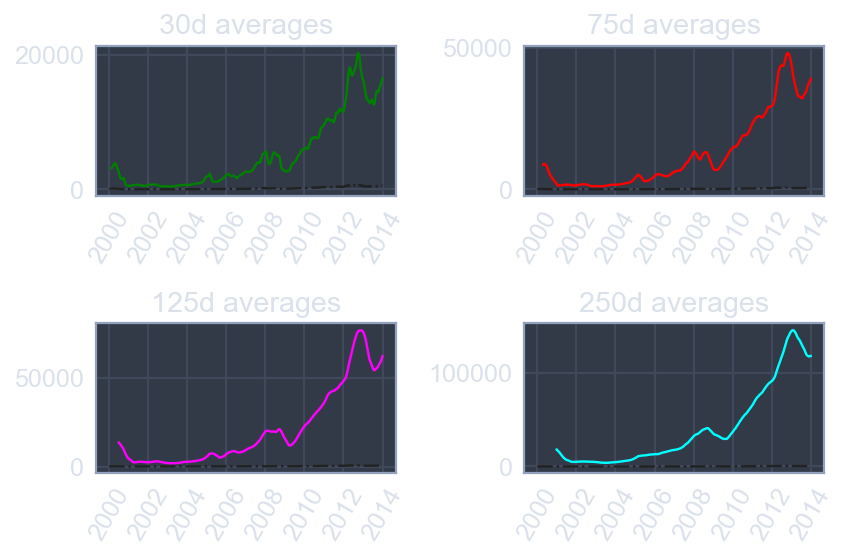

In [135]:
plt.subplot(2, 2, 1)
plt.plot(mean_30, color='green')
plt.plot(aapl, 'k-.')
plt.xticks(rotation=60)
plt.title('30d averages')

plt.subplot(2, 2, 2)
plt.plot(mean_75, 'red')
plt.plot(aapl, 'k-.')
plt.xticks(rotation=60)
plt.title('75d averages')

plt.subplot(2, 2, 3)
plt.plot(mean_125, color='magenta')
plt.plot(aapl, 'k-.')
plt.xticks(rotation=60)
plt.title('125d averages')

plt.subplot(2, 2, 4)
plt.plot(mean_250, color='cyan')
plt.plot(aapl, 'k-.')
plt.xticks(rotation=60)
plt.title('250d averages')

plt.tight_layout()
plt.show()

### №38 Plotting moving standard deviations

* Produce a single plot with four curves overlayed:
* the series `std_30` in `'red'` (with corresponding label `'30d'`)
* the series `std_75` in `'cyan'` (with corresponding label `'75d'`)
* the series `std_125` in `'green'` (with corresponding label `'125d'`)
* the series `std_250` in `'magenta'` (with corresponding label `'250d'`)
* Add a legend to the `'upper left'` corner of the plot

In [136]:
std_30 = aapl.rolling(30).std()
std_75 = aapl.rolling(75).std()
std_125 = aapl.rolling(125).std()
std_250 = aapl.rolling(250).std()

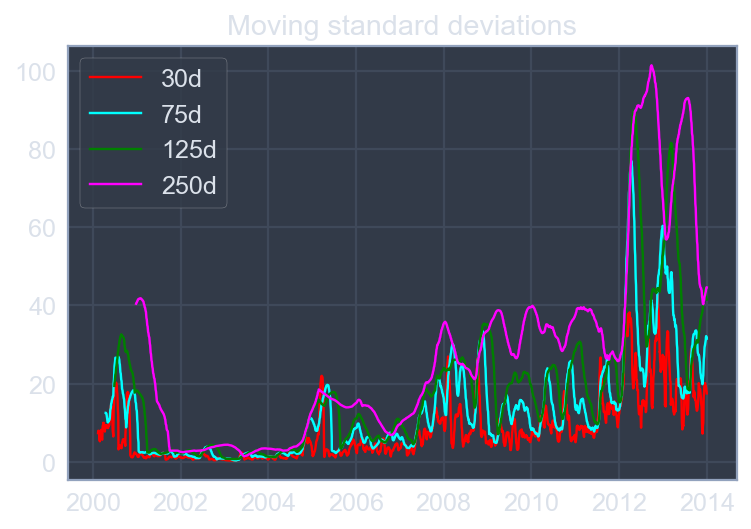

In [137]:
plt.plot(std_30, color='red', label='30d')
plt.plot(std_75, color='cyan', label='75d')
plt.plot(std_125, color='green', label='125d')
plt.plot(std_250, color='magenta', label='250d')

plt.legend(loc='upper left')
plt.title('Moving standard deviations')

plt.show()

### 14. Histogram equalization in images

### Original image

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/low-contrast-moon.jpg' alt='Moon' width=300 align='left'>

### Equalized image

<img src='Introduction_to_Data_Visualization_with_Python/Pictures/high-contrast-moon.jpg' alt='Equalized Moon image' width=300 align='left'>

### Image histograms

In [138]:
orig = plt.imread('Introduction_to_Data_Visualization_with_Python/Pictures/low-contrast-moon.jpg')
pixels = orig.flatten()

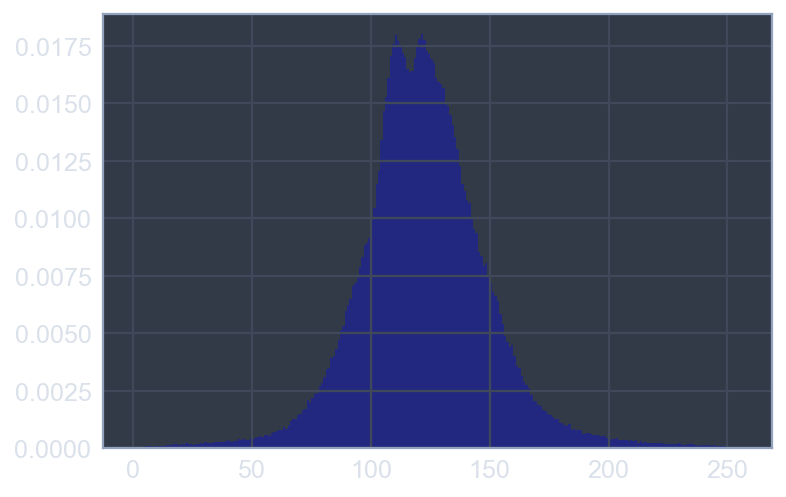

In [139]:
plt.hist(pixels, bins=256, range=(0,256), normed=True, color='blue', alpha=0.3)
plt.show()

In [140]:
minval, maxval = orig.min(), orig.max()
print(minval, maxval)

0 255


### Rescaling the image

In [141]:
rescaled_orig = (255 / (maxval - minval)) * (orig - minval) 
print(rescaled_orig.min(), rescaled_orig.max())

0.0 255.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


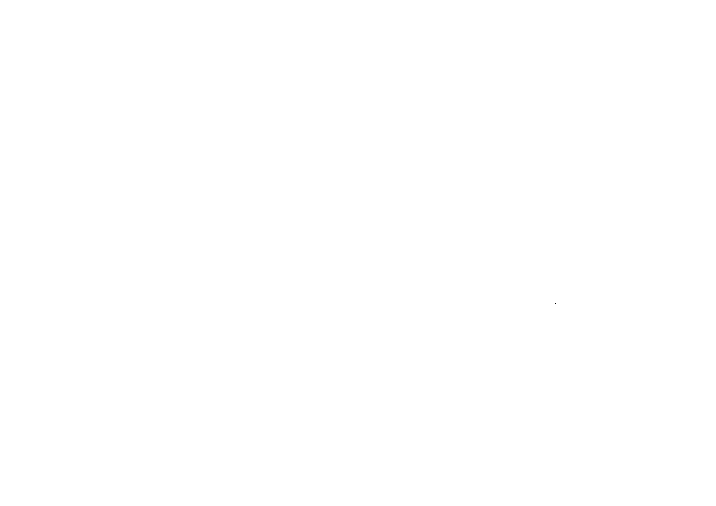

In [142]:
plt.imshow(rescaled_orig)
plt.axis('off')
plt.show()

### Original & rescaled histograms

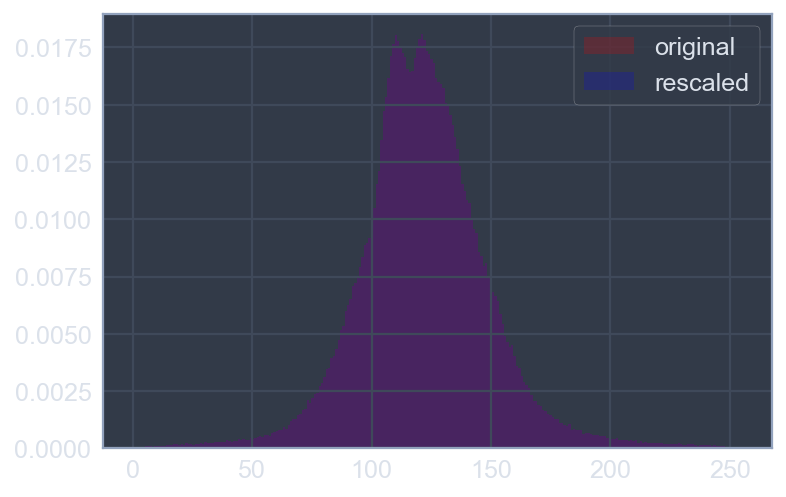

In [143]:
plt.hist(orig.flatten(), bins=256, range=(0,255), normed=True, color='red', alpha=0.2)
plt.hist(rescaled_orig.flatten(), bins=256, range=(0,255), normed=True, color='blue', alpha=0.2)

plt.legend(['original', 'rescaled'])
plt.show()

### Image histogram & CDF

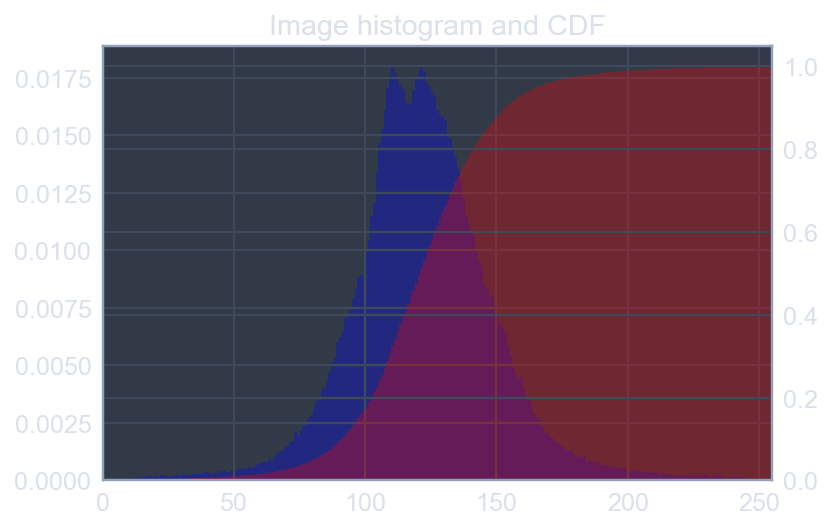

In [144]:
plt.hist(pixels, bins=256, range=(0,256), normed=True, color='blue', alpha=0.3)
plt.twinx()

orig_cdf, bins, patches = plt.hist(pixels, cumulative=True, bins=256, range=(0,256),
                                   normed=True, color='red', alpha=0.3)
plt.title('Image histogram and CDF')
plt.xlim((0, 255))

plt.show()

### Equalizing intensity values

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


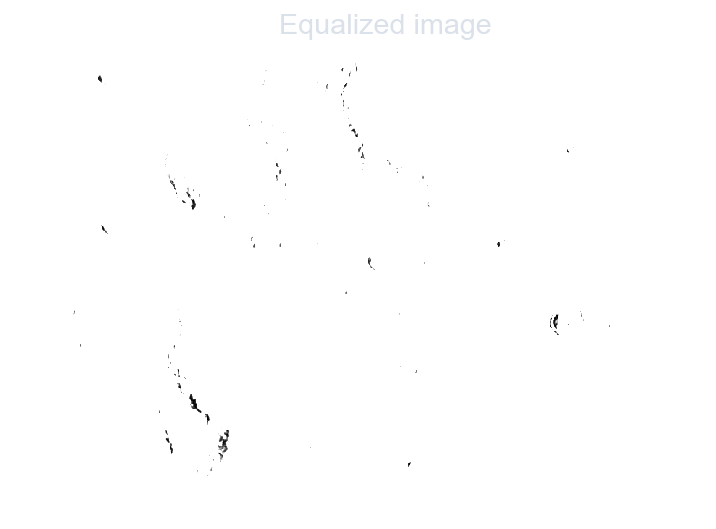

In [145]:
new_pixels = np.interp(pixels, bins[:-1], orig_cdf*255)
new = new_pixels.reshape(orig.shape)

plt.imshow(new)
plt.axis('off')
plt.title('Equalized image')

plt.show()

### Equalized histogram & CDF

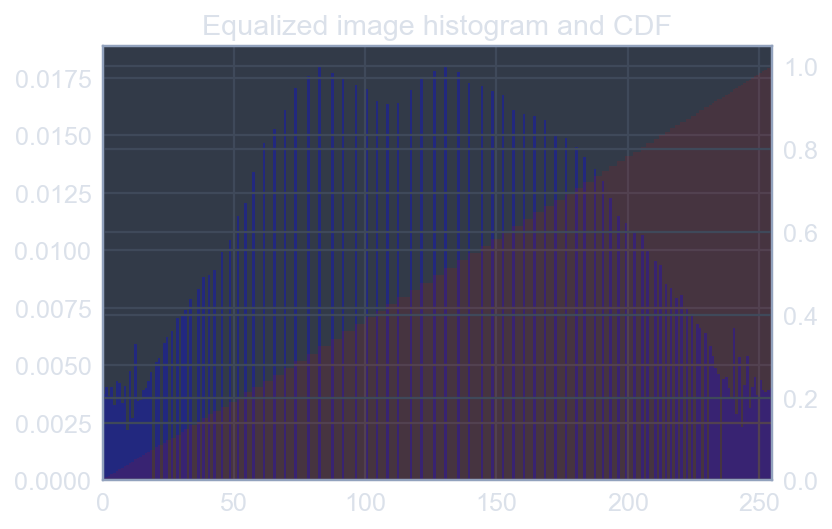

In [146]:
plt.hist(new_pixels, bins=256, range=(0,256), normed=True, color='blue', alpha=0.3)
plt.twinx()
plt.hist(new_pixels, cumulative=True, bins=256, range=(0,256), normed=True, color='red', alpha=0.1)
plt.title('Equalized image histogram and CDF')
plt.xlim((0, 255))

plt.show()

### №39 Extracting a histogram from a grayscale image

* Load data from the file `'640px-Unequalized_Hawkes_Bay_NZ.jpg'` into an array
* Display `image` with a color map of `'gray'` in the top subplot
* Flatten `image` into a 1-D array using the `.flatten()` method
* Display a histogram of `pixels` in the bottom subplot
* Use histogram options `bins=64`, `range=(0,256)`, and `normed=True` to control numerical binning and the vertical scale
* Use plotting options `color='red'` and `alpha=0.4` to tailor the color and transparency

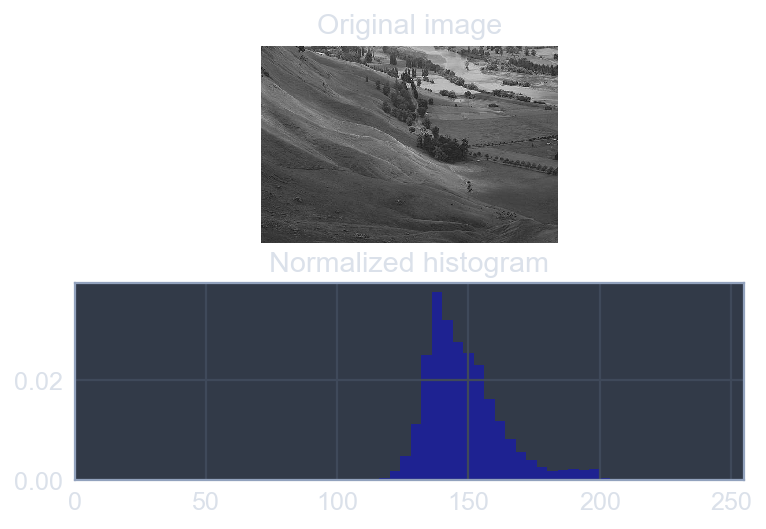

In [147]:
image = plt.imread('Introduction_to_Data_Visualization_with_Python/Pictures/640px-Unequalized_Hawkes_Bay_NZ.jpg')

plt.subplot(2,1,1)
plt.title('Original image')
plt.axis('off')
plt.imshow(image, cmap='gray')

pixels = image.flatten()

plt.subplot(2,1,2)
plt.xlim((0,255))
plt.title('Normalized histogram')
plt.hist(pixels, bins=64, range=(0, 256), normed=True, color='blue', alpha=0.4)

plt.show()

### №40 Cumulative Distribution Function from an image histogram

* First, use `plt.hist()` to plot the histogram of the 1-D array pixels in the bottom subplot
* Use the histogram options `bins=64`, `range=(0,256)`, and `normed=False`
* Use the plotting options `alpha=0.4` and `color='red'` to make the overlayed plots easier to see
* Second, use `plt.twinx()` to overlay plots with different vertical scales on a common horizontal axis
* Third, call `plt.hist()` again to overlay the CDF in the bottom subplot
* Use the histogram options `bins=64`, `range=(0,256)`, and `normed=True`
* This time, also use `cumulative=True` to compute and display the CDF
* Also, use `alpha=0.4` and `color='blue'` to make the overlayed plots easier to see

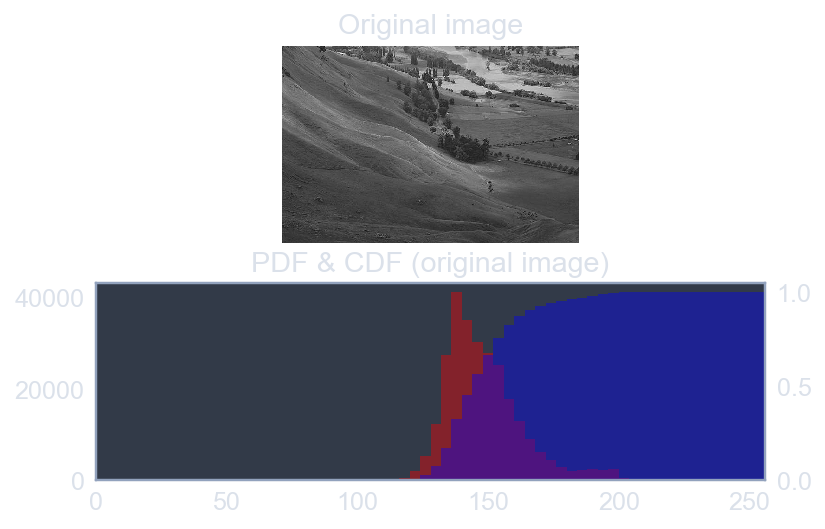

In [148]:
plt.subplot(2,1,1)
plt.imshow(image, cmap='gray')
plt.title('Original image')
plt.axis('off')

pixels = image.flatten()

plt.subplot(2,1,2)
pdf = plt.hist(pixels, bins=64, range=(0,256), normed=False, color='red', alpha=0.4)
plt.grid('off')

plt.twinx()

cdf = plt.hist(pixels, bins=64, range=(0,256), normed=True,
               cumulative=True,color='blue', alpha=0.4)
               
plt.xlim((0,256))
plt.grid('off')
plt.title('PDF & CDF (original image)')

plt.show()

### №41 Equalizing an image histogram

* Use the NumPy array method `.reshape()` to create a 2-D array `new_image` from the 1-D array `new_pixels`. The resulting `new_image` should have the same shape as `image.shape`
* Display `new_image` with a `'gray'` color map to display the sharper, equalized image
* Plot the PDF of `new_pixels` in `'red'`
* Use `plt.twinx()` to overlay plots with different vertical scales on a common horizontal axis.
* Plot the CDF of `new_pixels` in `'blue'`

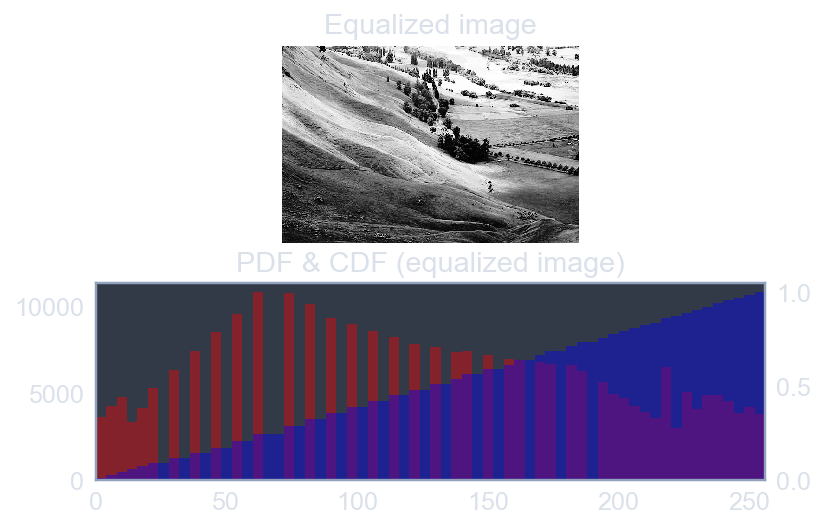

In [149]:
pixels = image.flatten()

cdf, bins, patches = plt.hist(pixels, bins=256, range=(0,256), normed=True, cumulative=True)
new_pixels = np.interp(pixels, bins[:-1], cdf*255)

new_image = new_pixels.reshape(image.shape)

plt.subplot(2,1,1)
plt.title('Equalized image')
plt.axis('off')
plt.imshow(new_image, cmap='gray')

plt.subplot(2,1,2)
pdf = plt.hist(new_pixels, bins=64, range=(0,256), normed=False, color='red', alpha=0.4)
plt.grid('off')

plt.twinx()
plt.xlim((0,256))
plt.grid('off')

plt.title('PDF & CDF (equalized image)')

cdf = plt.hist(new_pixels, bins=64, range=(0,256), cumulative=True,
               normed=True,color='blue', alpha=0.4)
plt.show()

### №42 Extracting histograms from a color image

* Display image in the top subplot of a 2×1 subplot grid. Don't use a colormap here
* Flatten the 2-D arrays `red`, `green`, and `blue` into 1-D arrays
* Display three histograms in the bottom subplot: one for `red_pixels`, one for `green_pixels`, and one for `blue_pixels`. For each, use 64 bins and specify a translucency of `alpha=0.2`

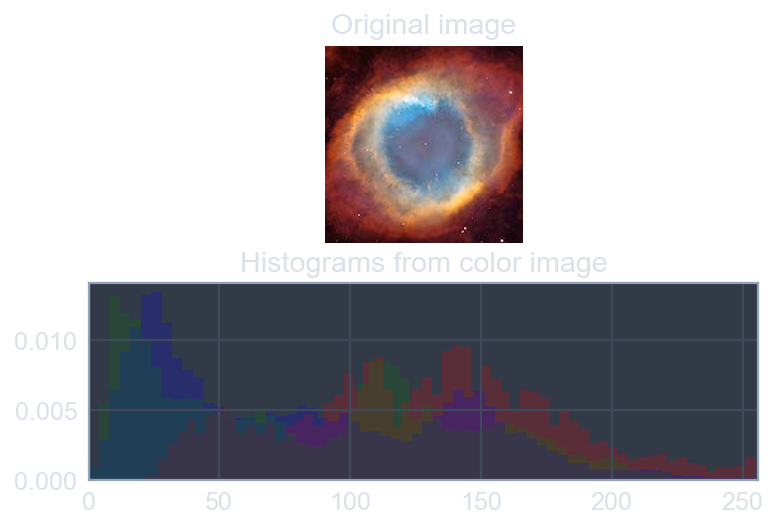

In [150]:
image = plt.imread('Introduction_to_Data_Visualization_with_Python/Pictures/hs-2004-32-b-small_web.jpg')

plt.subplot(2,1,1)
plt.title('Original image')
plt.axis('off')
plt.imshow(image)

red, green, blue = image[:,:,0], image[:,:,1], image[:,:,2]

red_pixels = red.flatten()
blue_pixels = blue.flatten()
green_pixels = green.flatten()

plt.subplot(2,1,2)
plt.title('Histograms from color image')
plt.xlim((0,256))
plt.hist(red_pixels, bins=64, normed=True, color='red', alpha=0.2)
plt.hist(blue_pixels, bins=64, normed=True, color='blue', alpha=0.2)
plt.hist(green_pixels, bins=64, normed=True, color='green', alpha=0.2)

plt.show()

### №43 Extracting bivariate histograms from a color image

* Make a 2-D histogram in the top left subplot showing the joint variation of `red_pixels` (on the x-axis) and `green_pixels` (on the y-axis). Use `bins=(32,32)` to control binning
* Make a 2-D histogram in the top right subplot showing the joint variation of `green_pixels` (on the x-axis) and `blue_pixels` (on the y-axis). Use `bins=(32,32)` to control binning
* Make a 2-D histogram in the bottom left subplot showing the joint variation of `blue_pixels `(on the x-axis) and `red_pixels` (on the y-axis). Use `bins=(32,32)` to control binning

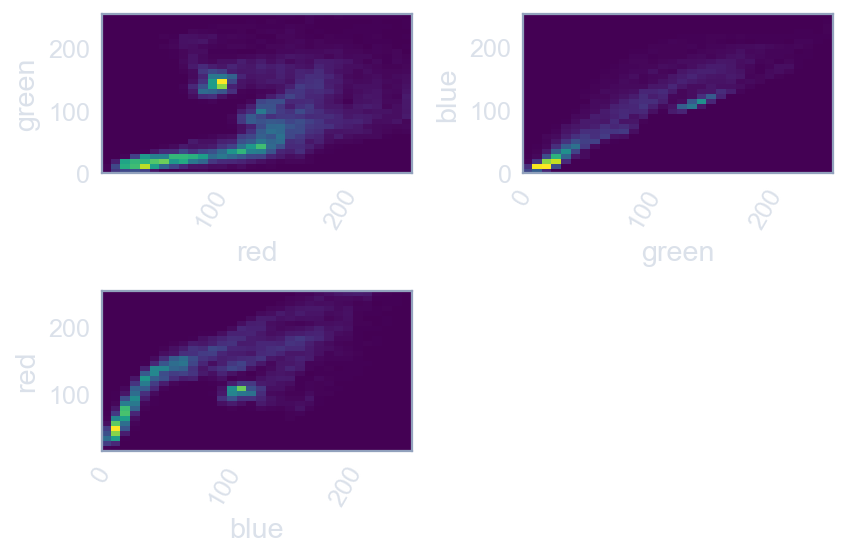

In [151]:
red, blue, green = image[:,:,0], image[:,:,1], image[:,:,2]
red_pixels = red.flatten()
blue_pixels = blue.flatten()
green_pixels = green.flatten()

plt.subplot(2,2,1)
plt.grid('off') 
plt.xticks(rotation=60)
plt.xlabel('red')
plt.ylabel('green')
plt.hist2d(x=red_pixels, y=green_pixels, bins=(32, 32), cmap='viridis')

plt.subplot(2,2,2)
plt.grid('off')
plt.xticks(rotation=60)
plt.xlabel('green')
plt.ylabel('blue')
plt.hist2d(x=green_pixels, y=blue_pixels, bins=(32, 32), cmap='viridis')

plt.subplot(2,2,3)
plt.grid('off')
plt.xticks(rotation=60)
plt.xlabel('blue')
plt.ylabel('red')
plt.hist2d(x=blue_pixels, y=red_pixels, bins=(32, 32), cmap='viridis')

plt.tight_layout()
plt.show()